# **BUSINESS CASE 4 - GROUP 13**

# **Building an Early Warning System**

### **Institution**: Politecnico di Milano
### **Coursework**:  FINTECH - A.Y. 2024-2025
### **Authors**:     Manfredi Giacomo, Pescotto Leonardo,Tarditi Andrea, Toia Nicolò, Torba Matteo

# **Abstract**

This project aims to investigate and enhance the performance of various statistical and machine learning methods in the context of an Early Warning System (EWS). Specifically, we focus on detecting anomalies and significant deviations within two datasets: a synthetic dataset and a real dataset containing financial and economic indicators spanning various asset classes, interest rates, currency exchanges, and market indices.

Initially, the dataset exploration, exploratory data analysis (EDA), and the definition of evaluation metrics were systematically performed to establish a robust baseline for comparison across all investigated models. To achieve consistency and facilitate meaningful comparisons, we standardized our evaluation procedure based on the methodologies and metrics discussed in class.

Building upon foundational approaches like **Multivariate Gaussian (MVG)** methods, we introduced enhancements such as employing Optuna for hyperparameter optimization and implementing the Ledoit-Wolf shrinkage estimator to improve covariance matrix estimation stability and performance. Furthermore, we explored deep learning approaches such as **Autoencoders** to capture intricate patterns and reduce dimensional complexity in anomaly detection.

Expanding the analysis beyond classical techniques, we implemented and investigated several advanced methods:

* **Generative Adversarial Networks (GAN)**: Exploited for their ability to learn complex data distributions and generate realistic synthetic samples.
* **Long Short-Term Memory networks (LSTM)**: Chosen for their effectiveness in capturing temporal dependencies and sequential data dynamics.
* **COPOD (Copula-based Outlier Detection)**: Utilized to leverage the power of copula functions to better detect outliers in multidimensional data.
* **Cost-sensitive approach**: Addressed the imbalance and differing costs of misclassification explicitly by integrating a cost-sensitive modeling framework.
* **Ensemble methods**: Combined predictions from various models (Autoencoder, Isolation Forest, and Local Outilier Factor) to exploit their complementary strengths and enhance overall predictive reliability and robustness. 

Each of these approaches was meticulously chosen to leverage specific theoretical and practical advantages, such as improved anomaly detection accuracy, handling of high-dimensional data, capturing temporal dynamics, and sensitivity to class imbalance.

<br>


# **Table of Contents**

1. [Introduction: an Early Warning System based on Anomaly Detection](#1-introduction-an-early-warning-system-based-on-anomaly-detection)

   1.1 [Introduction to Anomaly Detection - using artificial data](#11-introduction-to-anomaly-detection---using-artificial-data)

2. [Real World Dataset Exploration](#2-real-world-dataset-exploration)
3. [Exploratory Data Analysis (EDA): Stationarity analysis and feature preparation](#3-exploratory-data-analysis-eda-stationarity-analysis-and-feature-preparation)
4. [Metrics Definition](#4-metrics-definition)
5. [Enhanced Multivariate Gaussian (MVG) with Optuna and Ledoit-Wolf](#5-enhanced-multivariate-gaussian-mvg-with-optuna-and-ledoit-wolf)
6. [Autoencoder](#6-autoencoder)
7. [Generative Adversarial Networks (GAN)](#7-generative-adversarial-networks-gan)

   7.1 [Vanilla GAN for Anomaly Detection](#71-vanilla-gan-for-anomaly-detection)
   
   7.2 [f-AnoGAN (Feature-Matching GAN for Anomaly Detection)](#72-f-anogan-feature-matching-gan-for-anomaly-detection)

8. [Long Short-Term Memory Networks (LSTM)](#8-long-short-term-memory-networks-lstm)
9. [COPOD - Copula-based Outlier Detection](#9-copod---copula-based-outlier-detection)
10. [Isolation Forest](#10-isolation-forest)
11. [Local Outlier Factor (LOF)](#11-local-outlier-factor-lof)
12. [Ensemble Method](#12-ensemble-method)
13. [Stacked Ensemble Classifier](#13-stacked-ensemble-classifier)
14. [Comparative Analysis and Evaluation](#14-comparative-analysis-and-evaluation)
15. [Bibliography](#15-bibliography)


# 1. Introduction: an Early Warning System based on Anomaly Detection

Financial assets, in the medium to long term, tend to generate **positive risk premia and positive real returns** - see for example [UBS Global Investment Returns Yearbook 2025](https://www.ubs.com/global/en/investment-bank/insights-and-data/2025/global-investment-returns-yearbook-2025.html), supported by basic economic principles:

- For **equities**, the return on capital invested in business activities.
- For **bonds**, the remuneration for:
  - the temporary deprivation of money (and consumption).
  - and the compensation for default risk.

However, financial markets periodically experience **crises** in which asset returns deviate from these principles for periods that may be short... or not.

Investor **risk appetite** fluctuates over time—rising in optimistic phases and falling during times of uncertainty. As a result, asset prices move accordingly.

In market jargon, we refer to:

- **Risk-on** situations (normal):  
  >Investors are willing to take risks and bid up the prices of risky assets (equities, corporate bonds, riskier sovereign bonds, most commodities, etc.).

- **Risk-off** situations (abnormal):  
  >Investors become more risk-averse, sell risky assets (driving prices down), and shift to safer investments (cash, short-term bonds of safe-haven countries, sometimes gold, etc.).  
  These periods are typically associated with **high systemic risk**.

Financial institutions would like to detect risk-on vs. risk-off regimes **as early as possible**: identifying these situations early – it's more *nowcasting* than *forecasting* – as it is often enough to significantly outperform the market and increase your reputation as an asset manager.

So, this is our motivation.

<br>

## What are we trying to do?

We try to algorithmically detect risk-on vs. risk-off regimes using Data Science, a relatively new approach.

To formalize this:

- **Risk-on** periods ⟶ _Normal_
- **Risk-off** periods ⟶ _Abnormal_

We can use Machine Learning to create a model that identifies **financial anomalies** in real time: this would be an example of an **Early Warning System** built using **Anomaly Detection** techniques.

> More precisely, we are dealing with what is typically known as **Novelty Detection**, as opposed to **Outlier Detection**, both subfields of Anomaly Detection. Here the taxonomy and nomenclature are not univocal (generally: Novelty = supervised or semi-supervised, and Outlier = unsupervised), and to tell the truth not even very interesting: the important thing is to solve a problem...

This is just **one possible approach** to building such a an Early Warning System.  We focus on it because it's based on a widely used class of ML models and allows us to explore important ideas in unsupervised and supervised learning, useful for many other purposes in the Fintech field.

**Further reading:**  
A comprehensive survey of systemic risk and anomaly detection techniques is available here: [A Survey of Systemic Risk Analytics – OFR Working Paper 0001](https://www.financialresearch.gov/working-papers/files/.OFRwp0001_BisiasFloodLoValavanis_ASurveyOfSystemicRiskAnalytics.pdf)


See also, especially for the bibliography and to understand the variety of approaches that can be adopted:

- [Risk Measurement and Systemic Risk](https://www.bis.org/cgfs/conf/mar02.htm)
- [A Systematic Review of Early Warning System in Finance](https://arxiv.org/pdf/2310.00490)
- [Systemic Risk Measures: Taking Stock from 1927 to 2023](https://www.nber.org/system/files/working_papers/w33211/w33211.pdf)



<br>

After a quick **warm-up using artificial data** to introduce some key concepts, we'll apply these concepts to a real-world dataset (from Bloomberg). The dataset is anonymous, mostly clean, but **not** transformed, normalized, or scaled.

The dataset is called `Dataset4_EWS.xlsx`.

<br>

In [1]:
# Import necessary libraries for data analysis and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Configure visualization settings
sns.set_theme(style="whitegrid")
sns.set_context("notebook", font_scale=1.5)

# Dataset
file_path = Path('Data/Dataset4_EWS.xlsx')

# Set the flag for 3D plot
flag=False

## 1.1 Introduction to Anomaly Detection - using artificial data

We start with a simple but effective method for anomaly detection. We will use synthetic data to better understand some key points.

#### 👁️‍🗨️ **God Mode = ON: we simulate the world**

We create a **synthetic universe of investment returns** where:

- **Normal data** comes from a 3D Gaussian with moderate variance and centered around $(1,1,1)$.
- **Abormal data = anomalies** drawn from a different Gaussian  
  with larger variance and centered far away at $(-3, -5, -2)$.


We generate:
- 10,000 normal points.
- 40 anomalies.

These are then combined into a single dataset for our Anomaly Detection experiment. So the overall density function is a **Gaussian Mixture** (btw: a fairly realistic distribution for market data).

But we know the full truth, or *ground truth* — because WE designed the system. So we can judge the model, any model on this dataset.


<br>

### **Data Visualization**

We plot the data in two ways:

- **Unlabeled scatter plot**: to visualize the full dataset as it would appear in a real setting.
- **Labeled scatter plot**: with anomalies highlighted, for inspection and model evaluation.

<br>


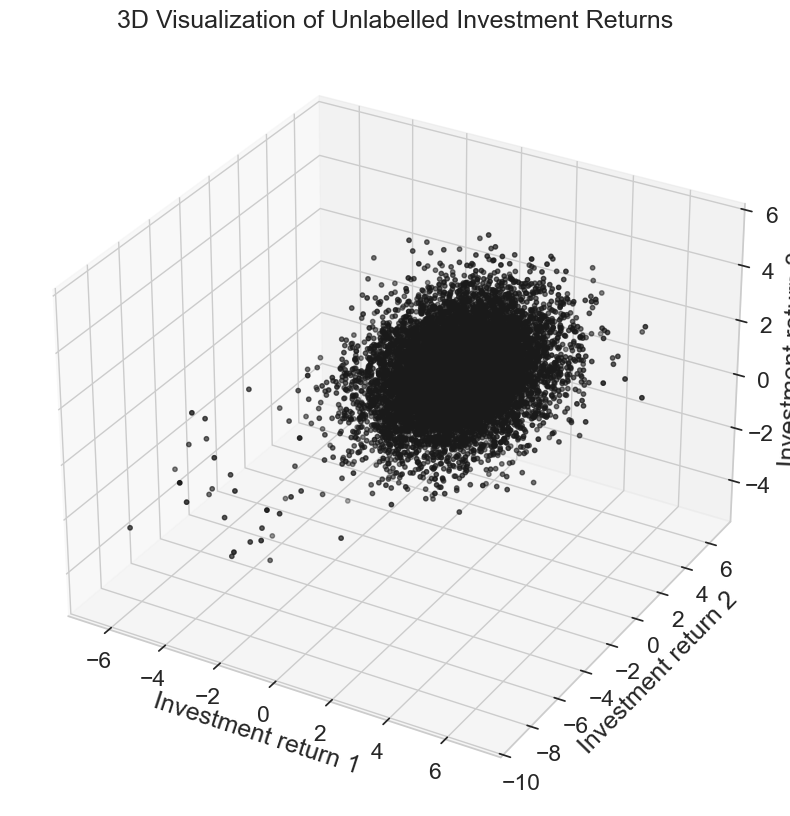

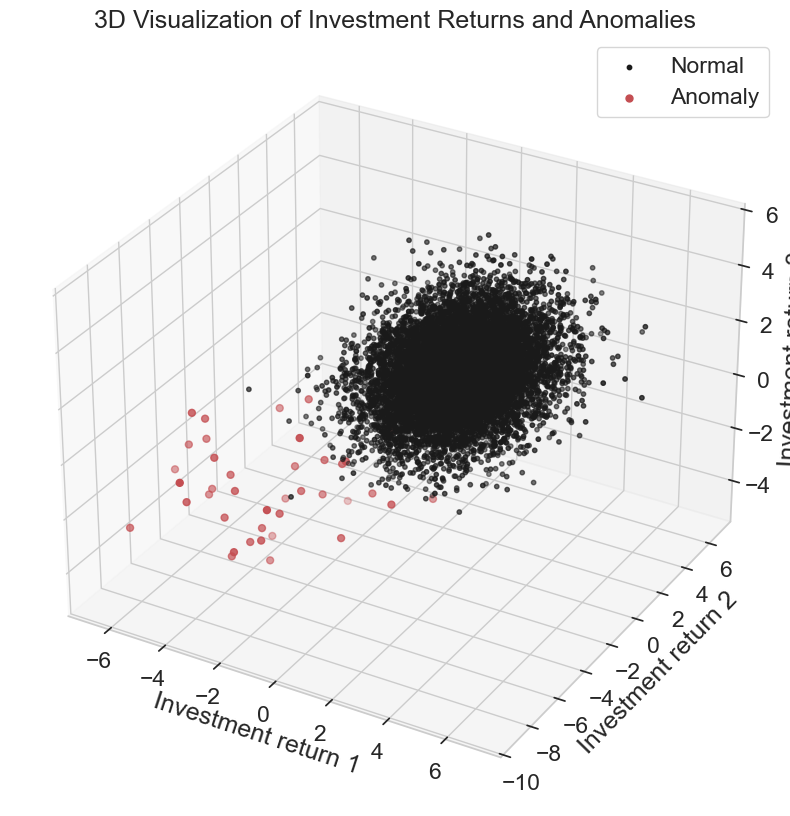

In [3]:
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from sklearn.metrics import precision_score, recall_score, f1_score

# Set random seed for reproducibility
np.random.seed(42)

# First component (ordinary returns - non-anomalous)
mu1 = np.array([1, 1, 1])
sigma1 = np.array([[1.7, 0.5, 0.3], 
                   [0.5, 1.9, 0.4], 
                   [0.3, 0.4, 1.5]])
nobs1 = 10000

# Second component (unusual returns - anomalies)
mu2 = np.array([-3, -5, -2])
sigma2 = np.array([[4.5, 0.95, 0.2], 
                   [0.95, 3.5, 0.3], 
                   [0.2, 0.3, 3.0]])
nobs2 = 40

# Generate random samples
r1 = np.random.multivariate_normal(mu1, sigma1, nobs1)
r2 = np.random.multivariate_normal(mu2, sigma2, nobs2)

# Combine datasets
X = np.vstack((r1, r2))
y = np.hstack((np.zeros(nobs1), np.ones(nobs2)))

# Plotting in 3D - Unlabbelled Scatter Plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
# Plot returns
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c='k', s=10, label='Normal')
# Labels and title
ax.set_xlabel('Investment return 1')
ax.set_ylabel('Investment return 2')
ax.set_zlabel('Investment return 3')
ax.set_title('3D Visualization of Unlabelled Investment Returns')
plt.show()


# Plotting in 3D - Labeled Scatter Plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
# Plot normal returns
ax.scatter(X[y==0, 0], X[y==0, 1], X[y==0, 2], c='k', s=10, label='Normal')
# Plot anomalies
ax.scatter(X[y==1, 0], X[y==1, 1], X[y==1, 2], c='r', s=25, label='Anomaly')
# Labels and title
ax.set_xlabel('Investment return 1')
ax.set_ylabel('Investment return 2')
ax.set_zlabel('Investment return 3')
ax.set_title('3D Visualization of Investment Returns and Anomalies')
ax.legend()
plt.show()

# Create DataFrame for Plotly
import pandas as pd
df = pd.DataFrame(X, columns=['Investment return 1', 'Investment return 2', 'Investment return 3'])
df['Label'] = np.where(y==0, 'Normal', 'Anomaly')
# Plot using plotly.express with reduced dot size
# fig = px.scatter_3d(df, x='Investment return 1', y='Investment return 2', z='Investment return 3',
#                     color='Label',
#                     title='3D Visualization of Investment Returns and Anomalies',
#                     color_discrete_map={'Normal':'black', 'Anomaly':'red'},
#                     size_max=5)
# fig.update_traces(marker=dict(size=2))
# fig.show()


### 👁️‍🗨️ **Modeling Strategy – God Mode = OFF**

So far, in "God Mode ON", we’ve created the world. Now we pretend we didn’t.

We step into the shoes of someone who:

- Observes a dataset coming from an unknown Data Generation Process (DGP).
- Knows which points are abnormal (at least a decent subset), for example because they have been labelled by an expert.
- Wants to detect which points are **abnormal**, i.e., **anomalies**.

A fairly typical situation.

Our strategy:

1. **Model the normal** – Fit a multivariate Gaussian (MVG) density only on the normal observations.
2. **Score everything** – Use the MVG to assign a likelihood score $p(x)$ to each new observation.
3. **Flag anomalies** – If $p(x)$ is lower than some threshold $\varepsilon$, we flag it as an anomaly.

This leads to a simple decision rule:

$$
\text{Anomaly} \quad \Longleftrightarrow \quad p(x) < \varepsilon
$$

This approach is probabilistic, quite interpretable, and (despite its simplicity) surprisingly effective when anomalies are rare and normality is structured.

#### What are we really doing?

- We do **not** assume the entire dataset is Gaussian.  
  (In fact, we know it's a Gaussian mixture — but we ignore that on purpose.)

- We only assume that the **normal part** of the data can be well approximated by a multivariate Gaussian.

- We use the fitted MVG as a proxy for **how normality looks**, and measure how much new observations deviate from it.

> We’re not learning what anomalies *are*.  
> We’re learning what *normal* is — and flagging anything that looks very different.


#### Formal Summary

We fit:

- $\mu = \text{mean of normal data}$
- $\Sigma = \text{covariance of normal data}$

Then for any observation $x$:

$$
p(x) = \frac{1}{(2\pi)^{k/2} |\Sigma|^{1/2}} \exp\left(-\frac{1}{2}(x - \mu)^T \Sigma^{-1} (x - \mu)\right)
$$

We classify $x$ as **anomaly** if:

$$
p(x) < \varepsilon
$$

We choose our **hyperparamer** $\varepsilon$ by maximizing the **F1 score** on the validation set (which includes anomalies). 


<br>

**Short Machine Learning epistemology note**

While the core method (fitting a multivariate Gaussian density) is unsupervised (because density estimation is an unsupervised metod), we apply it in a **supervised framework**:
- We use **labeled data** (anomalies) during cross-validation to choose the threshold $\varepsilon$. This means: supervised.
- We evaluate the model using **supervised metrics** like precision, recall, and F1 score.

So overall, this should be considered a **supervised model**. Or, **semi-supervised**. Again, it's just terminology.

**Remark**: the nature of a model depends not just on how it’s built,  but on how it’s **used** (also, think about Logistic Regression, a regression model typically used as a classifier).

<br>

### **Splitting data: Train / Cross-Validation / Test Set Construction**

We adopt the **fairly classic train/cv/test partition**. But there are some peculiarities though: in anomaly detection, **data is typically split in a way that emphasizes the modeling of normal behavior**.

#### **- Training Set (`X_train`)**

- Contains only **normal data** (i.e., no anomalies).
- Extracted as the first 6,000 observations from the normal sample: `r1[:6000]`.
- Used to estimate the MVG distribution of "normal" behavior.

This is intentional: we want the model to learn the statistical structure of normal data **without contamination** from anomalies.

####  **- Cross-Validation Set (`X_cross_val`)**

- Contains a **mixture** of:
  - 2,000 **normal** points: `r1[6000:8000]`.
  - 20 **anomalies** (50% of total anomalies): `r2[:20]`.
- Used to **tune the hyperparameter, the threshold** $\varepsilon$, which controls the anomaly detection cutoff.

#### **- Test Set (`X_test`)**

- Also a **mixture** of:
  - 2,000 **normal** points: `r1[8000:]`.
  - 20 **anomalies** (remaining 50%): `r2[20:]`.
- Used to evaluate the **final performance** of the trained model on **unseen data** (i.e., out-of-sample, or using the hold-out set).

<br>


This data split structure is common in Anomaly Detection when:
- Anomalies are **rare** (which is often the case, btw, otherwise they are not considered anomalies...).
- The goal is to carefully model "normal" data.
- There are **not enough anomalies** to learn their distribution directly

Note that this setup differs from standard supervised learning, where all classes are typically distributed proportionally across training, validation, and test sets.

Note: we don't reshuffle here in this first exercise only because it's an artifical sample of i.i.d. observations, with a known structure.  Otherwise: **reshuffle, always**.

<br>

In [4]:
# Split the normal data (60/20/20 a common choice, with this dataset size)
X_train = r1[:6000]                                 # 60% of X|y=0
X_cross_val = np.vstack((r1[6000:8000], r2[:20]))   # 20% of X|y=0 and 50% of X|y=1
X_test = np.vstack((r1[8000:], r2[20:]))            # 20% of X|y=0 and 50% of X|y=1

# Create corresponding labels
y_cross_val = np.zeros(len(X_cross_val))
y_cross_val[-20:] = 1
y_test = np.zeros(len(X_test))
y_test[-20:] = 1

# Let's visualize the split
split_summary = pd.DataFrame({
    'Set': ['Train', 'Cross-Validation', 'Test (Hold-Out)'],
    'Normal points': [len(X_train), 2000, 2000],
    'Anomalies': [0, 20, 20],
    'Total': [len(X_train), len(X_cross_val), len(X_test)]
})

display(split_summary)


,Set,Normal points,Anomalies,Total
0,Train,6000,0,6000
1,Cross-Validation,2000,20,2020
2,Test (Hold-Out),2000,20,2020


### **Model fit: estimate MVG parameters**

We estimate the mean vector $\mu$ and covariance matrix $\Sigma$ of the multivariate normal distribution, using only the training set (i.e., normal data).

Standard Maximum Likelihood estimators:

- $\mu = \text{mean}(X_{\text{train}})$  
- $\Sigma = \text{cov}(X_{\text{train}})$

<br>

In [5]:
# Estimate the parameters of the multivariate Gaussian
mu = np.mean(X_train, axis=0)
sigma = np.cov(X_train, rowvar=False)


### **Threshold Selection via Cross-Validation**

We compute the probability density $p(x)$ for each point in the cross-validation set.  
Then we search for the threshold $\varepsilon$ that maximizes the F1 score.

For each candidate $\varepsilon$:
- Points with $p(x) < \varepsilon$ are classified as anomalies
- We compare predictions to ground truth labels
- We compute precision, recall, and F1 score.

We retain the $\varepsilon$ that yields the best F1.

**The choice of F1**

The **choice of evaluation metric depends on the application**, on the business case. In short:
- If false negatives are critical, **recall** might be prioritized
- If false positives are costly, **precision** could be preferred
- F1 is a **balanced compromise**: the harmonic mean of precision and recall

In this example, we use F1 because we aim for a good trade-off without favoring one type of error, and also abecause it's just an example.

<br>


In [6]:
# Compute the probability density function for the cross-validation set
mv_normal = multivariate_normal(mean=mu, cov=sigma)
p = mv_normal.pdf(X_cross_val)

# Find the range of epsilon values to search
min_epsilon = np.min(p)
max_epsilon = np.max(p)
step_size = (max_epsilon - min_epsilon) / 1000

# Find the best epsilon using F1 score
best_epsilon = 0
best_f1 = 0

epsilon_values = np.arange(min_epsilon, max_epsilon, step_size)
for epsilon in epsilon_values:
    predictions = (p < epsilon).astype(int)

    # Calculate precision and recall
    tp = np.sum((predictions == 1) & (y_cross_val == 1))
    fp = np.sum((predictions == 1) & (y_cross_val == 0))
    fn = np.sum((predictions == 0) & (y_cross_val == 1))

    # Avoid division by zero
    if tp + fp == 0 or tp + fn == 0:
        continue

    precision = tp / (tp + fp)
    recall = tp / (tp + fn)

    # Calculate F1 score
    if precision + recall > 0:  # Avoid division by zero
        f1 = 2 * precision * recall / (precision + recall)

        if f1 > best_f1:
            best_f1 = f1
            best_epsilon = epsilon

print(f"Best F1 Score: {best_f1:.4f}")
print(f"Best Epsilon: {best_epsilon:.8f}")



Best F1 Score: 0.7317
Best Epsilon: 0.00003080


### **Final evaluation on test set**

We apply the best threshold $\varepsilon$ to the test set (out-of-sample approach), which contains both normal points and previously unseen anomalies.

We compute some usual metrics of the model’s performance:
- **Precision**.
- **Recall**.
- **F1 Score**.

### Visual Inspection

The scatter plot highlights:

- **Normal points** in black.
- **True anomalies** in red.
- **False positives** (normal misclassified as anomaly) in yellow.
- **False negatives** (anomalies missed by the model) in magenta.

This helps understand both the **quantitative** and **qualitative** behavior of the model.


Test Precision: 0.7083
Test Recall: 0.8500
Test F1 Score: 0.7727


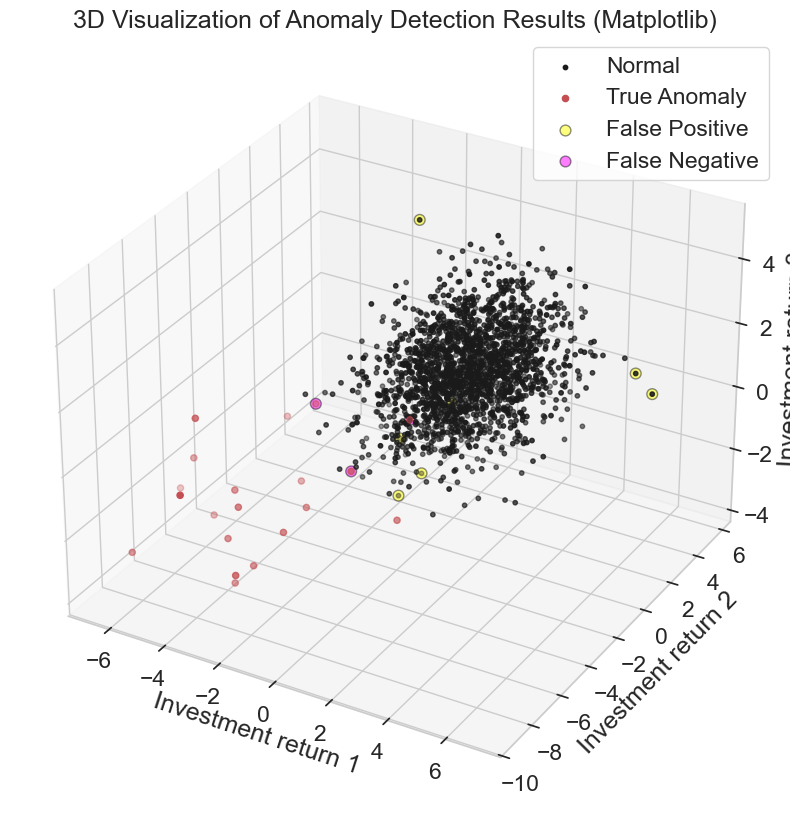

In [7]:
# Probability densities for the test set
p_test = mv_normal.pdf(X_test)

# Predictions based on the threshold
predictions = (p_test < best_epsilon).astype(int)

# Calculate metrics
precision = precision_score(y_test, predictions)
recall = recall_score(y_test, predictions)
f1 = f1_score(y_test, predictions)

print(f"Test Precision: {precision:.4f}")
print(f"Test Recall: {recall:.4f}")
print(f"Test F1 Score: {f1:.4f}")


# Matplotlib 3D visualization
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_test[y_test==0, 0], X_test[y_test==0, 1], X_test[y_test==0, 2], c='k', s=10, label='Normal')
ax.scatter(X_test[y_test==1, 0], X_test[y_test==1, 1], X_test[y_test==1, 2], c='r', s=20, label='True Anomaly')
ax.scatter(X_test[(predictions==1) & (y_test==0), 0],
           X_test[(predictions==1) & (y_test==0), 1],
           X_test[(predictions==1) & (y_test==0), 2],
           c='yellow', s=60, alpha=0.5, marker='o', edgecolors='k', label='False Positive')
ax.scatter(X_test[(predictions==0) & (y_test==1), 0],
           X_test[(predictions==0) & (y_test==1), 1],
           X_test[(predictions==0) & (y_test==1), 2],
           c='magenta', s=60, alpha=0.5, marker='o', edgecolors='k', label='False Negative')
ax.set_xlabel('Investment return 1')
ax.set_ylabel('Investment return 2')
ax.set_zlabel('Investment return 3')
ax.set_title('3D Visualization of Anomaly Detection Results (Matplotlib)')
ax.legend()
plt.show()

# DataFrame for plotly
df_test = pd.DataFrame(X_test, columns=['Investment return 1', 'Investment return 2', 'Investment return 3'])
df_test['Result'] = np.where((predictions==1) & (y_test==0), 'False Positive',
                     np.where((predictions==0) & (y_test==1), 'False Negative',
                              np.where(y_test==1, 'True Anomaly', 'Normal')))
# Plotly 3D visualization with specified colors
# color_map = {'Normal': 'black', 'True Anomaly': 'red', 'False Positive': 'yellow', 'False Negative': 'magenta'}
# fig = px.scatter_3d(df_test, x='Investment return 1', y='Investment return 2', z='Investment return 3',
#                     color='Result',
#                     title='3D Visualization of Anomaly Detection Results (Plotly)',
#                     color_discrete_map=color_map)
# fig.update_traces(marker=dict(size=2))
# fig.show()


# 2. Real World Dataset Exploration

We now switch to a **real-world dataset** from Bloomberg, consisting of weekly observations of:

- Market and macroeconomic indicators (e.g., indices, rates).
- A response variable `Y` indicating **anomalous periods** (e.g., market stress events).

### Visual Preview: MSCI USA and Anomaly Periods

We inspect our features and plot a key equity index, the MSCI USA index (`MXUS`), over time, highlighting the periods where `Y = 1` as **risk-on/risk-off windows**.

This allows a quick visual check of:

- The distribution of anomalous events in time.
- Their potential correspondence with market drops or volatility clusters.

<br>


Data columns: ['Data', 'BDIY', 'CRY', 'Cl1', 'DXY', 'ECSURPUS', 'EMUSTRUU', 'EONIA', 'GBP', 'GT10', 'GTDEM10Y', 'GTDEM2Y', 'GTDEM30Y', 'GTGBP20Y', 'GTGBP2Y', 'GTGBP30Y', 'GTITL10YR', 'GTITL2YR', 'GTITL30YR', 'GTJPY10YR', 'GTJPY2YR', 'GTJPY30YR', 'JPY', 'LF94TRUU', 'LF98TRUU', 'LG30TRUU', 'LMBITR', 'LP01TREU', 'LUACTRUU', 'LUMSTRUU', 'MXBR', 'MXCN', 'MXEU', 'MXIN', 'MXJP', 'MXRU', 'MXUS', 'US0001M', 'USGG2YR', 'USGG30YR', 'USGG3M', 'VIX', 'XAUBGNL', 'Y']
Data shape: (1111, 42)
Total number of records: 1111
Time period: from 01/11/2000 to 04/20/2021
Frequency: W-TUE
Number of variables: 42
Number of anomalies: 237 (21.33%)

Metadata and statistics:


,Ticker,Description,Mean,Std.Dev,Min,Max,Missing values,Missing (%)
0,BDIY,Baltic Dry Index,2259.860486,2017.811888,291.00000,11793.00000,0,0.00%
1,CRY,TR/CC CRB ER Index,245.247649,68.278081,106.29290,467.57000,0,0.00%
2,Cl1,Generic 1st 'CL' Future,60.708101,25.900813,10.01000,140.97000,0,0.00%
3,DXY,DOLLAR INDEX SPOT,90.934982,11.379095,71.32900,119.82000,0,0.00%
4,ECSURPUS,Bloomberg ECO US Surprise Inde,0.036153,0.349453,-0.97400,0.99100,0,0.00%
5,EMUSTRUU,EM USD Aggregate,704.379495,309.951768,230.52670,1286.35300,0,0.00%
6,EONIA,EMMI EURO OverNight Index Aver,1.363676,1.721894,-0.49800,5.73000,0,0.00%
7,GBP,British Pound Spot,1.569618,0.212340,1.17230,2.08520,0,0.00%
8,GT10,US TREASURY N/B,3.266748,1.332464,0.50800,6.74800,0,0.00%
9,GTDEM10Y,BUNDESREPUB. DEUTSCHLAND,2.448365,1.851558,-0.79400,5.64400,0,0.00%


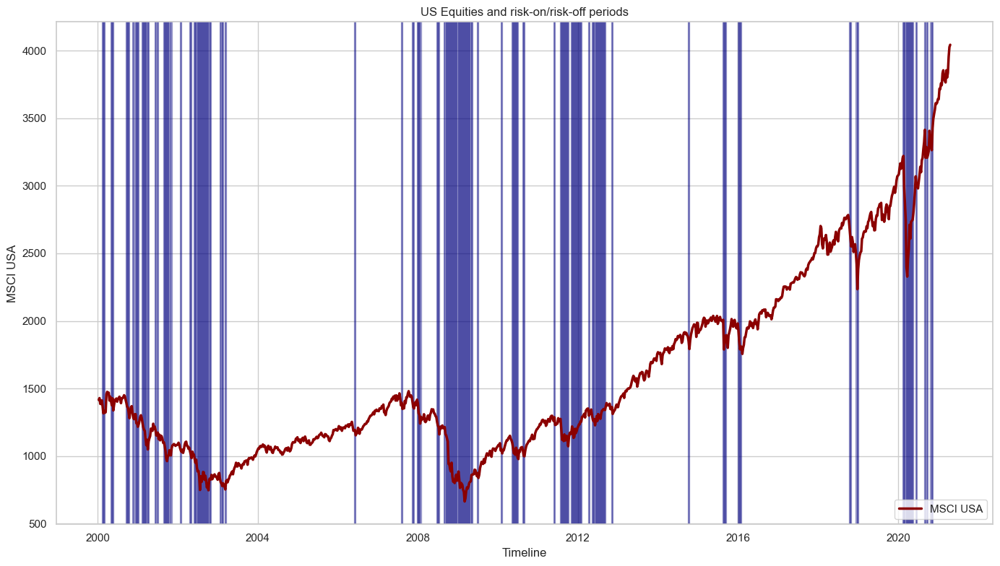

In [8]:
# Define the file path for the dataset
file_path = 'Dataset4_EWS.xlsx'

# Set visualization style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [10, 6]

# Load the data from the Excel file
# First sheet contains market data with dates and anomaly labels, second sheet contains metadata
data_df = pd.read_excel(file_path, sheet_name='Markets')
metadata_df = pd.read_excel(file_path, sheet_name='Metadata')

# Check the structure of the loaded data
print("Data columns:", data_df.columns.tolist())

# Extract date and anomaly label columns
date_col = 'Date' if 'Date' in data_df.columns else data_df.columns[0]
y_col = 'Y' if 'Y' in data_df.columns else None

# Convert dates to datetime format
data_df[date_col] = pd.to_datetime(data_df[date_col], dayfirst=True)  # Date format is dd/mm/yy

# Set date as index
data_df = data_df.set_index(date_col)

# Extract features (all columns except Y if it exists)
if y_col:
    X_df = data_df.drop(y_col, axis=1)
    y = data_df[y_col].values
else:
    X_df = data_df
    y = None

# Display basic information about the dataset
print(f"Data shape: {X_df.shape}")
print(f"Total number of records: {len(X_df)}")
print(f"Time period: from {X_df.index.min().strftime('%m/%d/%Y')} to {X_df.index.max().strftime('%m/%d/%Y')}")
print(f"Frequency: {pd.infer_freq(X_df.index) or 'Weekly'}")
print(f"Number of variables: {X_df.shape[1]}")
if y_col:
    print(f"Number of anomalies: {np.sum(y == 1)} ({np.mean(y == 1)*100:.2f}%)")

# Create a more comprehensive metadata table with additional statistics
enhanced_metadata = []

# Determine the correct column names for ticker and description
ticker_col = 'ticker' if 'ticker' in metadata_df.columns else metadata_df.columns[0]
desc_col = 'description' if 'description' in metadata_df.columns else metadata_df.columns[1] if len(metadata_df.columns) > 1 else ticker_col

for ticker in X_df.columns:
    # Get metadata for this ticker if available
    meta_row = metadata_df[metadata_df[ticker_col] == ticker] if ticker in metadata_df[ticker_col].values else pd.DataFrame()

    # Get description or use ticker if not found
    description = meta_row[desc_col].values[0] if not meta_row.empty and desc_col in meta_row.columns else ticker

    # Calculate statistics for this series
    series = X_df[ticker]

    enhanced_metadata.append({
        'Ticker': ticker,
        'Description': description,
        'Mean': series.mean(),
        'Std.Dev': series.std(),
        'Min': series.min(),
        'Max': series.max(),
        'Missing values': series.isna().sum(),
        'Missing (%)': f"{series.isna().mean()*100:.2f}%"
    })

# Create enhanced metadata dataframe
enhanced_meta_df = pd.DataFrame(enhanced_metadata)

# Display the enhanced metadata
print("\nMetadata and statistics:")
display(enhanced_meta_df)

# Create a plot with anomalies as vertical bars and MXUS as a line
if y_col and 'MXUS' in X_df.columns:
    fig, ax = plt.subplots(figsize=(14, 8))

    # Plot MXUS line
    ax.plot(X_df.index, X_df['MXUS'], color='darkred', linewidth=2.5, label='MSCI USA')

    # Get the y-axis limits after plotting MXUS
    y_min, y_max = ax.get_ylim()

    # For each anomaly point (Y=1), create a vertical span across the entire plot
    for i, (date, is_anomaly) in enumerate(zip(X_df.index, y)):
        if is_anomaly == 1:
            ax.axvspan(date, date + pd.Timedelta(days=7), alpha=0.3, color='navy', label='Risk-on/Risk-off' if i == 0 else "")

    # Set labels and title
    ax.set_xlabel('Timeline')
    ax.set_ylabel('MSCI USA')
    ax.set_title('US Equities and risk-on/risk-off periods')

    # Add legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='best')

    plt.tight_layout()
    plt.show()
else:
    print("Either 'Y' column or 'MXUS' column is missing in the dataset.")


# 3. Exploratory Data Analysis (EDA): Stationarity analysis and feature preparation

### Stationarity matters

Many/most models - especially those based on statistical distributions - assume that the data is **stationary**, i.e., its statistical properties (mean, variance) do not change over time.

This is particularly important for Anomaly Detection models like the one we use, which rely on estimating a **stable distribution**.

#### Why is stationarity important?

- Without stationarity, **mean and variance shift** over time.
- This makes density estimates unreliable.
- What looks like an anomaly could simply be a change in regime or trend.

> A stable model requires stable inputs.


### How do we check for stationarity?

We explore:

- Visual inspection of the series.
- Basic transformations (e.g., log-returns).
- We perform formal statistical tests, e.g., [Augmented Dickey-Fuller](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html).

The goal is to identify variables that exhibit **mean-reverting behavior** or that can be transformed into stationary form.

<br>

<!-- Let's start analyzing a bond yield (for example, 10-year Italian BTP) to understand:
* stationarity through time graphs of levels and first differences.
* shape of the distribution with histograms and QQ-plot. -->


Let's proceed with a visual analysis of selected financial time series from the dataset. The following three assets are analyzed:

* **GTITL10YR** – Italy Government Bond 10-Year Yield: A sovereign bond yield, which is often used as a benchmark for Italy's long-term borrowing costs.

* **MXEU** – MSCI Europe Index: A broad equity index representing large and mid-cap equity performance across 15 developed European markets.

* **LG30TRUU** – Bloomberg Global Aggregate 30+ Year Total Return Index (USD): A fixed-income index tracking the total return of global bonds with 30+ year maturities.

The code generates the following visual diagnostics for each asset:

- Time Plot of Levels: Shows how the raw index or yield values evolve over time.

- First Differences (for Bond Yields) or Log Returns (for Equities) Time Plot: Visualizes the returns over time, useful for volatility and trend analysis.

- Histogram of First Differences/Log Returns: Displays the frequency distribution of first differences/log returns to assess normality and tail behavior.

- QQ Plot: Compares the distribution of first differences/log returns against a Gaussian distribution to check for deviations such as skewness or fat tails.

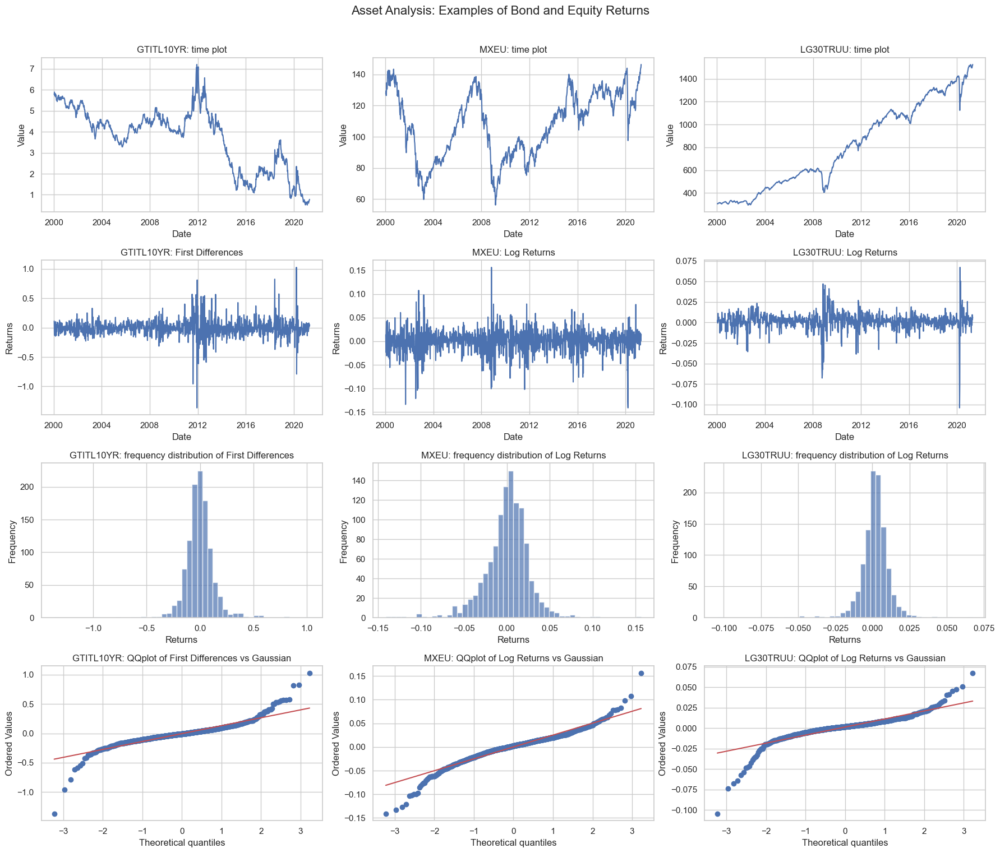

In [9]:
from scipy import stats
import statsmodels.api as sm

# Define asset categories
bonds = ['GTITL10YR']
equities = ['MXEU', 'LG30TRUU']
asset_columns = bonds + equities

# Compute returns based on type
returns_dict = {}
for col in asset_columns:
    if col in bonds:
        returns_dict[col] = np.diff(X_df[col])
    elif col in equities:
        returns_dict[col] = np.diff(np.log(X_df[col]))

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 16))
fig.suptitle('Asset Analysis: Examples of Bond and Equity Returns', fontsize=16)
plt.subplots_adjust(hspace=0.4)

for i, col in enumerate(asset_columns):
    # Row 0: Time plot of levels
    axes[0, i].plot(X_df.index, X_df[col])
    axes[0, i].set_title(f'{col}: time plot')
    axes[0, i].set_xlabel('Date')
    axes[0, i].set_ylabel('Value')

    # Row 1: Time plot of returns
    axes[1, i].plot(X_df.index[1:], returns_dict[col])
    axes[1, i].set_title(f'{col}: {"First Differences" if col in bonds else "Log Returns"}')
    axes[1, i].set_xlabel('Date')
    axes[1, i].set_ylabel('Returns')

    # Row 2: Histogram of returns
    axes[2, i].hist(returns_dict[col], bins=50, alpha=0.7)
    axes[2, i].set_title(f'{col}: {"frequency distribution of First Differences" if col in bonds else "frequency distribution of Log Returns"}')
    axes[2, i].set_xlabel('Returns')
    axes[2, i].set_ylabel('Frequency')

    # Row 3: QQ plot
    stats.probplot(returns_dict[col], dist="norm", plot=axes[3, i])
    axes[3, i].set_title(f'{col}: {"QQplot of First Differences vs Gaussian" if col in bonds else "QQplot of Log Returns vs Gaussian"}')

# Hide unused subplots if < 3 columns
if len(asset_columns) < 3:
    for row in range(4):
        for j in range(len(asset_columns), 3):
            axes[row, j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Leave space for suptitle
plt.show()


Now let's investigate an economic surprise index: [the Bloomberg Economic US Surprise Index](https://www.babypips.com/forexpedia/bloomberg-us-economic-surprise-index#:~:text=The%20Bloomberg%20U.S.%20Economic%20Surprise,downside%20relative%20to%20market%20expectations).


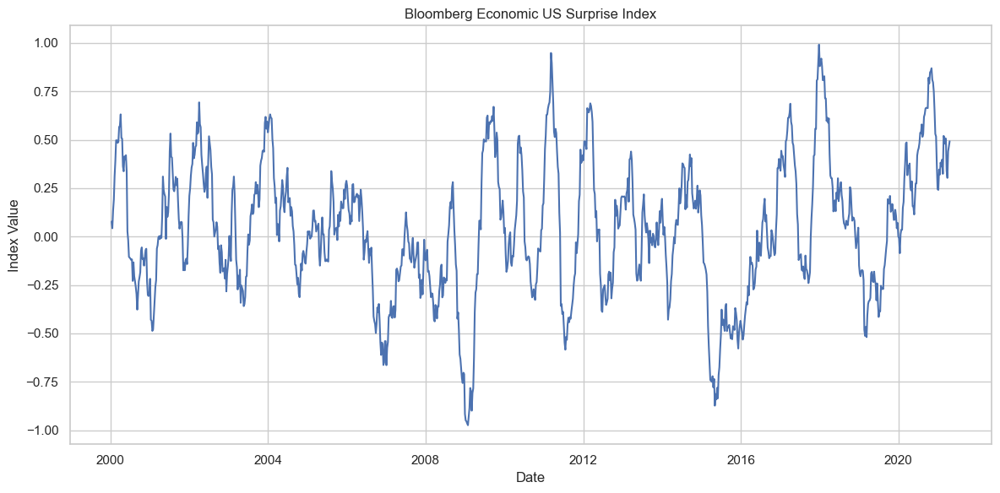

In [10]:
# Analyze the Bloomberg Economic US Surprise Index
if 'ECSURPUS' in X_df.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(X_df.index, X_df['ECSURPUS'])
    plt.title('Bloomberg Economic US Surprise Index')
    plt.xlabel('Date')
    plt.ylabel('Index Value')
    plt.tight_layout()
    plt.show()


Let's check if we have negative interest rates. If a variable can take negative values, you cannot use log-differences, only first-differences.

It is recommend to always use first differences, for interest rates and bond yields (not for bond indices).

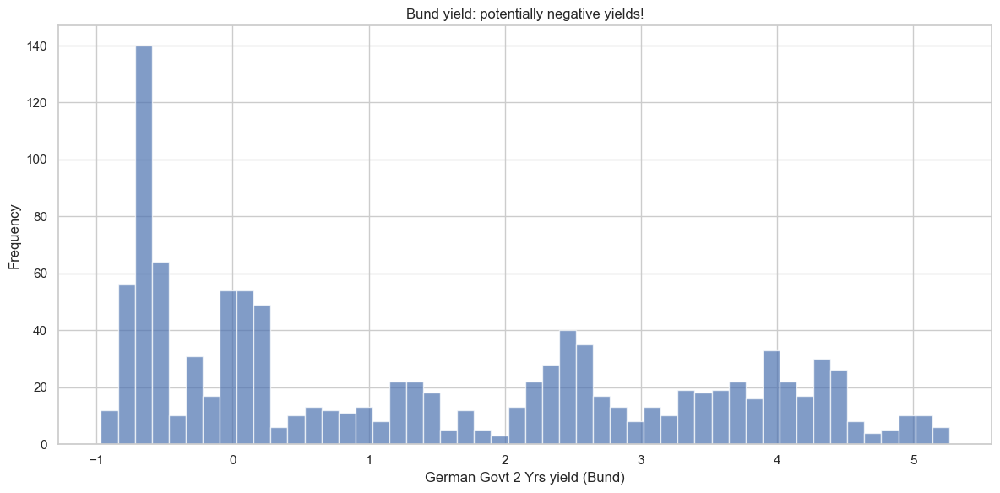

In [11]:
# Check for negative values in interest rates
if 'GTDEM2Y' in X_df.columns:
    plt.figure(figsize=(12, 6))
    plt.hist(X_df['GTDEM2Y'], bins=50, alpha=0.7)
    plt.title('Bund yield: potentially negative yields!')
    plt.xlabel('German Govt 2 Yrs yield (Bund)')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


## Stationarity Analysis with Augmented Dickey-Fuller (ADF) Test

We apply the **Augmented Dickey-Fuller (ADF) test** to each feature in the dataset. The ADF test checks the null hypothesis that a unit root is present in the series (i.e., it is non-stationary). A **p-value below 0.05** typically indicates that the series is **stationary**.

We loop through each column of the dataset, perform the ADF test, and display key statistics in a summarized DataFrame for interpretation.


In [12]:
from statsmodels.tsa.stattools import adfuller

# Function to perform ADF test on a single series
def adf_test(series):
    result = adfuller(series.dropna())
    return {
        'ADF Statistic': result[0],
        'p-value': result[1],
        'Used Lag': result[2],
        'Observations Used': result[3],
        'Critical Value (1%)': result[4]['1%'],
        'Critical Value (5%)': result[4]['5%'],
        'Critical Value (10%)': result[4]['10%']
    }

# Apply the ADF test to each column
adf_results = {col: adf_test(X_df[col]) for col in X_df.columns}

# Convert results to DataFrame
adf_results_df = pd.DataFrame(adf_results).T

# Add stationarity flag
adf_results_df['Stationary (<0.05 p-value)'] = adf_results_df['p-value'] < 0.05

# Sort by p-value for easier inspection
adf_results_df = adf_results_df.sort_values(by='p-value')

# Display as styled table if in Jupyter/Notebook
from IPython.display import display
display(adf_results_df.style.background_gradient(cmap='RdYlGn_r', subset=['p-value'])
                              .format({'ADF Statistic': '{:.3f}', 'p-value': '{:.4f}'})
                              .set_caption("ADF Stationarity Test Results"))


,ADF Statistic,p-value,Used Lag,Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),Stationary (<0.05 p-value)
ECSURPUS,-6.492,0.0000,7.000000,1103.000000,-3.436293,-2.864164,-2.568167,True
VIX,-3.971,0.0016,11.000000,1099.000000,-3.436314,-2.864173,-2.568172,True
US0001M,-2.945,0.0404,22.000000,1088.000000,-3.436375,-2.864200,-2.568186,True
Cl1,-2.677,0.0781,8.000000,1102.000000,-3.436298,-2.864166,-2.568168,False
USGG3M,-2.660,0.0813,22.000000,1088.000000,-3.436375,-2.864200,-2.568186,False
USGG2YR,-2.523,0.1099,6.000000,1104.000000,-3.436287,-2.864162,-2.568166,False
BDIY,-2.361,0.1530,21.000000,1089.000000,-3.436369,-2.864198,-2.568185,False
CRY,-2.349,0.1566,12.000000,1098.000000,-3.436320,-2.864176,-2.568173,False
GT10,-2.311,0.1684,0.000000,1110.000000,-3.436255,-2.864147,-2.568158,False
MXRU,-2.273,0.1808,3.000000,1107.000000,-3.436271,-2.864154,-2.568162,False


## Coping with stationarity

#### Based on the results, the following features are stationary:

| Variable   | ADF p-value |
|------------|-------------|
| ECSURPUS   | 0.0000      |
| VIX        | 0.0000      |
| US0001M    | 0.0424      |
| Cl1        | 0.0478      |

All other features have p-values above the 0.05 threshold and are therefore considered **non-stationary** under this criterion.

### Stationarity Transformation

Unless we are using **cointegration** techniques, we need the data to be **stationary**.

This means that the **joint distribution** of the features must be stable over time.

The rationale is intuitive:

- We want to use historical data to infer patterns related to systemic risk.
- If the underlying structure shifts over time, any model based on past behavior becomes unreliable.

> A non-stationary model is not just inaccurate — it’s structurally **wrong**.

#### How we transform the data

- **Indices and currencies**: log-differenced (they are strictly positive).
- **Interest rates and yields**: first differences (they can be negative or close to zero).
- **Economic surprise index**: left as is (already roughly stationary). Note: Do not take this as a rule for macroeconomic variables; many are non-stationary, sometimes they need to be differentiated TWICE (sic).


Only the **features** are transformed — not the labels, i.e., our vector Y.

<!-- > For **more background** (that many ML tutorials skip entirely):  
> - [Forecasting: Principles and Practice – Stationarity](https://otexts.com/fpp3/stationarity.html)  
> - [Cointegration and ECMs – Sørensen](https://www.uh.edu/~bsorense/coint.pdf) -->


In [13]:
# Make data stationary based on variable type
# So w define lists of variables by type
indices_currencies = [col for col in X_df.columns if col in [
    'XAUBGNL', 'BDIY', 'CRY', 'Cl1', 'DXY', 'EMUSTRUU', 'GBP', 'JPY', 'LF94TRUU',
    'LF98TRUU', 'LG30TRUU', 'LMBITR', 'LP01TREU', 'LUACTRUU', 'LUMSTRUU',
    'MXBR', 'MXCN', 'MXEU', 'MXIN', 'MXJP', 'MXRU', 'MXUS', 'VIX'
]]

interest_rates = [col for col in X_df.columns if col in [
    'EONIA', 'GTDEM10Y', 'GTDEM2Y', 'GTDEM30Y', 'GTGBP20Y', 'GTGBP2Y', 'GTGBP30Y',
    'GTITL10YR', 'GTITL2YR', 'GTITL30YR', 'GTJPY10YR', 'GTJPY2YR', 'GTJPY30YR',
    'US0001M', 'USGG3M', 'USGG2YR', 'GT10', 'USGG30YR'
]]

# Create a new dataframe for stationary data
stationary_df = pd.DataFrame(index=X_df.index[1:])

# Apply log-differences to indices and currencies (always positive)
for col in indices_currencies:
    if col in X_df.columns:
        stationary_df[col] = np.diff(np.log(X_df[col]))

# Apply first differences to interest rates (can be negative or very close to 0)
for col in interest_rates:
    if col in X_df.columns:
        stationary_df[col] = np.diff(X_df[col])

# Keep Bloomberg Economic US Surprise Index as is (already stationary)
if 'ECSURPUS' in X_df.columns:
    stationary_df['ECSURPUS'] = X_df['ECSURPUS'].values[1:]

# Adjust the response variable to match the new data length
if y is not None:
    y_stationary = y[1:]
else:
    y_stationary = None


We repeat the ADF test on the transformed dataset.

In [14]:
# Apply the ADF test to each column of the stationary dataframe
adf_results_transformed = {col: adf_test(stationary_df[col]) for col in stationary_df.columns}

# Convert results to DataFrame
adf_results_transformed = pd.DataFrame(adf_results_transformed).T

# Add stationarity flag
adf_results_transformed['Stationary (<0.05 p-value)'] = adf_results_transformed['p-value'] < 0.05

# Sort by p-value for easier inspection
adf_results_transformed = adf_results_transformed.sort_values(by='p-value')

# Display as styled table
from IPython.display import display
display(adf_results_transformed.style.background_gradient(cmap='RdYlGn_r', subset=['p-value'])
                              .format({'ADF Statistic': '{:.3f}', 'p-value': '{:.4f}'})
                              .set_caption("ADF Stationarity Test Results"))



,ADF Statistic,p-value,Used Lag,Observations Used,Critical Value (1%),Critical Value (5%),Critical Value (10%),Stationary (<0.05 p-value)
MXUS,-35.341,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True
GTGBP20Y,-37.638,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True
GTDEM30Y,-26.778,0.0000,1.000000,1108.000000,-3.436266,-2.864152,-2.568161,True
GTDEM10Y,-25.266,0.0000,1.000000,1108.000000,-3.436266,-2.864152,-2.568161,True
GT10,-33.795,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True
GTITL30YR,-23.203,0.0000,1.000000,1108.000000,-3.436266,-2.864152,-2.568161,True
XAUBGNL,-34.390,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True
MXJP,-25.673,0.0000,1.000000,1108.000000,-3.436266,-2.864152,-2.568161,True
GTJPY2YR,-35.574,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True
MXEU,-34.952,0.0000,0.000000,1109.000000,-3.436260,-2.864150,-2.568159,True


## Multivariate perspective

Let's plot a matrix of scatter plots comparing our Xs by using the our Y as grouping variable (we plot just a selection of features, and they are already too many).

There can be spotted visual differences in the behavior of variables during normal and abnormal periods.


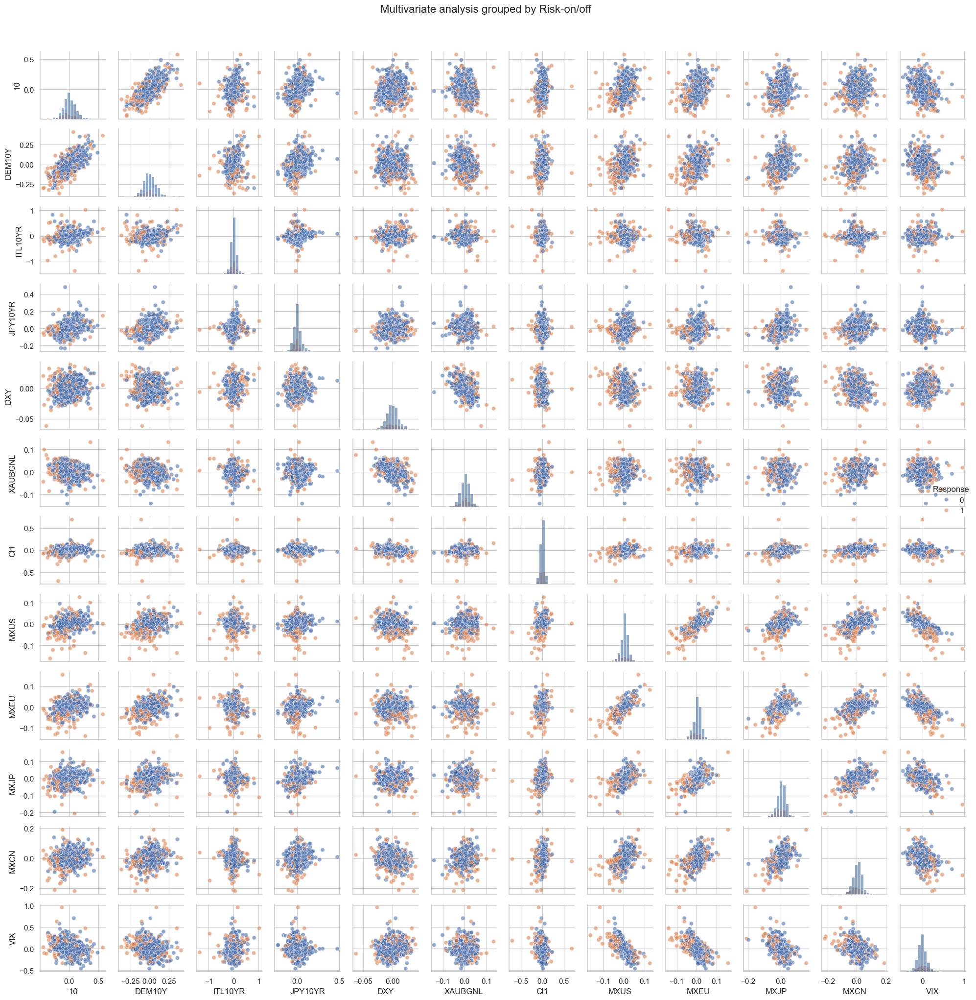

In [15]:
# Create a matrix of scatter plots with Y as grouping variable
# Select a subset of variables for visualization (otherwise the chart is too big)
plot_vars = []
plot_names = []

# Add interest rates (first differences)
for col in ['GT10', 'GTDEM10Y', 'GTITL10YR', 'GTJPY10YR']:
    if col in stationary_df.columns:
        plot_vars.append(stationary_df[col])
        plot_names.append(col.replace('GT', ''))

# Add indices and currencies (log differences)
for col in ['DXY', 'XAUBGNL', 'Cl1', 'MXUS', 'MXEU', 'MXJP', 'MXCN', 'VIX']:
    if col in stationary_df.columns:
        plot_vars.append(stationary_df[col])
        plot_names.append(col)

# Convert to numpy array for plotting
plot_data = np.column_stack(plot_vars)

# Create a custom pairplot with grouping by Y
if y_stationary is not None and len(plot_vars) > 0:
    # Create a DataFrame with the selected variables and the response
    plot_df = pd.DataFrame(plot_data, columns=plot_names)
    plot_df['Response'] = y_stationary

    # Create a pairplot with different colors for Y=0 and Y=1
    g = sns.pairplot(plot_df, hue='Response', diag_kind='hist',
                     plot_kws={'alpha': 0.6}, diag_kws={'alpha': 0.6, 'bins': 20})

    # Customize the plot
    g.fig.suptitle('Multivariate analysis grouped by Risk-on/off', y=1.02, fontsize=16)
    g.fig.set_size_inches(20, 20)
    plt.tight_layout()
    plt.show()


## Data Preparation: Shuffling, Splitting, and Scaling

In this section, we prepare the dataset for anomaly detection by carefully splitting it into training, cross-validation, and test sets, while preserving the problem's unsupervised or semi-supervised nature.

### Key Steps:

1. **Shuffling the Data**  
   The dataset is randomly shuffled using `sklearn.utils.shuffle` to break any temporal or autocorrelated patterns in the data. This is important because many anomaly detection methods assume **i.i.d. (independent and identically distributed)** samples. Preserving autocorrelation in the splits might lead to biased evaluation.

2. **Separating Normal vs Anomalous Data**  
   We isolate normal and anomalous samples to control how they are distributed across different sets. This is especially relevant when training **unsupervised models**, which are trained only on normal data.

3. **Constructing the Sets**
   - **Training Set**: Contains only normal data (80% of all normal samples). This enables unsupervised models to learn a baseline of “normal” behavior.
   - **Cross-Validation Set**: A mix of 10% normal data and 50% of the anomalies, used for tuning hyperparameters (e.g. decision threshold).
   - **Test Set**: The remaining 10% of normal data and the other 50% of anomalies, used to evaluate generalization performance.

4. **Standardization**  
   All features are scaled using `StandardScaler`. This centers the data (mean = 0, std = 1), which:
   - Improves convergence for gradient-based models.
   - Prevents features with large magnitudes from dominating the distance-based anomaly scores.


In [16]:
# Shuffle and split data into training, validation, and test sets
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler

# Set visualization style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]

# Convert to numpy arrays for easier manipulation
X = stationary_df.values
y = y_stationary


# Creating training/cross-validation/test set with reshuffling

# Reshuffle the data (this will break down autocorrelation)
X_shuffled, y_shuffled = shuffle(X, y, random_state=42)

# Separate normal and anomalous examples
X_normal = X_shuffled[y_shuffled == 0]
X_anomaly = X_shuffled[y_shuffled == 1]

# Calculate sizes for each set
n_normal = X_normal.shape[0]
n_anomaly = X_anomaly.shape[0]

# Training set: 80% of normal examples
train_size = int(0.8 * n_normal)
X_train = X_normal[:train_size]

# Cross-validation set: 10% of normal examples and 50% of anomalies
cv_normal_size = int(0.1 * n_normal)
cv_anomaly_size = int(0.5 * n_anomaly)
X_cv_normal = X_normal[train_size:train_size + cv_normal_size]
X_cv_anomaly = X_anomaly[:cv_anomaly_size]
X_cross_val = np.vstack((X_cv_normal, X_cv_anomaly))
y_cross_val = np.hstack((np.zeros(cv_normal_size), np.ones(cv_anomaly_size)))

# Test set: 10% of normal examples and 50% of anomalies
X_test_normal = X_normal[train_size + cv_normal_size:]
X_test_anomaly = X_anomaly[cv_anomaly_size:]
X_test = np.vstack((X_test_normal, X_test_anomaly))
y_test = np.hstack((np.zeros(len(X_test_normal)), np.ones(len(X_test_anomaly))))

# We'll standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_cross_val = scaler.transform(X_cross_val)
X_test = scaler.transform(X_test)

print(f"Training set size: {X_train.shape[0]} (all normal)")
print(f"Cross-validation set size: {X_cross_val.shape[0]} ({cv_normal_size} normal, {cv_anomaly_size} anomalies)")
print(f"Test set size: {X_test.shape[0]} ({len(X_test_normal)} normal, {len(X_test_anomaly)} anomalies)")


Training set size: 698 (all normal)
Cross-validation set size: 205 (87 normal, 118 anomalies)
Test set size: 207 (88 normal, 119 anomalies)


# 4. Metrics Definition



## Functions and Utilities for Comparison of Supervised and Unsupervised Anomaly Detection Methods

In this section, we define the core utility functions for evaluating and visualizing anomaly detection models. These utilities are model-agnostic and can be reused across supervised and unsupervised methods.

We will compare several anomaly detection methods - from simpler models to deep learning.

All models are tested on the **same financial dataset**, and evaluated using consistent metrics: **Precision, Recall, F1 Score, Confusion Matrix, ROC Curve**, and **PCA, UMAP and t-SNE projections**.

The categories of models are:

- **MVG Baseline**: our probabilistic model trained on normal data only - it's our baseline model, the benchmark.
- **Supervised models**: Random Forest, SVM.
- **Unsupervised models**: Copula-based Outlier Detection (COPOD), Isolation Forest, Local Outlier Factor, One-Class SVM, Gaussian Mixture.
- **Deep learning**: Autoencoder, Generative Adversarial Networks (GAN), Long Short-Term Memory Networks (LSTM).
- **Ensemble models**: which makes a average of the results of different models.

The goal is not just to compare performance, but to reflect on **methodological trade-offs** between complexity and interpretability, data requirements, and flexibility. We want to understand pros and cons.



##  Function to compute the metrics

This function evaluates the model predictions using common classification metrics:

- **Precision**, **Recall**, and **F1 Score**  
- **Confusion Matrix** (with a heatmap visualization)
- **ROC Curve and AUC** (if the model provides decision scores)

It prints the performance and visualizes both the confusion matrix and ROC curve (if applicable).

### 🧮 How FinScore works

1. **Cost per error**  
   * If the true regime is anomaly (`Y = 1`) **and** the prediction is wrong → cost = `mean_anomaly`.  
   * If the true regime is normal (`Y = 0`) **and** the prediction is wrong → cost = `mean_normal`.  
   * Correct predictions cost **0**.  
2. **Total cost** = sum of all per‑row costs.  
3. **Worst‑cost** = what you’d lose if *every* prediction were wrong.  
4. **FinScore** =  

   
   $
   1 \;-\; \frac{\text{Total cost}}{\text{Worst cost}}
   $
   

   *1 = perfect, 0 = worst possible.*

---

### 🛠 How to call everything

```python
# after you've computed predictions on the test set
precision, recall, f1, fin = evaluate_model(
    y_true       = y_test,
    y_pred       = y_pred,
    y_score      = None,          # or probability vector
    model_name   = "MVG Logistic",
    mean_anomaly = mean_anomaly,
    mean_normal  = mean_normal
)
print("FinScore on test:", fin)


In [17]:
# 1) Build a ticker → asset-class map from your metadata
#    (adjust column names if yours differ)
class_map = metadata_df.set_index('Variable name')['Type'].to_dict()

# 2) Group tickers by asset class
from collections import defaultdict
bucket_map = defaultdict(list)
for ticker, cls in class_map.items():
    if ticker in stationary_df.columns:
        bucket_map[cls].append(ticker)

# print(bucket_map) in a nice way
print("-"*190)
print("Asset Class to Ticker Mapping:")
for cls, tickers in bucket_map.items():
    print(f"{cls}: {', '.join(tickers)}")
print("-"*190)

# 3) For each asset class, compute the mean z-score across its tickers
ratio_df = pd.DataFrame(index=stationary_df.index)
for cls, tickers in bucket_map.items():
    col_name = f"{cls.lower().replace(' ','_')}_ratio"
    ratio_df[col_name] = stationary_df[tickers].mean(axis=1)

# 4) That’s your compact_df
compact_df = ratio_df.copy()
compact_df.head()

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Asset Class to Ticker Mapping:
Economic Index: ECSURPUS, BDIY
Commodity Index: CRY
Currency: DXY, JPY, GBP
Commodity: Cl1
Volatility Index: VIX
Bond Yield: USGG30YR, GT10, USGG2YR, USGG3M, GTDEM30Y, GTDEM10Y, GTDEM2Y, GTITL30YR, GTITL10YR, GTITL2YR, GTJPY30YR, GTJPY10YR, GTJPY2YR, GTGBP30Y, GTGBP20Y, GTGBP2Y
Interest rate: US0001M, EONIA
Bond Index: LUMSTRUU, LMBITR, LUACTRUU, LF98TRUU, LG30TRUU, LP01TREU, EMUSTRUU, LF94TRUU
Equity Index: MXUS, MXEU, MXJP, MXBR, MXRU, MXIN, MXCN
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,economic_index_ratio,commodity_index_ratio,currency_ratio,commodity_ratio,volatility_index_ratio,bond_yield_ratio,interest_rate_ratio,bond_index_ratio,equity_index_ratio
Data,,,,,,,,,
2000-01-18,0.027587,0.048106,0.001488,0.112899,-0.045462,0.077981,0.080625,0.000856,0.020554
2000-01-25,0.054156,0.013424,0.005883,-0.019955,0.068310,-0.082112,0.068125,0.003283,-0.025208
2000-02-01,0.074220,-0.002335,0.005738,-0.002124,0.018507,-0.011456,0.108125,0.000862,-0.012421
2000-02-08,0.142862,-0.008547,0.002262,-0.007112,-0.098514,0.008925,-0.016875,0.003606,0.051861
2000-02-15,0.238973,0.024777,-0.003195,0.070277,0.075653,0.004300,-0.010625,0.001564,-0.032423


In [18]:
# 0) Make sure y_stationary is a pandas Series
if not isinstance(y_stationary, pd.Series):
    y_stationary = pd.Series(
        y_stationary.flatten(), 
        index=stationary_df.index, 
        name='y'
    )

# 1) Calcola la correlazione Pearson
corrs = ratio_df.corrwith(y_stationary)

# 2) Trasforma in “peso” usando valore assoluto e normalizzazione
weights = corrs.abs()
weights /= weights.sum()

# 3) Organizziamo in DataFrame ordinato
weights_df = weights.to_frame(name='weight') \
                    .sort_values('weight', ascending=False)

print(weights_df)


                          weight
equity_index_ratio      0.210726
bond_yield_ratio        0.142544
volatility_index_ratio  0.118751
bond_index_ratio        0.114139
commodity_index_ratio   0.105668
economic_index_ratio    0.103512
commodity_ratio         0.084915
interest_rate_ratio     0.078337
currency_ratio          0.041408


In [19]:
# print(importance_LSTM_pred_compact_df)

# # rebuild the weights_df, this time using the feature importance
# # from the LSTM model

# # weights_df.loc["equity_index_ratio","weight"] = importance_LSTM_pred_compact_df.loc["equity_ratio", "Importance"]

# #             macro_ratio    0.196062
# # 5    interest_rate_ratio    0.084338
# # 7              vol_ratio    0.057190
# # 2        commodity_ratio    0.048081
# # 6       bond_index_ratio    0.043270
# # 3  commodity_index_ratio    0.041800
# # 0           equity_ratio    0.036703
# # 4       bond_yield_ratio    0.034583
# # 1         currency_ratio    0.031840

# # delete weights_df make it empty
# weights_df = pd.DataFrame(index=[
#     'equity_index_ratio', 'bond_index_ratio', 'commodity_ratio',
#     'economic_index_ratio', 'interest_rate_ratio', 'volatility_index_ratio',
#     'bond_yield_ratio', 'currency_ratio', 'commodity_index_ratio'
# ], columns=['weight'])

# weights_df.at['equity_index_ratio', 'weight'] = 0.036703
# weights_df.at['bond_index_ratio', 'weight'] = 0.043270
# weights_df.at['commodity_ratio', 'weight'] = 0.048081
# weights_df.at['economic_index_ratio', 'weight'] = 0.196062
# weights_df.at['interest_rate_ratio', 'weight'] = 0.084338
# weights_df.at['volatility_index_ratio', 'weight'] = 0.057190
# weights_df.at['bond_yield_ratio', 'weight'] = 0.034583
# weights_df.at['currency_ratio', 'weight'] = 0.031840
# weights_df.at['commodity_index_ratio', 'weight'] = 0.041800

# weights_df = weights_df.sort_values('weight', ascending=True)

# # # Normilize the weights so they sum to 1
# weights_df['weight'] = weights_df['weight'] / weights_df['weight'].sum()

# # 4) Plot the weights
# plt.figure(figsize=(12, 6))
# plt.barh(weights_df.index, weights_df['weight'], color='steelblue')
# plt.xlabel('Weight')
# plt.title('Feature Weights based on Correlation with Anomalies')
# plt.tight_layout()
# plt.show()

In [20]:
# 1) Assicurati che y_stationary sia una Series con lo stesso index di compact_df
if not isinstance(y_stationary, pd.Series):
    y_stationary = pd.Series(y_stationary.flatten(),
                             index=compact_df.index,
                             name='Y')
else:
    y_stationary = y_stationary.reindex(compact_df.index)

# 2) Unisci compact_df con la colonna Y
df = compact_df.copy()
df['Y'] = y_stationary

# 3) Raggruppa per Y e calcola la media per ogni asset-class
grouped = df.groupby('Y').mean()

# 4) Estrai i due vettori di medie
mean_normal  = grouped.loc[0]  # medie dei ratio nei giorni normali
mean_anomaly = grouped.loc[1]  # medie dei ratio nei giorni anomali

# 5) Combina in un unico DataFrame per confronto
assetclass_means = pd.DataFrame({
    'mean_normal':  mean_normal,
    'mean_anomaly': mean_anomaly
})
print(assetclass_means)

                        mean_normal  mean_anomaly
economic_index_ratio       0.028885     -0.020639
commodity_index_ratio      0.001695     -0.005364
currency_ratio             0.000067     -0.000587
commodity_ratio            0.003749     -0.010072
volatility_index_ratio    -0.008956      0.032153
bond_yield_ratio           0.001155     -0.022559
interest_rate_ratio        0.000225     -0.019894
bond_index_ratio           0.001619     -0.000418
equity_index_ratio         0.004235     -0.011739


In [21]:
# assetclass_means: DataFrame con colonne ['mean_normal','mean_anomaly']
# weights_df:       Series/DataFrame con colonna 'weight'

# Se weights_df è un DataFrame, estrai la Series:
weights = weights_df['weight'] if isinstance(weights_df, pd.DataFrame) else weights_df

# 1) Allineiamo indici
common = assetclass_means.index.intersection(weights.index)
m = assetclass_means.loc[common]
w = weights.loc[common]

# 2) Calcolo media pesata
mean_normal  = (m['mean_normal']  * w).sum()
mean_anomaly = (m['mean_anomaly'] * w).sum()

print(f"Weighted mean normal    = {mean_normal:.6f}")
print(f"Weighted mean anomaly   = {mean_anomaly:.6f}")


Weighted mean normal    = 0.003686
Weighted mean anomaly   = -0.007060


In [22]:
# ——————————————————————————————————————————————————————————
#  Financial metric (needs mean_anomaly & mean_normal defined earlier)
# ——————————————————————————————————————————————————————————
def financial_score(y_true, y_pred, *, mean_anomaly, mean_normal):
    """
    Return a 0–1 score (1 = perfect, 0 = worst) based on mean-equity loss.
    
    Cost per mistake:
      - anomaly missed (y_true=1, y_pred=0):      10 × mean_anomaly
      - false alarm (y_true=0, y_pred=1):         5 × mean_normal
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    
    # masks for the two error types
    is_mismatch       = (y_true != y_pred)
    anomaly_mismatch  = is_mismatch & (y_true == 1)
    normal_mismatch   = is_mismatch & (y_true == 0)
    
    # total actual cost
    cost_anomaly = 100 * np.abs(mean_anomaly)
    cost_normal  = 10  * np.abs(mean_normal)

    # Cost per transaction each time i detect an anomaly
    # sum the ones in ypred
    n_predicted = y_pred.sum()
    const_trans = n_predicted * 0.2
    
    total_cost = (
        anomaly_mismatch.sum() * cost_anomaly +
        normal_mismatch.sum()  * cost_normal +
        const_trans
    )
    
    # worst possible cost (if every row were classified incorrectly)
    total_worst = (
        (y_true == 1).sum() * cost_anomaly +
        (y_true == 0).sum() * cost_normal +
        0.1 * len(y_true)  # cost of all transactions
    )
    
    # if there’s no data, define score==1
    return 1.0 - (total_cost / total_worst) if total_worst else 1.0


In [23]:
from sklearn.metrics import (
    precision_score, recall_score, f1_score,
    roc_curve, auc, confusion_matrix,
    precision_recall_curve, average_precision_score
)
import matplotlib.pyplot as plt
import seaborn as sns

# Set visualization style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]

results = []

def evaluate_model(y_true, y_pred, y_score, model_name, mean_anomaly, mean_normal):
    """
    Evaluate model performance with precision, recall, F1 score,
    and generate Confusion Matrix, ROC, Precision–Recall, and Score Histogram plots.
    """
    # Metrics
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    fin_score = financial_score(y_true, y_pred,
                                mean_anomaly=mean_anomaly,
                                mean_normal=mean_normal)

    print(f"\n{model_name} Performance:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1:.4f}")
    print(f"Financial Score: {fin_score:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Normal', 'Anomaly'],
                yticklabels=['Normal', 'Anomaly'],
                annot_kws={"size": 30})
    plt.xlabel('Predicted', fontsize=26)
    plt.ylabel('Actual', fontsize=26)
    plt.title(f'Confusion Matrix — {model_name}', fontsize=30)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.tight_layout()
    plt.show()

    # ROC Curve
    if y_score is not None:
        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate', fontsize=26)
        plt.ylabel('True Positive Rate', fontsize=26)
        plt.title(f'ROC Curve — {model_name}', fontsize=30)
        plt.legend(loc="lower right", fontsize=26)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.tight_layout()
        plt.show()

        # Precision–Recall Curve
        precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_score)
        ap = average_precision_score(y_true, y_score)

        plt.figure(figsize=(8, 6))
        plt.plot(recall_vals, precision_vals, lw=2, label=f'AP = {ap:.2f}')
        plt.xlabel('Recall', fontsize=26)
        plt.ylabel('Precision', fontsize=26)
        plt.title(f'Precision–Recall Curve — {model_name}', fontsize=30)
        plt.legend(loc='upper right', fontsize=20)
        plt.grid(alpha=0.3)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.tight_layout()
        plt.show()

        # Score Histogram
        plt.figure(figsize=(8, 6))
        sns.histplot(y_score[y_true == 0], label='Normal', stat='density', kde=True)
        sns.histplot(y_score[y_true == 1], label='Anomaly', stat='density', kde=True)
        plt.xlabel('Anomaly Score', fontsize=18)
        plt.title(f'Score Distribution — {model_name}', fontsize=20)
        plt.legend(fontsize=16)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.tight_layout()
        plt.show()

    return precision, recall, f1, fin_score

## PCA Visualization in 2D and 3D (Matplotlib and Plotly)

To gain visual insights into how well a model separates normal and anomalous instances, we project the high-dimensional data into a **2D or 3D PCA space**. This is especially useful for qualitative evaluation of classification performance.

The function below performs the following:

- Applies **Principal Component Analysis (PCA)** to reduce the feature space to 2 or 3 components.
- Can create **3D scatter plot** using both:
  - **Matplotlib** for static rendering.
  - **Plotly** for interactive exploration (zoom, rotate, hover).
- Uses consistent color coding for classification outcomes:
  - **Gray**: True Negatives
  - **Black**: True Positives
  - **Red**: False Positives
  - **Blue**: False Negatives

### Parameters

| Parameter        | Type         | Description                                                    |
| ---------------- | ------------ | -------------------------------------------------------------- |
| `X`              | `np.ndarray` | Feature matrix (e.g., test or validation set), already scaled  |
| `y_true`         | `np.ndarray` | Ground truth binary labels (0 = normal, 1 = anomaly)           |
| `y_pred`         | `np.ndarray` | Predicted binary labels from the model                         |
| `model_name`     | `str`        | Name for plot titles (e.g., "MVG", "Autoencoder")              |
| `num_components` | `int`        | Number of PCA components: `2` for 2D, `3` for 3D visualization |


### Function Call

```python
visualize_pca_3d(X_test_scaled, y_test, y_pred, model_name="YourModel")


In [24]:
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px


def visualize_pca(X, y_true, y_pred, model_name, num_components=3):
    
    """
    Visualizes classification results using PCA in both Matplotlib and Plotly.
    """

    if num_components < 2 or num_components > 3:
        raise ValueError("num_components must be either 2 or 3.")

    # Apply PCA
    pca = PCA(n_components=num_components)
    X_pca = pca.fit_transform(X)

    
    if num_components == 2:

        # Create a DataFrame for plotting
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Actual'] = y_true
        pca_df['Predicted'] = y_pred

        # Create classification categories
        pca_df['Category'] = 'Unknown'
        pca_df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
        pca_df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
        pca_df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
        pca_df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'

        # Calculate explained variance
        explained_variance = pca.explained_variance_ratio_
        total_variance = sum(explained_variance)

        # Plot
        plt.figure(figsize=(12, 8))

        # Define colors and sizes
        colors = {'True Negative': 'gray', 'True Positive': 'black',
                'False Positive': 'red', 'False Negative': 'blue'}
        alphas = {'True Negative': 0.3, 'True Positive': 0.5,
                'False Positive': 0.8, 'False Negative': 0.8}
        sizes = {'True Negative': 30, 'True Positive': 40,
                'False Positive': 80, 'False Negative': 80}

        # Plot each category
        for category, group in pca_df.groupby('Category'):
            plt.scatter(group['PC1'], group['PC2'],
                        color=colors[category],
                        alpha=alphas[category],
                        s=sizes[category],
                        label=f"{category} ({len(group)})")

        plt.title(f'PCA projection - {model_name}\nExplained variance: {total_variance:.2%}', fontsize=16)
        plt.xlabel(f'PC1 ({explained_variance[0]:.2%})', fontsize=14)
        plt.ylabel(f'PC2 ({explained_variance[1]:.2%})', fontsize=14)
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=12)
        plt.tight_layout()
        plt.show()

        # Store results for comparison
        results = []


    elif num_components == 3:
        
        # Create DataFrame
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'])
        pca_df['Actual'] = y_true
        pca_df['Predicted'] = y_pred

        # Define classification category
        pca_df['Category'] = 'Unknown'
        pca_df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
        pca_df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
        pca_df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
        pca_df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'

        explained_variance = pca.explained_variance_ratio_
        total_variance = explained_variance.sum()

        # --- Matplotlib 3D Plot ---
        fig = plt.figure(figsize=(12, 9))
        ax = fig.add_subplot(111, projection='3d')
        color_map = {
            'True Negative': 'gray',
            'False Positive': 'red',
            'False Negative': 'blue',
            'True Positive': 'black'
        }
        for cat in pca_df['Category'].unique():
            subset = pca_df[pca_df['Category'] == cat]
            ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'],
                    c=color_map.get(cat, 'orange'), label=f"{cat} ({len(subset)})", alpha=0.6)
        ax.set_title(f'3D PCA Projection - {model_name}\nExplained Variance: {total_variance:.2%}')
        ax.set_xlabel(f'PC1 ({explained_variance[0]:.2%})')
        ax.set_ylabel(f'PC2 ({explained_variance[1]:.2%})')
        ax.set_zlabel(f'PC3 ({explained_variance[2]:.2%})')
        ax.legend()
        plt.tight_layout()
        plt.show()

        # --- Plotly 3D Interactive Plot ---
        plotly_color_map = {
            'True Negative': 'gray',
            'False Positive': 'red',
            'False Negative': 'blue',
            'True Positive': 'black'
        }

        fig_plotly = px.scatter_3d(
            pca_df, x='PC1', y='PC2', z='PC3',
            color='Category',
            color_discrete_map=plotly_color_map,
            opacity=0.6,
            title=f'Plotly 3D PCA - {model_name} (Explained Variance: {total_variance:.2%})',
            hover_data={'Actual': True, 'Predicted': True},
            size_max=5
        )

        fig_plotly.update_layout(
            scene=dict(
                xaxis_title=f'PC1 ({explained_variance[0]:.2%})',
                yaxis_title=f'PC2 ({explained_variance[1]:.2%})',
                zaxis_title=f'PC3 ({explained_variance[2]:.2%})'
            )
        )

        fig_plotly.update_traces(marker=dict(size=2))

        fig_plotly.show()

## UMAP Visualization in 2D and 3D (Matplotlib and Plotly)

This function provides a flexible and interpretable visualization of anomaly detection results using the **UMAP (Uniform Manifold Approximation and Projection)** technique. UMAP is a powerful non-linear dimensionality reduction method that preserves both **local and global structure** of the data better than PCA in many cases.

The function supports:

- **2D Matplotlib plots** for static inspection
- **3D Matplotlib + Plotly** for interactive, immersive exploration
- Uses consistent color coding for classification outcomes:
  - **Gray**: True Negatives
  - **Black**: True Positives
  - **Red**: False Positives
  - **Blue**: False Negative

### Parameters

| Parameter       | Description                                                                 |
|----------------|-----------------------------------------------------------------------------|
| `X`            | Feature matrix (e.g., test or validation data)                             |
| `y_true`       | Ground truth binary labels (0 = normal, 1 = anomaly)                       |
| `y_pred`       | Predicted labels from any model                                             |
| `model_name`   | Name of the model (used in plot titles)                                     |
| `num_components` | Choose 2 or 3 for 2D or 3D projection (default = 2)                         |
| `n_neighbors`  | UMAP parameter for balancing local vs. global structure (default = 15)      |
| `min_dist`     | UMAP parameter controlling how tightly UMAP packs points together (default = 0.1) |
| `metric`       | Distance metric (e.g., `'euclidean'`, `'cosine'`, `'manhattan'`, etc.)     |


### Function Call
```python
visualize_umap(X_test, y_test, y_pred, model_name="MVG", num_components=3)



In [25]:
import umap.umap_ as umap

def visualize_umap(X, y_true, y_pred, model_name="Model", num_components=2,
                   n_neighbors=15, min_dist=0.1, metric='euclidean'):
    """
    Visualizes classification results using UMAP projection (2D or 3D) with Matplotlib and Plotly.
    
    Parameters:
        X (np.ndarray):         Feature matrix
        y_true (np.ndarray):    Ground truth binary labels (0: normal, 1: anomaly)
        y_pred (np.ndarray):    Model predictions (binary)
        model_name (str):       Name for the plot title
        num_components (int):   2 or 3 (for 2D or 3D projection)
        n_neighbors (int):      UMAP parameter for local vs. global structure
        min_dist (float):       UMAP parameter for spacing
        metric (str):           Distance metric (default: 'euclidean')
    """
    if num_components not in [2, 3]:
        raise ValueError("num_components must be either 2 or 3.")

    # Fit UMAP
    reducer = umap.UMAP(n_components=num_components, n_neighbors=n_neighbors,
                        min_dist=min_dist, metric=metric, random_state=42)
    X_umap = reducer.fit_transform(X)

    # Build DataFrame
    col_names = [f"UMAP{i+1}" for i in range(num_components)]
    umap_df = pd.DataFrame(X_umap, columns=col_names)
    umap_df['Actual'] = y_true
    umap_df['Predicted'] = y_pred

    umap_df['Category'] = 'Unknown'
    umap_df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
    umap_df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
    umap_df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
    umap_df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'

    # Colors and style
    colors = {'True Negative': 'gray', 'True Positive': 'black',
              'False Positive': 'red', 'False Negative': 'blue'}
    sizes = {'True Negative': 30, 'True Positive': 40,
             'False Positive': 80, 'False Negative': 80}
    alphas = {'True Negative': 0.3, 'True Positive': 0.5,
              'False Positive': 0.8, 'False Negative': 0.8}

    # --- 2D Visualization ---
    if num_components == 2:
        plt.figure(figsize=(14, 10))
        for category, group in umap_df.groupby('Category'):
            plt.scatter(group['UMAP1'], group['UMAP2'],
                        c=colors[category],
                        s=sizes[category],
                        alpha=alphas[category],
                        label=f"{category} ({len(group)})")

        plt.title(f'UMAP 2D Projection - {model_name}', fontsize=16)
        plt.xlabel('UMAP Dimension 1')
        plt.ylabel('UMAP Dimension 2')
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=12)
        plt.tight_layout()
        plt.show()

    # --- 3D Visualization ---
    else:
        # Matplotlib 3D
        fig = plt.figure(figsize=(12, 9))
        ax = fig.add_subplot(111, projection='3d')
        for cat in umap_df['Category'].unique():
            subset = umap_df[umap_df['Category'] == cat]
            ax.scatter(subset['UMAP1'], subset['UMAP2'], subset['UMAP3'],
                       c=colors.get(cat, 'orange'), label=f"{cat} ({len(subset)})", alpha=0.6)
        ax.set_title(f'UMAP 3D Projection - {model_name}')
        ax.set_xlabel('UMAP1')
        ax.set_ylabel('UMAP2')
        ax.set_zlabel('UMAP3')
        ax.legend()
        plt.tight_layout()
        plt.show()

        # Plotly 3D
        fig_plotly = px.scatter_3d(
            umap_df, x='UMAP1', y='UMAP2', z='UMAP3',
            color='Category',
            color_discrete_map=colors,
            opacity=0.6,
            title=f'Plotly UMAP 3D - {model_name}',
            hover_data={'Actual': True, 'Predicted': True},
        )
        fig_plotly.update_traces(marker=dict(size=2))
        fig_plotly.update_layout(
            scene=dict(
                xaxis_title='UMAP1',
                yaxis_title='UMAP2',
                zaxis_title='UMAP3'
            )
        )
        fig_plotly.show()


## t-SNE Visualization in 2D and 3D

The `visualize_tsne` function projects high-dimensional data into **2D or 3D space** using **t-SNE (t-Distributed Stochastic Neighbor Embedding)** and visualizes classification performance with both **Matplotlib** and **Plotly**.

t-SNE is a **non-linear dimensionality reduction** technique particularly well-suited for visualizing clusters and local structure in the data. It’s ideal for assessing whether a model successfully separates normal and anomalous data points in a latent representation.

The function:
- Applies **t-SNE** to reduce the feature space to 2 or 3 components.
- Creates a **scatter plot** using both:
  - **Matplotlib** for static rendering.
  - **Plotly** for interactive exploration (zoom, rotate, hover).
- Uses consistent color coding for classification outcomes:
  - **Gray**: True Negatives
  - **Black**: True Positives
  - **Red**: False Positives
  - **Blue**: False Negatives

### Parameters

| Parameter        | Type         | Description                                                       |
| ---------------- | ------------ | ----------------------------------------------------------------- |
| `X`              | `np.ndarray` | Feature matrix (e.g., test or validation set), typically scaled   |
| `y_true`         | `np.ndarray` | Ground truth binary labels (0 = normal, 1 = anomaly)              |
| `y_pred`         | `np.ndarray` | Binary predicted labels from the model                            |
| `model_name`     | `str`        | A string label used in the plot titles                            |
| `num_components` | `int`        | Number of t-SNE dimensions: `2` for 2D, `3` for 3D                |
| `perplexity`     | `float`      | Trade-off between local and global aspects of data (default = 30) |
| `learning_rate`  | `float`      | Step size for gradient descent (default = 200)                    |
| `n_iter`         | `int`        | Number of optimization iterations (default = 1000)                |


### Function Call

```python
visualize_tsne(X_test, y_test, y_pred, model_name="Autoencoder", num_components=3)


In [26]:
from sklearn.manifold import TSNE

def visualize_tsne(X, y_true, y_pred, model_name="Model", num_components=2, perplexity=30, learning_rate=200, n_iter=1000):
    """
    Visualizes classification results using t-SNE projection (2D or 3D) with Matplotlib and Plotly.

    Parameters:
        X (np.ndarray):         Feature matrix
        y_true (np.ndarray):    Ground truth binary labels (0: normal, 1: anomaly)
        y_pred (np.ndarray):    Model predictions (binary)
        model_name (str):       Name for the plot title
        num_components (int):   2 or 3 (for 2D or 3D projection)
        perplexity (float):     Controls balance between local/global structure (default: 30)
        learning_rate (float):  Controls gradient step size (default: 200)
        n_iter (int):           Number of iterations for optimization (default: 1000)
    """
    if num_components not in [2, 3]:
        raise ValueError("num_components must be either 2 or 3.")

    # Fit t-SNE
    tsne = TSNE(n_components=num_components, perplexity=perplexity,
                learning_rate=learning_rate, n_iter=n_iter, random_state=42)
    X_tsne = tsne.fit_transform(X)

    # Build DataFrame
    col_names = [f"TSNE{i+1}" for i in range(num_components)]
    tsne_df = pd.DataFrame(X_tsne, columns=col_names)
    tsne_df['Actual'] = y_true
    tsne_df['Predicted'] = y_pred

    tsne_df['Category'] = 'Unknown'
    tsne_df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
    tsne_df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
    tsne_df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
    tsne_df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'

    # Colors and style
    colors = {'True Negative': 'gray', 'True Positive': 'black',
              'False Positive': 'red', 'False Negative': 'blue'}
    sizes = {'True Negative': 30, 'True Positive': 40,
             'False Positive': 80, 'False Negative': 80}
    alphas = {'True Negative': 0.3, 'True Positive': 0.5,
              'False Positive': 0.8, 'False Negative': 0.8}

    # --- 2D Visualization ---
    if num_components == 2:
        plt.figure(figsize=(14, 10))
        for category, group in tsne_df.groupby('Category'):
            plt.scatter(group['TSNE1'], group['TSNE2'],
                        c=colors[category],
                        s=sizes[category],
                        alpha=alphas[category],
                        label=f"{category} ({len(group)})")

        plt.title(f't-SNE 2D Projection - {model_name}', fontsize=16)
        plt.xlabel('TSNE Dimension 1')
        plt.ylabel('TSNE Dimension 2')
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=12)
        plt.tight_layout()
        plt.show()

    # --- 3D Visualization ---
    else:
        # Matplotlib 3D
        fig = plt.figure(figsize=(12, 9))
        ax = fig.add_subplot(111, projection='3d')
        for cat in tsne_df['Category'].unique():
            subset = tsne_df[tsne_df['Category'] == cat]
            ax.scatter(subset['TSNE1'], subset['TSNE2'], subset['TSNE3'],
                       c=colors.get(cat, 'orange'), label=f"{cat} ({len(subset)})", alpha=0.6)
        ax.set_title(f't-SNE 3D Projection - {model_name}')
        ax.set_xlabel('TSNE1')
        ax.set_ylabel('TSNE2')
        ax.set_zlabel('TSNE3')
        ax.legend()
        plt.tight_layout()
        plt.show()

        # Plotly 3D
        fig_plotly = px.scatter_3d(
            tsne_df, x='TSNE1', y='TSNE2', z='TSNE3',
            color='Category',
            color_discrete_map=colors,
            opacity=0.6,
            title=f'Plotly t-SNE 3D - {model_name}',
            hover_data={'Actual': True, 'Predicted': True},
        )
        fig_plotly.update_traces(marker=dict(size=2))
        fig_plotly.update_layout(
            scene=dict(
                xaxis_title='TSNE1',
                yaxis_title='TSNE2',
                zaxis_title='TSNE3'
            )
        )
        fig_plotly.show()


## Spectral Embedding Visualization in 2D and 3D

The `visualize_spectral` function projects high-dimensional data into **2D or 3D space** using **Spectral Embedding**, a graph-based non-linear dimensionality reduction technique. It is useful for visualizing structure that emerges from the relationships between neighboring samples, especially in manifold-shaped data.

This function:
- Applies **Spectral Embedding** to reduce the input space to 2 or 3 dimensions.
- Creates a **scatter plot** using both:
  - **Matplotlib** for static analysis.
  - **Plotly** for interactive 3D exploration.
- Colors the data points by classification result:
  - **Gray**: True Negatives
  - **Black**: True Positives
  - **Red**: False Positives
  - **Blue**: False Negatives

### Parameters

| Parameter         | Type         | Description                                                        |
|------------------|--------------|--------------------------------------------------------------------|
| `X`              | `np.ndarray` | Feature matrix (e.g., test or validation set), typically scaled    |
| `y_true`         | `np.ndarray` | Ground truth binary labels (0 = normal, 1 = anomaly)               |
| `y_pred`         | `np.ndarray` | Binary predicted labels from the model                             |
| `model_name`     | `str`        | A string label used in the plot titles                             |
| `num_components` | `int`        | Number of embedding dimensions: `2` for 2D, `3` for 3D             |
| `n_neighbors`    | `int`        | Number of nearest neighbors used to construct the affinity graph   |

### Function Call

```python
visualize_spectral(X_test, y_test, y_pred, model_name="MVG + Optuna", num_components=3)


In [27]:
from sklearn.manifold import SpectralEmbedding

def visualize_spectral(X, y_true, y_pred, model_name="Model", num_components=2, n_neighbors=10):
    """
    Visualizes classification results using Spectral Embedding (2D or 3D) with Matplotlib and Plotly.

    Parameters:
        X (np.ndarray):         Feature matrix
        y_true (np.ndarray):    Ground truth binary labels (0: normal, 1: anomaly)
        y_pred (np.ndarray):    Model predictions (binary)
        model_name (str):       Title used in plots
        num_components (int):   2 or 3 (for 2D or 3D projection)
        n_neighbors (int):      Number of nearest neighbors for graph construction
    """
    if num_components not in [2, 3]:
        raise ValueError("num_components must be either 2 or 3.")

    # Fit Spectral Embedding
    embedding = SpectralEmbedding(n_components=num_components, n_neighbors=n_neighbors, random_state=42)
    X_spectral = embedding.fit_transform(X)

    # Build DataFrame
    col_names = [f"SE{i+1}" for i in range(num_components)]
    spectral_df = pd.DataFrame(X_spectral, columns=col_names)
    spectral_df['Actual'] = y_true
    spectral_df['Predicted'] = y_pred

    spectral_df['Category'] = 'Unknown'
    spectral_df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
    spectral_df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
    spectral_df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
    spectral_df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'

    # Colors and style
    colors = {'True Negative': 'gray', 'True Positive': 'black',
              'False Positive': 'red', 'False Negative': 'blue'}
    sizes = {'True Negative': 30, 'True Positive': 40,
             'False Positive': 80, 'False Negative': 80}
    alphas = {'True Negative': 0.3, 'True Positive': 0.5,
              'False Positive': 0.8, 'False Negative': 0.8}

    # --- 2D Visualization ---
    if num_components == 2:
        plt.figure(figsize=(14, 10))
        for category, group in spectral_df.groupby('Category'):
            plt.scatter(group['SE1'], group['SE2'],
                        c=colors[category],
                        s=sizes[category],
                        alpha=alphas[category],
                        label=f"{category} ({len(group)})")
        plt.title(f'Spectral Embedding 2D Projection - {model_name}', fontsize=16)
        plt.xlabel('SE Dimension 1')
        plt.ylabel('SE Dimension 2')
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=12)
        plt.tight_layout()
        plt.show()

    # --- 3D Visualization ---
    else:
        # Matplotlib 3D
        fig = plt.figure(figsize=(12, 9))
        ax = fig.add_subplot(111, projection='3d')
        for cat in spectral_df['Category'].unique():
            subset = spectral_df[spectral_df['Category'] == cat]
            ax.scatter(subset['SE1'], subset['SE2'], subset['SE3'],
                       c=colors.get(cat, 'orange'), label=f"{cat} ({len(subset)})", alpha=0.6)
        ax.set_title(f'Spectral Embedding 3D Projection - {model_name}')
        ax.set_xlabel('SE1')
        ax.set_ylabel('SE2')
        ax.set_zlabel('SE3')
        ax.legend()
        plt.tight_layout()
        plt.show()

        # Plotly 3D
        fig_plotly = px.scatter_3d(
            spectral_df, x='SE1', y='SE2', z='SE3',
            color='Category',
            color_discrete_map=colors,
            opacity=0.6,
            title=f'Plotly Spectral Embedding 3D - {model_name}',
            hover_data={'Actual': True, 'Predicted': True},
        )
        fig_plotly.update_traces(marker=dict(size=2))
        fig_plotly.update_layout(
            scene=dict(
                xaxis_title='SE1',
                yaxis_title='SE2',
                zaxis_title='SE3'
            )
        )
        fig_plotly.show()


### Notes:

- **t-SNE** is computationally expensive and non-deterministic. Set `random_state` or use a fixed seed for reproducibility.
- Unlike PCA or UMAP, **t-SNE** does not preserve global structure, but excels at revealing local clustering.
- For quick structure exploration, **PCA** is preferred; for local structure and cluster tightness, use **t-SNE**; and for scalable, geometry-aware non-linear projections, use **UMAP**.
- **Spectral Embedding** is a graph-based method that captures manifold structure by leveraging relationships between neighboring samples. It is particularly useful when data lies on a low-dimensional non-linear manifold, but may perform poorly on sparse or noisy high-dimensional data.


## Comparing PCA, UMAP, t-SNE, and Spectral Embedding Projections (2D)

To better understand the model’s classification behavior in lower-dimensional space, we project the test set using **four dimensionality reduction techniques**:

- **PCA**: A linear projection method that captures global variance structure.
- **UMAP**: A non-linear manifold learning technique that preserves both local and global geometry.
- **t-SNE**: A non-linear technique optimized for preserving local clusters, ideal for analyzing tight groupings.
- **Spectral Embedding**: A graph-based method that reveals manifold structure based on neighborhood connectivity.

Each technique is applied to the same input data, and the resulting 2D projections are arranged in a 2×2 grid. Points are color-coded by classification outcome:

- **Gray**: True Negatives  
- **Black**: True Positives  
- **Red**: False Positives  
- **Blue**: False Negatives  

The legend is placed outside the grid for clarity. This side-by-side comparison allows visual inspection of how well each method separates normal and anomalous observations under the chosen model.

### Parameters

| Parameter    | Type         | Description                                                     |
| ------------ | ------------ | --------------------------------------------------------------- |
| `X`          | `np.ndarray` | Feature matrix (e.g., test or validation set), typically scaled |
| `y_true`     | `np.ndarray` | Ground truth binary labels (0 = normal, 1 = anomaly)            |
| `y_pred`     | `np.ndarray` | Binary predicted labels from the model                          |
| `model_name` | `str`        | Label used in plot titles                                       |


### Function Call

```python
compare_dim_reductions(X_test, y_true=y_test, y_pred=y_pred_test, model_name="MVG + Optuna")


In [28]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, SpectralEmbedding
import umap.umap_ as umap
import pandas as pd
import matplotlib.pyplot as plt

def compare_dim_reductions(X, y_true, y_pred, model_name="Model"):
    """
    Visualize PCA, UMAP, t-SNE, and Spectral Embedding 2D projections side by side.
    The legend is displayed outside the 2x2 grid of plots.
    """
    def create_category_df(X_proj, dim_names):
        df = pd.DataFrame(X_proj, columns=dim_names)
        df['Actual'] = y_true
        df['Predicted'] = y_pred
        df['Category'] = 'Unknown'
        df.loc[(y_true == 0) & (y_pred == 0), 'Category'] = 'True Negative'
        df.loc[(y_true == 0) & (y_pred == 1), 'Category'] = 'False Positive'
        df.loc[(y_true == 1) & (y_pred == 0), 'Category'] = 'False Negative'
        df.loc[(y_true == 1) & (y_pred == 1), 'Category'] = 'True Positive'
        return df

    # Fit dimensionality reductions
    X_pca = PCA(n_components=2, random_state=42).fit_transform(X)
    X_umap = umap.UMAP(n_components=2, random_state=42).fit_transform(X)
    X_tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42).fit_transform(X)
    X_spectral = SpectralEmbedding(n_components=2, n_neighbors=10, random_state=42).fit_transform(X)

    # Create labeled DataFrames
    df_pca = create_category_df(X_pca, ['Dim1', 'Dim2'])
    df_umap = create_category_df(X_umap, ['Dim1', 'Dim2'])
    df_tsne = create_category_df(X_tsne, ['Dim1', 'Dim2'])
    df_spectral = create_category_df(X_spectral, ['Dim1', 'Dim2'])

    # Plot config
    colors = {'True Negative': 'gray', 'True Positive': 'black',
              'False Positive': 'red', 'False Negative': 'blue'}
    sizes = {'True Negative': 30, 'True Positive': 40,
             'False Positive': 80, 'False Negative': 80}
    alphas = {'True Negative': 0.3, 'True Positive': 0.5,
              'False Positive': 0.8, 'False Negative': 0.8}

    fig, axes = plt.subplots(2, 2, figsize=(18, 14), constrained_layout=True)
    titles = ['PCA', 'UMAP', 't-SNE', 'Spectral Embedding']
    dfs = [df_pca, df_umap, df_tsne, df_spectral]
    axes = axes.flatten()

    # Plot each projection
    for ax, df, title in zip(axes, dfs, titles):
        for category, group in df.groupby('Category'):
            ax.scatter(group['Dim1'], group['Dim2'],
                       c=colors[category],
                       s=sizes[category],
                       alpha=alphas[category],
                       label=category)
        ax.set_title(f'{title} - {model_name}')
        ax.set_xlabel('Component 1')
        ax.set_ylabel('Component 2')
        ax.grid(True, alpha=0.3)

    # Legend outside the plot
    handles, labels = axes[-1].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=12)

    plt.suptitle(f'Comparison of PCA, UMAP, t-SNE, and Spectral - {model_name}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right
    plt.show()


# 5. Enhanced Multivariate Gaussian (MVG) with Optuna and Ledoit-Wolf

## MVG-based Anomaly Detector with Supervised Threshold Tuning

We apply our **Multivariate Gaussian (MVG) anomaly detection model** to real-world financial data using a probabilistic approach trained exclusively on normal observations. To determine the decision threshold, we apply **supervised tuning with Optuna** on a labeled validation set.

### Overview of Steps:

1. **Estimate** the multivariate Gaussian parameters (mean and covariance) from normal training data.
2. **Score** validation and test points using the multivariate Gaussian probability density function (PDF).
3. **Tune** the threshold ε using Optuna to maximize the F1 score on the validation set.
4. **Evaluate** the final model on the test set using standard metrics and visualizations.

> **Note on Covariance Estimation**:  
> Instead of using the empirical covariance matrix, we apply the **Ledoit-Wolf shrinkage estimator**, which provides a more stable and regularized estimate of the covariance matrix. This is especially helpful when the number of features is large compared to the number of samples - a typical setting in financial applications.

### Define the Multivariate Gaussian PDF

We begin by defining a numerically stable implementation of the multivariate Gaussian probability density function. The PDF is used to compute anomaly scores - lower scores indicate higher likelihood of being anomalous.


In [29]:
# PDF function
def multivariate_gaussian_pdf(X, mu, sigma):
    """Calculate the multivariate Gaussian probability density function"""
    n = mu.shape[0]
    sigma_reg = sigma + np.eye(n) * 1e-8  # Regularization
    try:
        det = np.linalg.det(sigma_reg)
        inv = np.linalg.inv(sigma_reg)
    except np.linalg.LinAlgError:
        print("Warning: Using pseudo-inverse for covariance matrix")
        det = max(np.linalg.det(sigma_reg), 1e-10)
        inv = np.linalg.pinv(sigma_reg)

    p = np.zeros(X.shape[0])
    for i in range(X.shape[0]):
        x_mu = X[i] - mu
        p[i] = (1.0 / (np.power(2 * np.pi, n / 2) * np.sqrt(det))) * \
               np.exp(-0.5 * x_mu.dot(inv).dot(x_mu))
    return p

<!-- ### Estimate Distribution Parameters from Normal Training Data

We compute the **mean vector** and **covariance matrix** from the training data (containing only normal observations). These define our Gaussian model of the "normal" data distribution.
 -->
### Estimate Distribution Parameters with Ledoit-Wolf Shrinkage

We compute the mean vector from the training data and estimate the covariance matrix using the **Ledoit-Wolf shrinkage estimator**. This approach improves robustness in high-dimensional settings and avoids numerical instability in the PDF computation.


In [30]:
# Training the model (estimating parameters of multivariate Gaussian)
from sklearn.covariance import LedoitWolf

# Calculate mean vector
mu = np.mean(X_train, axis=0)

# Calculate covariance matrix
# sigma = np.cov(X_train, rowvar=False)
# Fit Ledoit-Wolf estimator on training data
lw = LedoitWolf().fit(X_train)
# Extract estimated mean and covariance
sigma = lw.covariance_         # Regularized covariance matrix

print(f"Mean vector shape: {mu.shape}")
print(f"Covariance matrix shape: {sigma.shape}")

Mean vector shape: (42,)
Covariance matrix shape: (42, 42)


### Threshold Optimization with Optuna

We compute the Gaussian PDF scores for the validation set, then use **Optuna** to search for the optimal threshold ε that maximizes the **F1 score**. This converts the unsupervised model into a semi-supervised anomaly detector using labeled validation data.

- The threshold ε separates points into normal/anomalous.
- Optuna performs log-scale optimization for finer control over small ε values.


In [31]:
# Compute PDF on cross-validation set
p_MVG_cv = multivariate_gaussian_pdf(X_cross_val, mu, sigma)

In [32]:
import optuna

# Define Optuna Objective Function
def objective(trial):
    epsilon = trial.suggest_float("epsilon", float(np.min(p_MVG_cv)), float(np.max(p_MVG_cv)), log=True)
    predictions = (p_MVG_cv < epsilon).astype(int)
    precision = precision_score(y_cross_val, predictions, zero_division=0)
    recall = recall_score(y_cross_val, predictions, zero_division=0)
    if precision + recall == 0:
        return 0.0
    f1 = 2 * precision * recall / (precision + recall)
    return f1

import os

# Ensure the directory exists
os.makedirs("optuna_studies", exist_ok=True)

# Save the study to a SQLite DB
study_epsilon = optuna.create_study(
    direction="maximize",
    study_name="mvg_threshold_study",
    storage="sqlite:///optuna_studies/mvg_threshold.db",
    load_if_exists=True
)

# Run Optimization
print("Starting Optuna threshold calibration...")
study_epsilon.optimize(objective, n_trials=10, show_progress_bar=True)




[I 2025-05-14 15:17:21,294] Using an existing study with name 'mvg_threshold_study' instead of creating a new one.


Starting Optuna threshold calibration...


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2025-05-14 15:17:21,506] Trial 2170 finished with value: 0.7545787545787546 and parameters: {'epsilon': 1.381520970304938e-16}. Best is trial 71 with value: 0.78714859437751.
[I 2025-05-14 15:17:21,550] Trial 2171 finished with value: 0.7488584474885844 and parameters: {'epsilon': 4.239043582540909e-21}. Best is trial 71 with value: 0.78714859437751.
[I 2025-05-14 15:17:21,592] Trial 2172 finished with value: 0.732919254658385 and parameters: {'epsilon': 9.01684776199406e-13}. Best is trial 71 with value: 0.78714859437751.
[I 2025-05-14 15:17:21,635] Trial 2173 finished with value: 0.4683544303797468 and parameters: {'epsilon': 1.0473771850076188e-31}. Best is trial 71 with value: 0.78714859437751.
[I 2025-05-14 15:17:21,674] Trial 2174 finished with value: 0.6666666666666667 and parameters: {'epsilon': 1.2487552549646868e-22}. Best is trial 71 with value: 0.78714859437751.
[I 2025-05-14 15:17:21,713] Trial 2175 finished with value: 0.7685950413223139 and parameters: {'epsilon': 2.3

### Results of Threshold Search

We display the best-performing ε value selected by Optuna and the corresponding F1 score, precision, and recall. These values are computed using predictions on the validation set.


In [33]:
# Access best result
best_epsilon = study_epsilon.best_params["epsilon"]
best_f1 = study_epsilon.best_value
print(f"After Optuna Calubration\nBest ε: {best_epsilon:.6f} | F1: {study_epsilon.best_value:.4f}")

# Re-evaluate for metrics
predictions = (p_MVG_cv < best_epsilon).astype(int)
best_precision = precision_score(y_cross_val, predictions, zero_division=0)
best_recall = recall_score(y_cross_val, predictions, zero_division=0)
best_financial_score = financial_score(y_cross_val, predictions,
                                    mean_anomaly=mean_anomaly,
                                    mean_normal=mean_normal)

print(f"Best F1 score from Optuna: {best_f1:.4f}")
print(f"Best Epsilon: {best_epsilon:.8e}")
print(f"Corresponding Precision: {best_precision:.4f}")
print(f"Corresponding Recall: {best_recall:.4f}")
print(f"Corresponding Financial Score: {best_financial_score:.4f}")


After Optuna Calubration
Best ε: 0.000000 | F1: 0.7871
Best F1 score from Optuna: 0.7871
Best Epsilon: 1.45655252e-18
Corresponding Precision: 0.7481
Corresponding Recall: 0.8305
Corresponding Financial Score: 0.6119


### Visualize Metrics vs. Epsilon

We visualize how the F1 score, precision, and recall vary around the optimal ε. This can help assess the stability of the threshold selection.


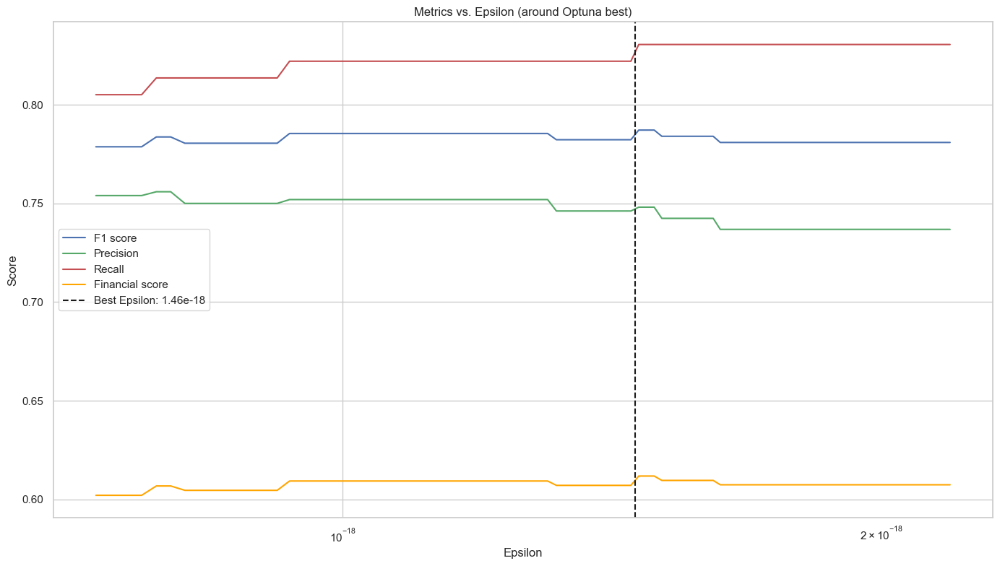

In [34]:
# -Plot Metrics Around Best Epsilon
epsilons_fine = np.linspace(best_epsilon * 0.5, best_epsilon * 1.5, 100)
f1_scores = []
precisions = []
recalls = []
fin_scores = []

for eps in epsilons_fine:
    preds = (p_MVG_cv < eps).astype(int)
    precision = precision_score(y_cross_val, preds, zero_division=0)
    recall = recall_score(y_cross_val, preds, zero_division=0)
    f1 = 2 * precision * recall / (precision + recall) if precision + recall > 0 else 0
    finscore = financial_score(y_cross_val, preds,
                            mean_anomaly=mean_anomaly,
                            mean_normal=mean_normal)
    fin_scores.append(finscore)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)

plt.figure(figsize=(14, 8))
plt.plot(epsilons_fine, f1_scores, label='F1 score', color='b')
plt.plot(epsilons_fine, precisions, label='Precision', color='g')
plt.plot(epsilons_fine, recalls, label='Recall', color='r')
plt.plot(epsilons_fine, fin_scores, label='Financial score', color='orange')
plt.axvline(best_epsilon, linestyle='--', color='k', label=f'Best Epsilon: {best_epsilon:.2e}')
plt.xlabel('Epsilon')
plt.ylabel('Score')
plt.title('Metrics vs. Epsilon (around Optuna best)')
plt.legend()
plt.grid(True)
plt.xscale('log')
plt.tight_layout()
plt.show()

### Final Evaluation on the Test Set

We now apply the learned model to the held-out test set. Using the optimal ε, we compute predicted labels and evaluate the model using precision, recall, F1 score, confusion matrix, and ROC curve.

Note: Since higher PDF values indicate **normality**, we invert the scores (`1 - p_test`) when plotting the ROC curve, so that higher values correspond to more anomalous points.



MVG + Optuna ε Performance:
Precision: 0.7007
Recall:    0.8067
F1 Score:  0.7500
Financial Score: 0.5818


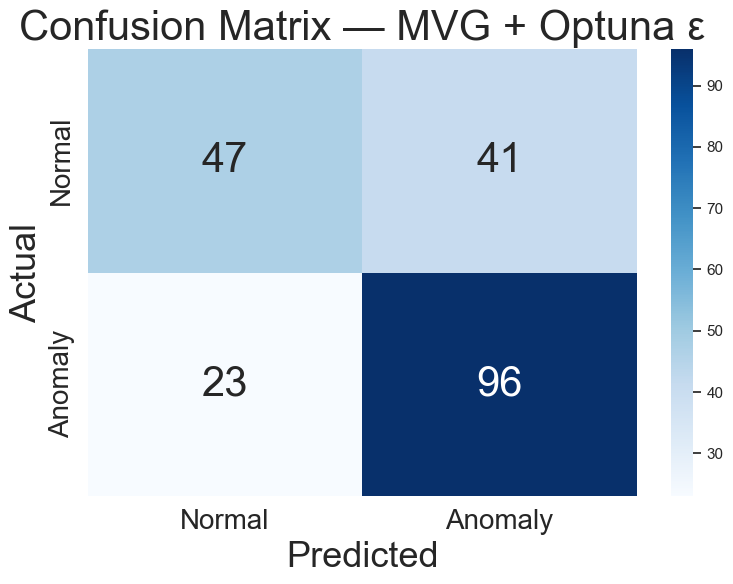

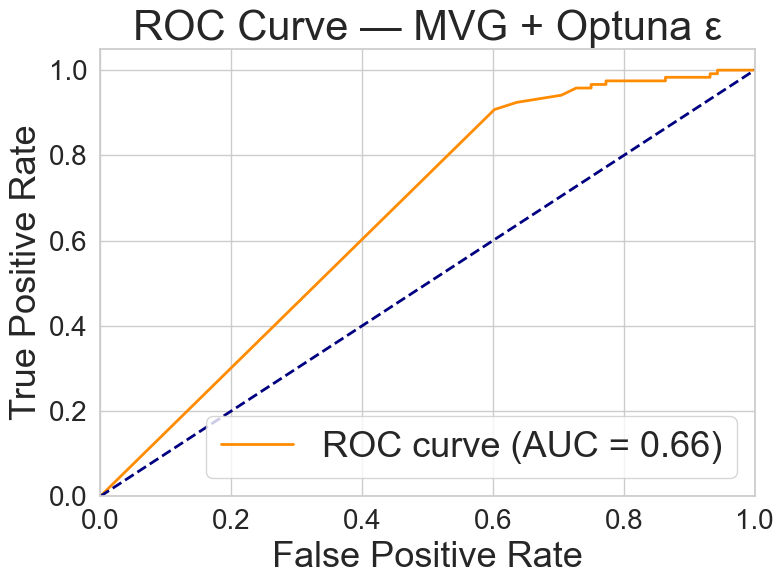

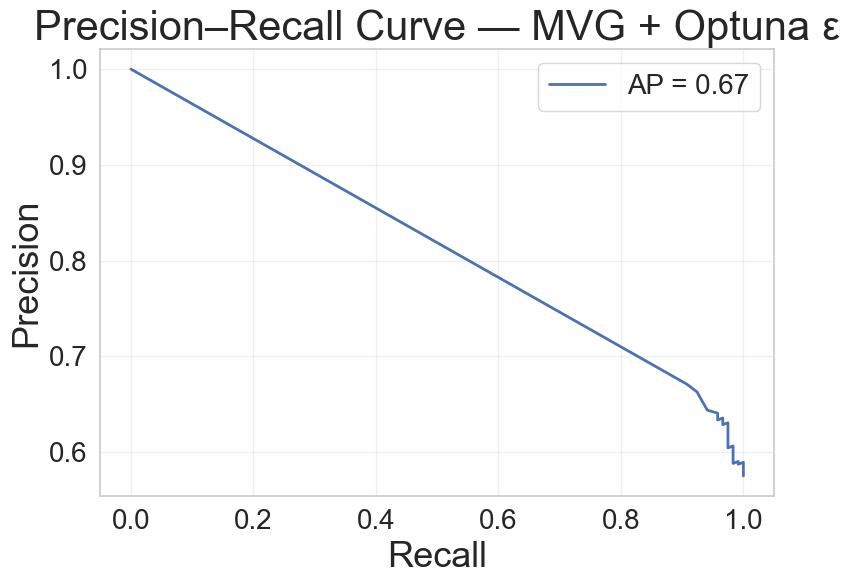

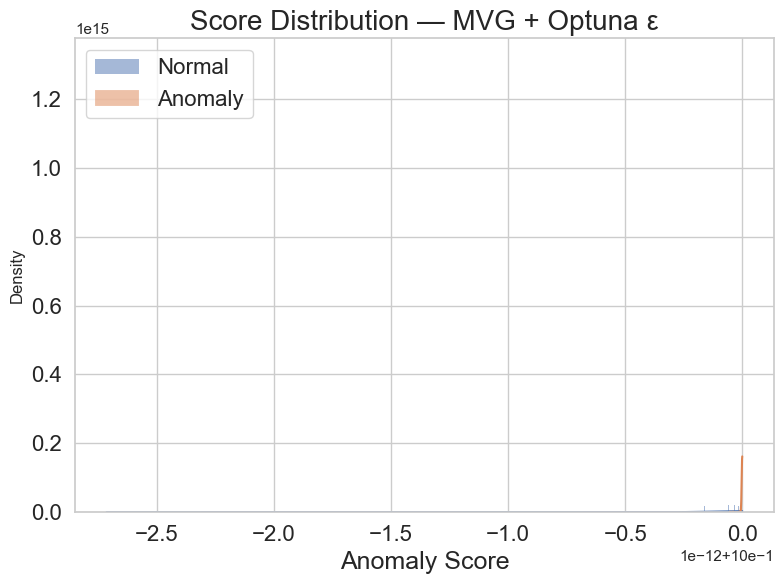

In [35]:
# Final Evaluation on the Test Set
p_MVG_test = multivariate_gaussian_pdf(X_test, mu, sigma)
y_MVG_pred_test = (p_MVG_test < best_epsilon).astype(int)

# # Anomaly scores using negative log-likelihood
# y_score_MVG = -np.log(p_MVG_test + 1e-12)

# # Evaluate
# evaluate_model(y_test, y_MVG_pred_test, y_score=y_score_MVG, model_name="MVG + Optuna ε")

# Use raw probability scores for ROC curve
precision, recall, f1, fin = evaluate_model(y_test, y_MVG_pred_test, y_score=1 - p_MVG_test, model_name="MVG + Optuna ε", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="MVG + Optuna", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### Comparing PCA, UMAP, t-SNE, and Spectral Embedding on the Test Set

We visualize the test set using **PCA**, **UMAP**, **t-SNE**, and **Spectral Embedding** to compare how each dimensionality reduction technique reveals the structure of normal and anomalous data in 2D space.

Each method offers a unique perspective:
- **PCA** captures global linear variance.
- **UMAP** preserves both local and global geometry in a non-linear latent space.
- **t-SNE** emphasizes local clusters and neighborhood relationships.
- **Spectral Embedding** leverages graph-based connectivity to reveal underlying manifold structures.

By comparing them side by side, we can evaluate how well the MVG + Optuna model separates normal vs. anomalous data under different geometric assumptions. This helps uncover patterns that may not be evident in the original high-dimensional space.


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


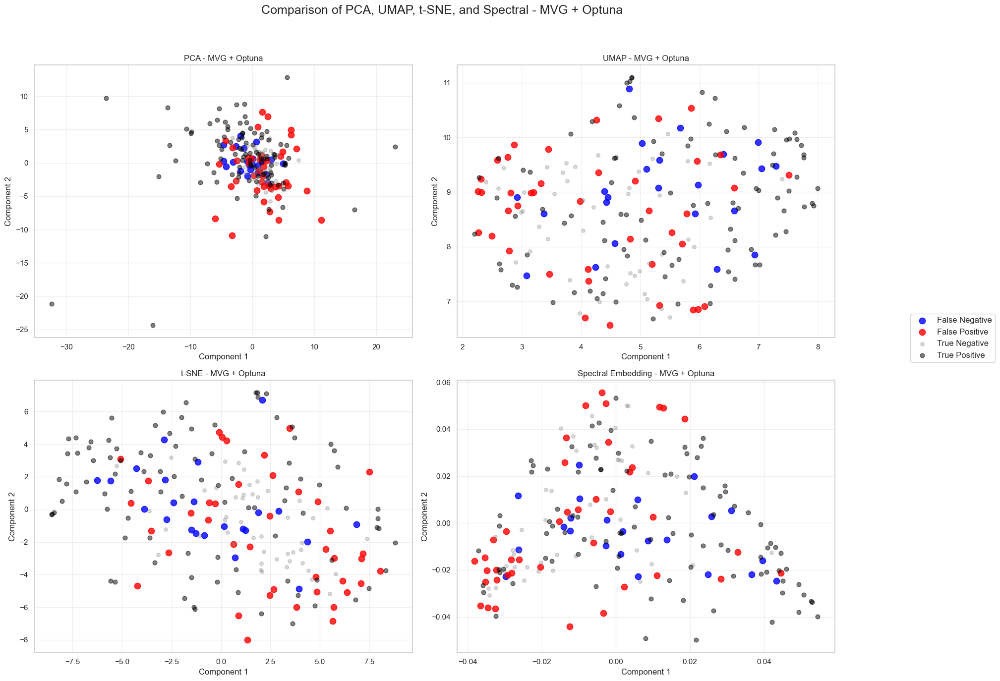

In [36]:
# Visualize PCA, UMAP, and t-SNE for the test set
compare_dim_reductions(X_test, y_test, y_MVG_pred_test, model_name="MVG + Optuna")


### Visualizing 3D Representations of MVG Model Predictions

To better understand how the MVG + Optuna model separates normal and anomalous points in high-dimensional space, we project the test set into 3D using four different dimensionality reduction techniques:

- PCA: Captures global linear structure.

- UMAP: Preserves both local and global non-linear geometry.

- t-SNE: Emphasizes local cluster separation.

- Spectral Embedding: Reveals structure based on graph connectivity.

Each method provides a unique lens for visualizing the classification boundaries and structure in the data.

In [37]:

if flag:
    # Visualize results in 3D using PCA, UMAP, t-SNE, and Spectral Embedding
    visualize_pca(X_test, y_true=y_test, y_pred=y_MVG_pred_test, model_name="MVG + Optuna", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_MVG_pred_test, model_name="MVG + Optuna", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_MVG_pred_test, model_name="MVG + Optuna", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_MVG_pred_test, model_name="MVG + Optuna", num_components=3)



### Feature Importance for MVG Model

We estimate feature importance for the Multivariate Gaussian model by measuring how each feature affects the average log-likelihood on the test set.

How it works:
- Compute the original log-likelihood for the test set.
- For each feature, set it to zero and recompute the log-likelihood.
- The drop in log-likelihood indicates the feature's importance.

Interpretation:
Features that cause a larger drop are more critical for modeling normality.

The output is a horizontal bar plot showing the top 20 most influential features in terms of how much their perturbation reduces the model's confidence (i.e., the log-likelihood).

Note: Feature perturbation assumes that inputs are standardized. If your data is not standardized, use the corresponding feature mean instead of zero.

In [38]:
def analyze_mvg_feature_importance(X, mu, sigma, feature_names):
    """
    Estimates feature importance for MVG model by measuring how zeroing out each feature
    affects the average log-likelihood of the test set.
    """
    n_features = X.shape[1]
    importance_scores = []

    # Regularized covariance matrix
    sigma_reg = sigma + np.eye(sigma.shape[0]) * 1e-8
    inv_sigma = np.linalg.inv(sigma_reg)
    det_sigma = np.linalg.det(sigma_reg)

    # Original log-likelihoods
    def log_likelihood(X_sample):
        diff = X_sample - mu
        return -0.5 * (np.log((2 * np.pi)**n_features * det_sigma) +
                       np.sum(diff @ inv_sigma * diff, axis=1))

    original_ll = log_likelihood(X)
    baseline_score = np.mean(original_ll)

    for i in range(n_features):
        X_perturbed = X.copy()
        X_perturbed[:, i] = 0  # or use mu[i]
        perturbed_ll = log_likelihood(X_perturbed)
        drop = baseline_score - np.mean(perturbed_ll)
        importance_scores.append(drop)

    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importance_scores
    }).sort_values(by='Importance', ascending=False)

    # Plot top 20
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')
    plt.title('Top 20 features by importance (MVG)', fontsize=16)
    plt.xlabel('Log-Likelihood Drop', fontsize=14)
    plt.tight_layout()
    plt.show()

    return importance_df


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\23860659.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')


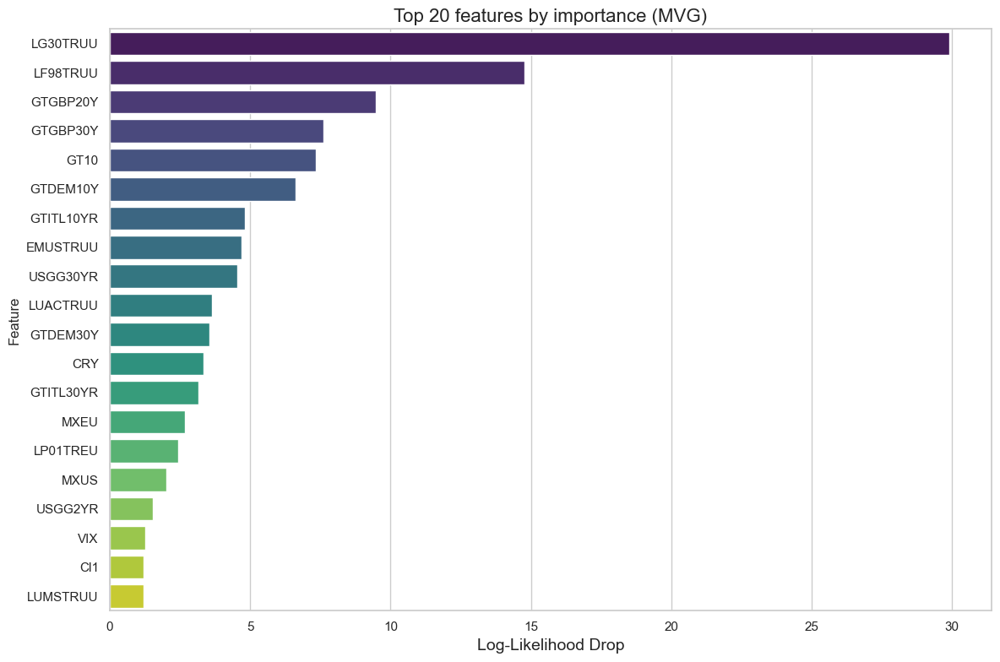

In [39]:
feature_names = stationary_df.columns  # or wherever you get them from
mvg_feature_importance = analyze_mvg_feature_importance(X_test, mu, sigma, feature_names)


# 6. Autoencoder

An **Autoencoder** is a type of **neural network** designed to learn compressed representations of data. It belongs to the family of **latent variable models**, alongside:

- **PCA**, which learns linear projections.
- **Factor models**, which assume dependence on unobserved linear factors.

Unlike these linear methods, an autoencoder can capture **complex, non-linear structures** thanks to the expressiveness of deep learning.


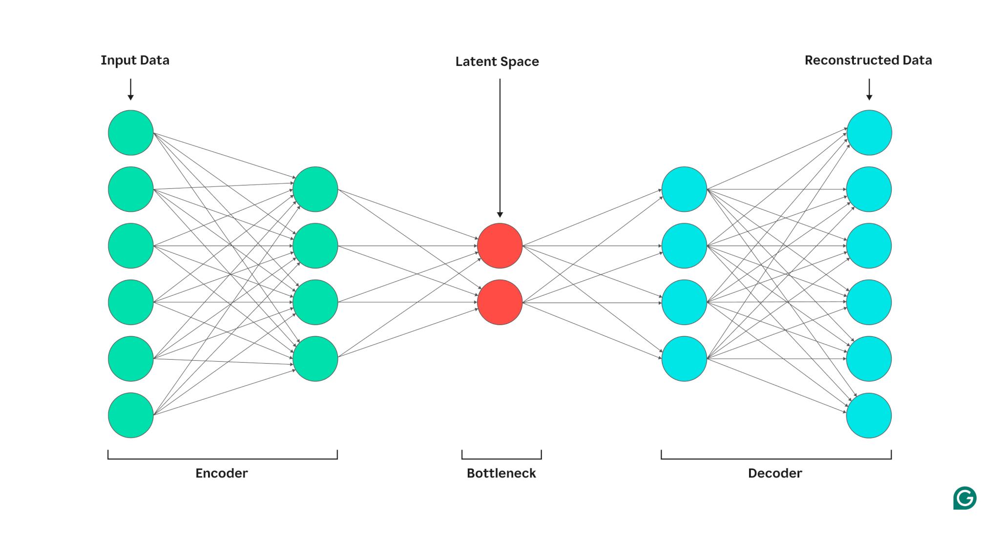



### How It Works

The Autoencoder consists of two main components:

- **Encoder**: Maps the input to a lower-dimensional latent space (the **bottleneck**).
- **Decoder**: Attempts to reconstruct the original input from this compressed representation.

> The **bottleneck** forces the model to learn only the most essential features of the data — discarding irrelevant noise.

The model is trained to minimize **reconstruction error**, typically using **Mean Squared Error (MSE)**. Once trained on normal data, it can be used for anomaly detection:

- **Low reconstruction error** → likely a **normal** point.
- **High reconstruction error** → likely an **anomaly**.

### Training Strategy

- **Unsupervised training**: The autoencoder is trained using only **normal data**, without labels.
- **Supervised threshold tuning**: A validation set (with labels) is used to choose a reconstruction error threshold that distinguishes normal from anomalous points — just as we did with the Gaussian baseline model.

### Neural Network Architecture

We use a **symmetric feedforward neural network** with the following features:

- **Encoder**: Reduces the input to a compact latent representation.
- **Decoder**: Reconstructs the input from this latent code.
- **Loss function**: Mean Squared Error (MSE), comparing input and output.
- **Regularization techniques**:
  - **Batch Normalization**: Stabilizes and accelerates training.
  - **Dropout**: Prevents overfitting and improves generalization.

### Further Reading

- [Wikipedia: Autoencoders](https://en.wikipedia.org/wiki/Autoencoder)  
- [Deep Learning Book – Chapter on Autoencoders](https://www.deeplearningbook.org/contents/autoencoders.html)  
- [A comprehensive study of auto-encoders for anomaly detection](https://www.sciencedirect.com/science/article/pii/S2666827024000483?dgcid=rss_sd_all)


### Two-Stage Autoencoder Tuning with Optuna

This section implements a two-step optimization pipeline using Optuna to build an Autoencoder-based anomaly detector. The procedure separates the unsupervised model training from the supervised threshold selection, ensuring interpretability and better generalization.

- Step 1 - Model Tuning (Unsupervised Phase)
    We use Optuna to minimize the reconstruction loss (MSE) on the training set by searching over:

        - encoding_dim: Size of the latent space (compression level)

        - dropout: Dropout rate to prevent overfitting

        - lr: Learning rate for the Adam optimizer

        - weight_decay: L2 regularization strength

    The model is trained on normal data only using early stopping.
    The best trial minimizes the training loss and its parameters are used to define the final Autoencoder architecture.

    <br>

- Step 2 - Threshold Tuning (Supervised Phase)
    Once the model is trained, we compute the reconstruction error on a labeled validation (CV) set.

    Then, Optuna searches for the best threshold ε that maximizes the F1-score by converting the reconstruction error into binary predictions:

        - If the reconstruction error > ε → anomaly

        - Else → normal

    This threshold is selected to balance precision and recall, leveraging true anomaly labels in the validation set.

### Why Two Steps?
| Step | Purpose                                    | Uses Labels? |
| ---- | ------------------------------------------ | ------------ |
| 1    | Train the autoencoder on normal data       | ❌ No         |
| 2    | Find the threshold for detecting anomalies | ✅ Yes        |


This separation ensures that the model learns normality patterns in an unsupervised fashion, and leverages supervision only when tuning how anomalies are identified.

### Final Output
- best_model: Trained Autoencoder with optimized architecture.

- best_threshold: Value for reconstruction error that best separates anomalies from normal points.


In [40]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import optuna
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score

# Set random seeds for reproducibility
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(42)

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Convert data to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train).to(device)
X_cv_tensor = torch.FloatTensor(X_cross_val).to(device)
X_test_tensor = torch.FloatTensor(X_test).to(device)
y_cv_tensor = torch.LongTensor(y_cross_val).to(device)
y_test_tensor = torch.LongTensor(y_test).to(device)

# Create training DataLoader
def create_dataloader(X_tensor, batch_size):
    dataset = TensorDataset(X_tensor, X_tensor)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Define the Autoencoder architecture
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=16, dropout=0.2):
        super(Autoencoder, self).__init__()
        hidden1 = max(input_dim // 2, encoding_dim * 2)
        hidden2 = max(hidden1 // 2, encoding_dim)

        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(hidden1, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(hidden2, encoding_dim),
            nn.BatchNorm1d(encoding_dim),
            nn.ReLU(True)
        )

        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(hidden2, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(hidden1, input_dim),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Training function
def train_autoencoder(model, train_loader, criterion, optimizer, num_epochs=100, patience=10, plot_loss=True):
    best_loss = float('inf')
    no_improve_epochs = 0
    train_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for data, _ in train_loader:
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, data)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * data.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)

        if epoch_loss < best_loss:
            best_loss = epoch_loss
            no_improve_epochs = 0
            torch.save(model.state_dict(), "best_autoencoder.pth")
        else:
            no_improve_epochs += 1
            if no_improve_epochs >= patience:
                break

    model.load_state_dict(torch.load("best_autoencoder.pth"))

    if plot_loss:
        plt.figure(figsize=(10, 6))
        plt.plot(train_losses)
        plt.title('Autoencoder Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('MSE Loss')
        plt.grid(True)
        plt.show()

    return model, train_losses

# First STep: Unsupervised Optuna Tuning (Reconstruction Loss)
def objective_model(trial):
    encoding_dim = trial.suggest_int("encoding_dim", 4, 64)
    dropout = trial.suggest_float("dropout", 0.1, 0.5)
    lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
    weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-3)

    model_AE = Autoencoder(input_dim=X_train.shape[1], encoding_dim=encoding_dim, dropout=dropout).to(device)
    optimizer = optim.Adam(model_AE.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.MSELoss()
    train_loader = create_dataloader(X_train_tensor, batch_size=64)

    model_AE, losses = train_autoencoder(model_AE, train_loader, criterion, optimizer, num_epochs=100, patience=10, plot_loss=False)
    return min(losses)

def run_optuna_autoencoder(n_trials=30):
    study = optuna.create_study(
        direction="minimize",
        study_name="autoencoder_study",
        storage="sqlite:///optuna_autoencoder.db",
        load_if_exists=True,
        sampler=optuna.samplers.TPESampler(),
        pruner=optuna.pruners.MedianPruner(n_warmup_steps=5)
    )
    print("Starting Autoencoder hyperparameter tuning …")
    study.optimize(objective_model, n_trials=n_trials)
    print("Best AE Loss:", study.best_value)
    print("Best AE Params:", study.best_params)
    return study

study_model = run_optuna_autoencoder(n_trials=1)




[I 2025-05-14 15:17:36,230] Using an existing study with name 'autoencoder_study' instead of creating a new one.


Using device: cuda
Starting Autoencoder hyperparameter tuning …


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2879955083.py:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2879955083.py:122: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-3)
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2879955083.py:104: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://gi

Best AE Loss: 0.4116211245770441
Best AE Params: {'encoding_dim': 64, 'dropout': 0.10008476198034132, 'lr': 0.0034305750967966943, 'weight_decay': 4.575865131256505e-05}


Best model params: {'encoding_dim': 64, 'dropout': 0.10008476198034132, 'lr': 0.0034305750967966943, 'weight_decay': 4.575865131256505e-05}


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2879955083.py:104: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_autoencoder.pth"))


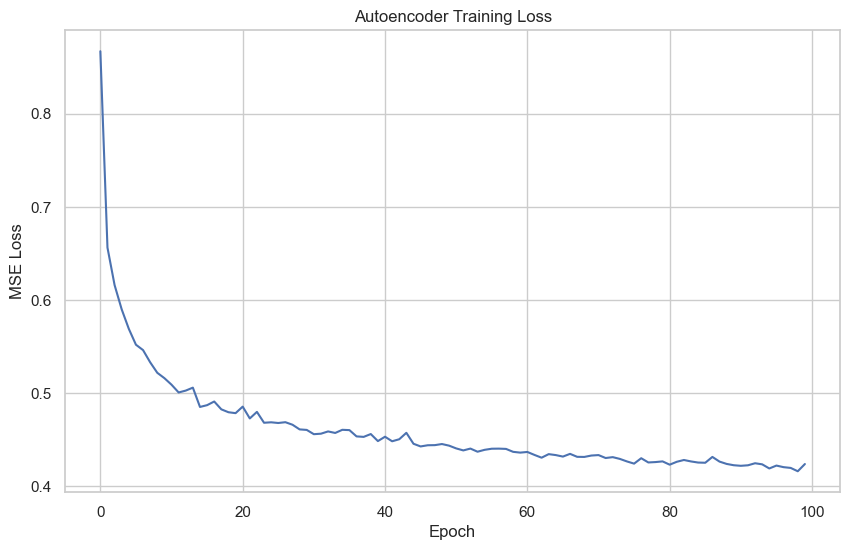

[I 2025-05-14 15:17:43,110] Using an existing study with name 'threshold_study' instead of creating a new one.
[I 2025-05-14 15:17:43,331] Trial 1700 finished with value: 0.3673469387755102 and parameters: {'threshold': 1.4989483524465488}. Best is trial 1081 with value: 0.784.
[I 2025-05-14 15:17:43,372] Trial 1701 finished with value: 0.4387096774193548 and parameters: {'threshold': 1.2323724074912534}. Best is trial 1081 with value: 0.784.
[I 2025-05-14 15:17:43,414] Trial 1702 finished with value: 0.42105263157894735 and parameters: {'threshold': 1.3288279796160045}. Best is trial 1081 with value: 0.784.
[I 2025-05-14 15:17:43,450] Trial 1703 finished with value: 0.5 and parameters: {'threshold': 0.9956384809180286}. Best is trial 1081 with value: 0.784.
[I 2025-05-14 15:17:43,484] Trial 1704 finished with value: 0.5380116959064328 and parameters: {'threshold': 0.905168827348068}. Best is trial 1081 with value: 0.784.
[I 2025-05-14 15:17:43,517] Trial 1705 finished with value: 0.32

Best threshold from CV set: 0.32785990286520916


In [41]:
# Recreate model with best params
best_params = study_model.best_trial.params
print("Best model params:", best_params)

# Recreate model with best params
model_kwargs = {
    "encoding_dim": best_params["encoding_dim"],
    "dropout": best_params["dropout"]
}
best_model_AE = Autoencoder(input_dim=X_train.shape[1], **model_kwargs).to(device)

# Train again using best hyperparams
train_loader = create_dataloader(X_train_tensor, batch_size=64)
optimizer = optim.Adam(best_model_AE.parameters(), lr=best_params["lr"], weight_decay=best_params["weight_decay"])
criterion = nn.MSELoss()
best_model_AE, _ = train_autoencoder(best_model_AE, train_loader, criterion, optimizer, num_epochs=100, patience=10)

best_model_AE.eval()

# Second step: Supervised Optuna Tuning (Threshold on CV set)
p_cv_recon = ((X_cv_tensor - best_model_AE(X_cv_tensor))**2).mean(dim=1).detach().cpu().numpy()

def objective_threshold(trial):
    threshold = trial.suggest_float("threshold", np.min(p_cv_recon), np.max(p_cv_recon))
    preds = (p_cv_recon > threshold).astype(int)
    precision = precision_score(y_cross_val, preds, zero_division=0)
    recall = recall_score(y_cross_val, preds, zero_division=0)
    if precision + recall == 0:
        return 0.0
    return 2 * precision * recall / (precision + recall)

study_thresh = optuna.create_study(
    direction="maximize",
    study_name="threshold_study",
    storage="sqlite:///optuna_threshold.db",
    load_if_exists=True,
    sampler=optuna.samplers.TPESampler(),
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=5)
)
study_thresh.optimize(objective_threshold, n_trials=50)

best_threshold = study_thresh.best_params["threshold"]
print("Best threshold from CV set:", best_threshold)



Contamination rate from cross-validation set: 0.5756


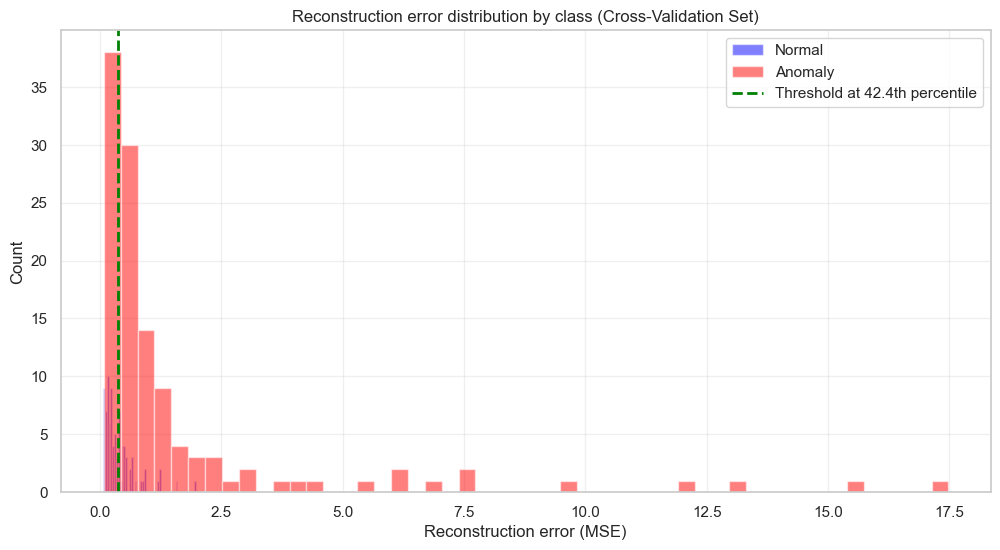

Threshold for anomaly detection: 0.372639


In [42]:
# Compute reconstruction error
def compute_reconstruction_error(model, data_tensor):
    model.eval()
    with torch.no_grad():
        reconstructions = model(data_tensor)
        mse = ((reconstructions - data_tensor) ** 2).mean(dim=1).cpu().numpy()
    return mse

# Compute reconstruction errors
train_errors = compute_reconstruction_error(best_model_AE, X_train_tensor)
cv_errors = compute_reconstruction_error(best_model_AE, X_cv_tensor)
test_errors = compute_reconstruction_error(best_model_AE, X_test_tensor)

# Determine threshold from CV contamination
contamination = np.mean(y_cross_val)
print(f"Contamination rate from cross-validation set: {contamination:.4f}")

cv_errors_normal = cv_errors[y_cross_val == 0]
cv_errors_anomaly = cv_errors[y_cross_val == 1]

plt.figure(figsize=(12, 6))
plt.hist(cv_errors_normal, bins=50, alpha=0.5, label='Normal', color='blue')
plt.hist(cv_errors_anomaly, bins=50, alpha=0.5, label='Anomaly', color='red')
plt.axvline(x=np.percentile(cv_errors, 100 * (1 - contamination)),
            color='green', linestyle='dashed', linewidth=2,
            label=f'Threshold at {100 * (1 - contamination):.1f}th percentile')
plt.title('Reconstruction error distribution by class (Cross-Validation Set)')
plt.xlabel('Reconstruction error (MSE)')
plt.ylabel('Count')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Set threshold
threshold = np.percentile(cv_errors, 100 * (1 - contamination))
print(f"Threshold for anomaly detection: {threshold:.6f}")

# Evaluate on cross-validation set
y_AE_cv_pred = (cv_errors > threshold).astype(int)

### Final Evaluation of Autoencoder

We use the optimal reconstruction error threshold (found via Optuna) to classify test points as normal or anomalous.
Predictions are evaluated using standard classification metrics — precision, recall, F1 score, confusion matrix, and the ROC curve — via the evaluate_model utility.


Autoencoder + Optuna Performance:
Precision: 0.7054
Recall:    0.7647
F1 Score:  0.7339
Financial Score: 0.5649


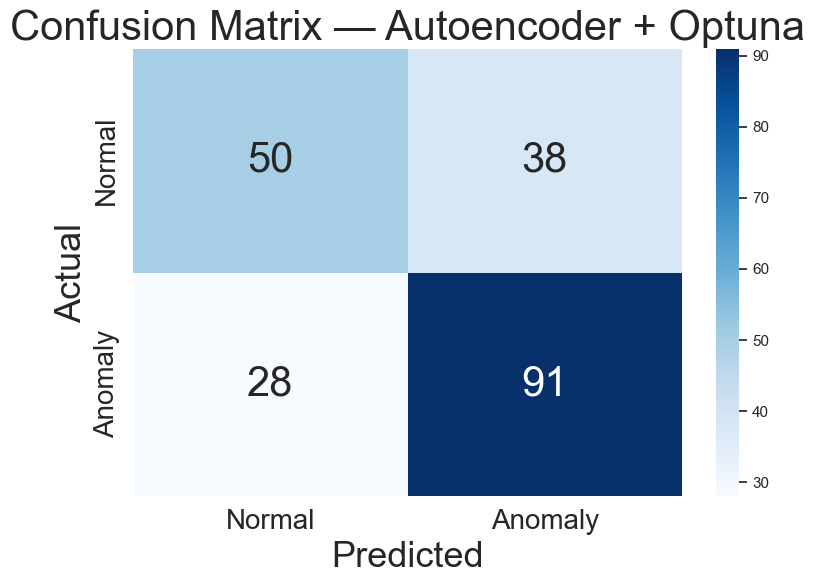

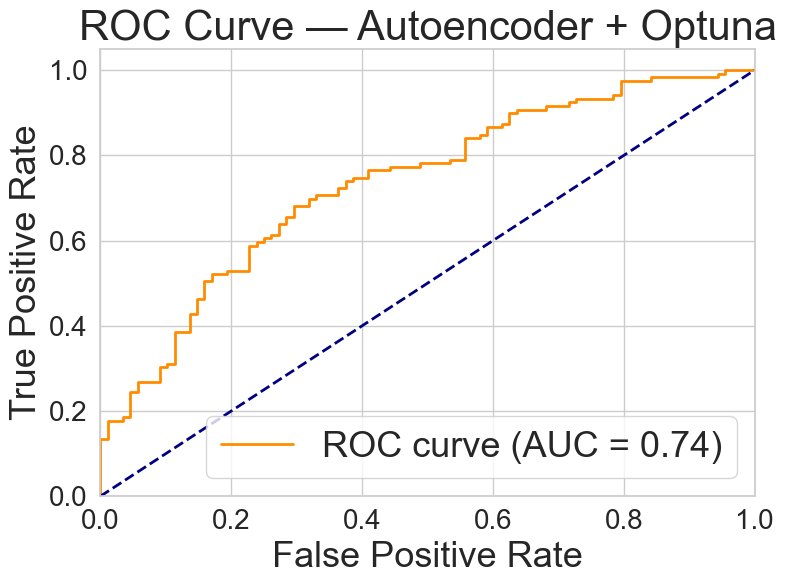

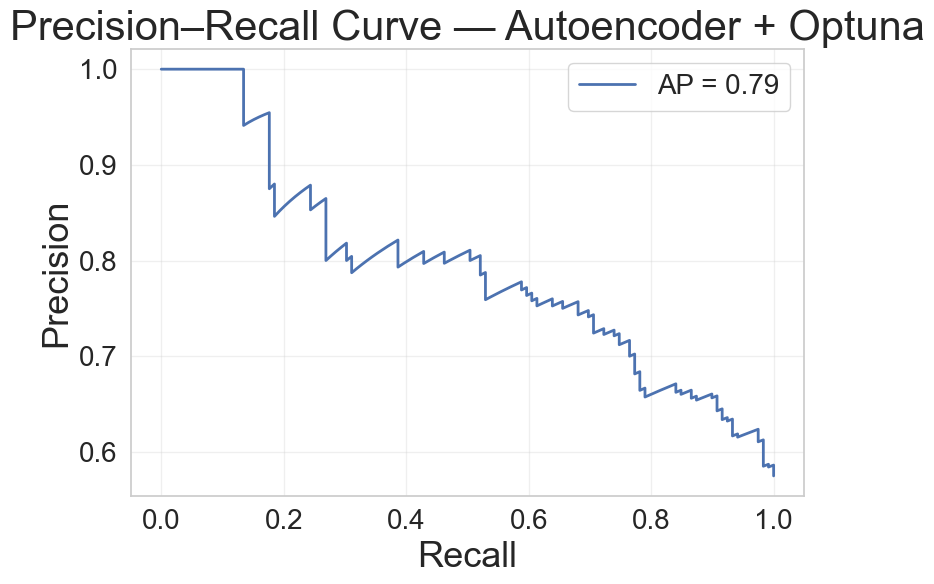

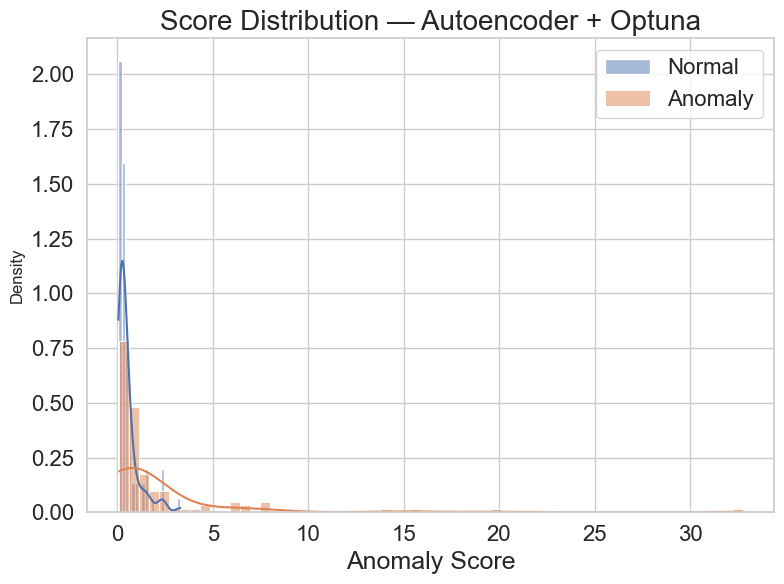

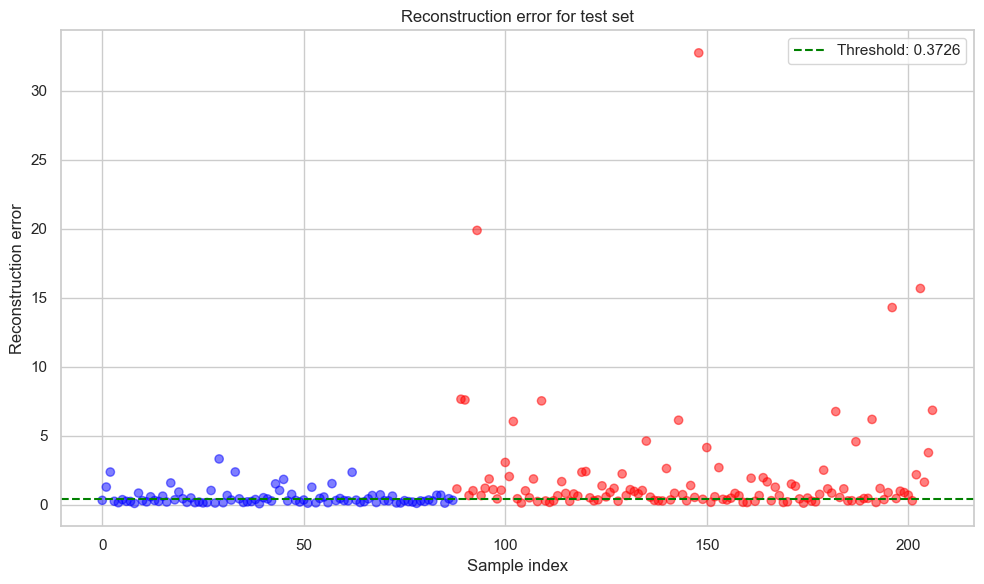

In [43]:
# Predict on test set using the best threshold
y_AE_pred_test = (test_errors > best_threshold).astype(int)

# Evaluate performance using existing function
precision, recall, f1, fin = evaluate_model(y_test, y_AE_pred_test, y_score=test_errors, model_name="Autoencoder + Optuna", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="Autoencoder + Optuna", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

# Visualize reconstruction error distribution
plt.figure(figsize=(10, 6))
plt.scatter(range(len(test_errors)),
            test_errors,
            c=['blue' if label == 0 else 'red' for label in y_test],
            alpha=0.5)
plt.axhline(y=threshold, color='green', linestyle='--', label=f'Threshold: {threshold:.4f}')
plt.title('Reconstruction error for test set')
plt.xlabel('Sample index')
plt.ylabel('Reconstruction error')
plt.legend()
plt.tight_layout()
plt.show()



### 2D Latent Space Projections with Autoencoder Predictions

We visualize the Autoencoder's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


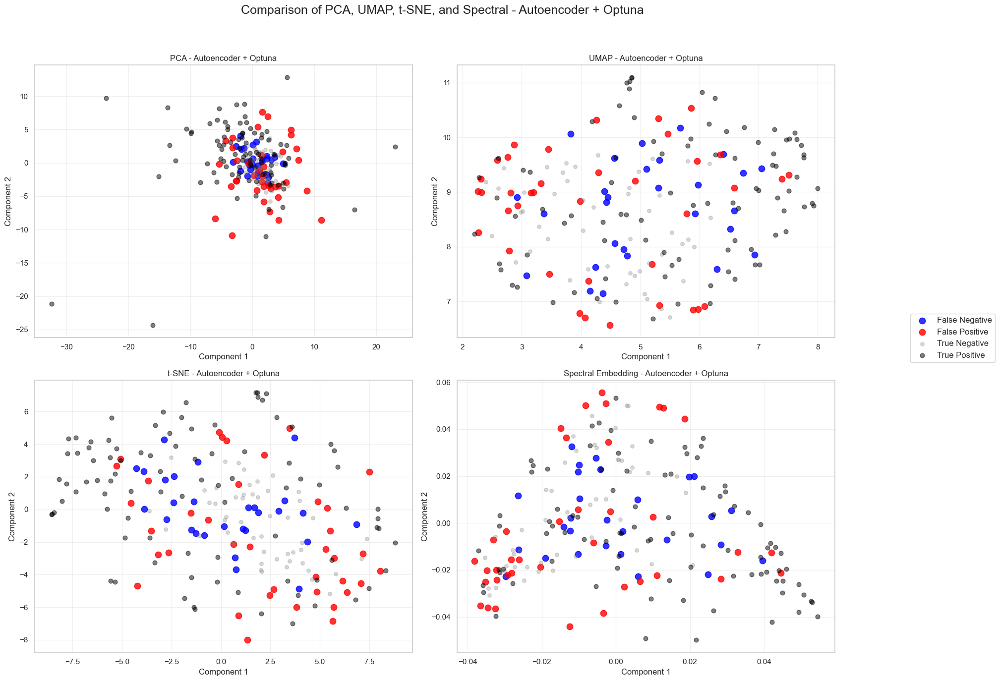

In [44]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_AE_pred_test, model_name="Autoencoder + Optuna")


### 3D Visualization of Autoencoder Predictions

To better understand how the Autoencoder + Optuna model separates normal and anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [45]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_AE_pred_test, model_name="Autoencoder + Optuna", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_AE_pred_test, model_name="Autoencoder + Optuna", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_AE_pred_test, model_name="Autoencoder + Optuna", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_AE_pred_test, model_name="Autoencoder + Optuna", num_components=3)

### Feature importance

We estimate feature importance by **zeroing out** each feature (one at a time) and measuring how much the **reconstruction error increases**.

This tells us which variables are most critical to the model's understanding of “normality.”  

> Useful for interpretability — especially in financial or operational risk settings.


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\385810751.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')


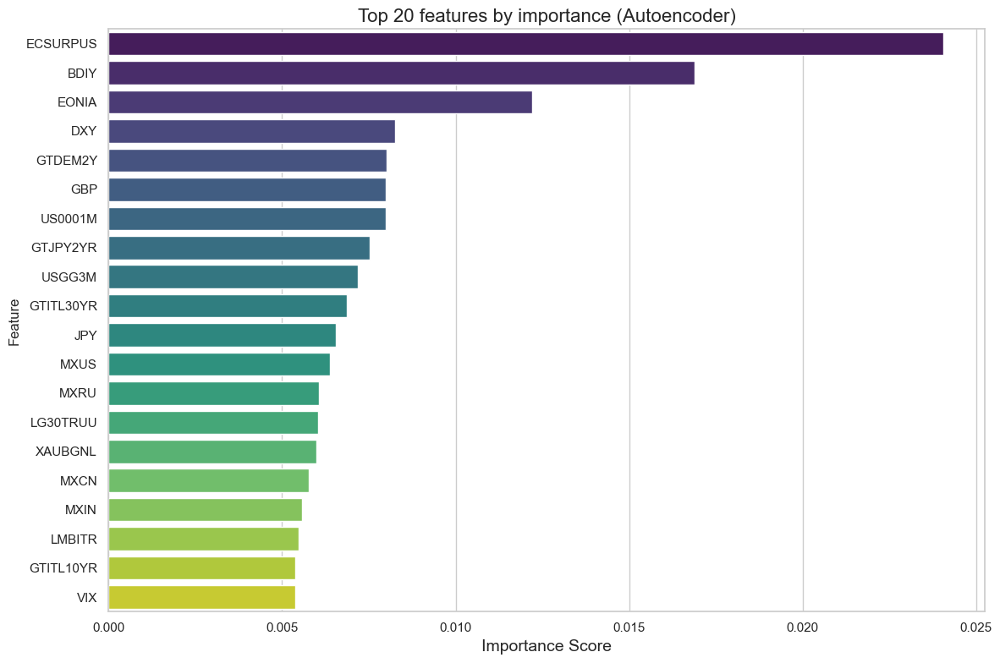


Top 10 most important features:
      Feature  Importance
41   ECSURPUS    0.024040
0        BDIY    0.016885
23      EONIA    0.012205
3         DXY    0.008251
26    GTDEM2Y    0.008000
5         GBP    0.007997
37    US0001M    0.007985
35   GTJPY2YR    0.007535
40     USGG3M    0.007177
33  GTITL30YR    0.006858


In [46]:
# Feature importance analysis using the autoencoder
def analyze_feature_importance(model, X_tensor, feature_names):
    """
    Analyze feature importance by measuring the impact of each feature on reconstruction error
    """
    model.eval()
    n_features = X_tensor.shape[1]
    importance_scores = []

    # Original reconstruction error
    with torch.no_grad():
        original_output = model(X_tensor)
        original_error = ((original_output - X_tensor) ** 2).mean(dim=0).cpu().numpy()

    # Measure impact of perturbing each feature
    for i in range(n_features):
        # Create a copy with the i-th feature perturbed
        perturbed_input = X_tensor.clone()
        perturbed_input[:, i] = torch.zeros_like(perturbed_input[:, i])

        with torch.no_grad():
            perturbed_output = model(perturbed_input)
            perturbed_error = ((perturbed_output - X_tensor) ** 2).mean(dim=0).cpu().numpy()

        # Importance is the increase in error when the feature is perturbed
        feature_importance = np.mean(perturbed_error - original_error)
        importance_scores.append(feature_importance)

    # Create DataFrame with feature importance
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importance_scores
    })

    # Sort by importance
    importance_df = importance_df.sort_values('Importance', ascending=False)

    # Plot top 20 features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=importance_df.head(20), palette='viridis')
    plt.title('Top 20 features by importance (Autoencoder)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return importance_df

# Analyze feature importance
if 'stationary_df' in locals() and hasattr(stationary_df, 'columns'):
    feature_names = stationary_df.columns
    feature_importance_aut = analyze_feature_importance(best_model_AE, X_test_tensor, feature_names)
    print("\nTop 10 most important features:")
    print(feature_importance_aut.head(10))


# 7. Generative Adversarial Networks (GAN)

## GAN for Anomaly Detection

A **Generative Adversarial Network (GAN)** consists of two neural networks trained in a game-theoretic setup:

- **Generator (G)**: Learns to produce realistic fake data.
- **Discriminator (D)**: Learns to distinguish between real and fake data.

They are trained in opposition:
- The **generator** tries to fool the discriminator.
- The **discriminator** tries to catch the fakes from the generator.

### How is a GAN Used for Anomaly Detection?

Instead of just generating data, we use the **discriminator** to estimate whether a data point is **"realistic"**:
- If the discriminator is **unsure** or **rejects** the input, we flag it as **anomalous**.

There are two common strategies:
1. **Discriminator-based**: Use the discriminator's output as an anomaly score.
2. **Reconstruction-based**: Train the generator to reconstruct normal data (similar to autoencoders) and use reconstruction error as the anomaly score.


### Training / Validation / Test Process

#### 1. **Training Phase** (Unsupervised)
- Train the GAN **only on normal data**.
- The generator learns to generate realistic normal samples.
- The discriminator learns to distinguish real vs fake.

#### 2. **Validation Phase** (Semi-supervised)
- Use a labeled **cross-validation set** (normal + anomalies).
- Tune a **threshold** on the discriminator score or reconstruction error.
- Use a metric like **F1 score** or **AUROC**, possibly optimized via **Optuna**.

#### 3. **Test Phase** (Supervised Evaluation)
- Apply the trained GAN to the **test set**.
- Use the tuned threshold to classify samples as normal or anomalous.
- Evaluate performance using:
  - Precision, Recall, F1 Score
  - Confusion Matrix
  - ROC Curve, AUC

### Further Reading

- [Wikipedia: Generative Adversarial Network](https://en.wikipedia.org/wiki/Generative_adversarial_network)
- [Survey: GANs for Anomaly Detection (arXiv)](https://arxiv.org/pdf/1906.11632)

> GANs are powerful but can be difficult to train. Stability and interpretability are major challenges in applying them to anomaly detection.


## 7.1 Vanilla GAN for Anomaly Detection
A Vanilla GAN consists of two neural networks trained adversarially:

- The Generator learns to produce synthetic data that mimics the real (normal) data distribution.

- The Discriminator learns to distinguish between real data and synthetic data.

### Anomaly Detection Principle
After training on normal data only:

- Normal data should be recognized as "real" by the discriminator.

- Anomalous data will be seen as "fake", since it doesn't match the learned distribution.

We use the discriminator's confidence (output score) as the anomaly score.

### Training
Input: Only normal samples.

Goal: Generator produces realistic samples; discriminator learns to distinguish fake from real.

### Testing
A sample is considered anomalous if the discriminator assigns it a low realness score.



## VanillaGANDetector

The `VanillaGANDetector` is a GAN-based anomaly detection model using a **basic discriminator score** for decision-making. It implements a standard **GAN training loop** with a Generator (`G`) and a Discriminator (`D`) that learn jointly via adversarial optimization.

### Architecture
- **Generator** `G`: maps random latent noise vectors `z ~ N(0, I)` to synthetic samples resembling the real input data.
- **Discriminator** `D`: outputs a probability score indicating whether a sample is real or generated.

### Anomaly Detection Strategy
Once trained on normal data, the discriminator outputs **high scores for normal data** and **low scores for fake or anomalous data**. The anomaly score is thus derived from the discriminator’s confidence:
- If `D(x) < ε`, the sample is predicted as **anomaly**.

The threshold `ε` is calibrated using a **validation set** and a given **contamination rate**.

### Key Methods

| Method               | Description                                                                 |
|----------------------|-----------------------------------------------------------------------------|
| `fit(X_train)`       | Trains the GAN using unsupervised adversarial training.                    |
| `set_threshold()`    | Computes the decision threshold based on percentile of discriminator scores.|
| `predict(X)`         | Returns binary predictions and discriminator scores for input `X`.         |

### Usage Example
```python
gan = VanillaGANDetector(data_dim=X_train.shape[1])
gan.fit(X_train)
gan.set_threshold(X_cv, contam=0.05)
y_pred, scores = gan.predict(X_test)


In [47]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import pandas as pd
import umap
from sklearn.metrics import (
    precision_score, recall_score, f1_score,
    roc_curve, auc, precision_recall_curve,
    average_precision_score, confusion_matrix
)
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")


class VanillaGANDetector:
    def __init__(self, data_dim, latent_dim=32, device=None):
        self.device = device or torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.data_dim = data_dim
        self.latent_dim = latent_dim
        self._build_gan()

    def _build_gan(self):
        self.G = nn.Sequential(
            nn.Linear(self.latent_dim, 64), nn.LeakyReLU(0.2), nn.BatchNorm1d(64),
            nn.Linear(64, 128), nn.LeakyReLU(0.2), nn.BatchNorm1d(128),
            nn.Linear(128, self.data_dim)
        ).to(self.device)

        self.D1 = nn.Sequential(nn.Linear(self.data_dim, 128), nn.LeakyReLU(0.2), nn.Dropout(0.3))
        self.D2 = nn.Sequential(nn.Linear(128, 64), nn.LeakyReLU(0.2), nn.Dropout(0.3))
        self.Dout = nn.Sequential(nn.Linear(64, 1), nn.Sigmoid())
        for net in (self.D1, self.D2, self.Dout):
            net.to(self.device)

    def _discriminator(self, x):
        f1 = self.D1(x)
        f2 = self.D2(f1)
        return self.Dout(f2)

    def fit(self, X_train, n_epochs=100, batch_size=128, lr=2e-4):
        loader = DataLoader(TensorDataset(torch.from_numpy(X_train).float()), batch_size=batch_size, shuffle=True)
        optG = optim.Adam(self.G.parameters(), lr=lr, betas=(0.5, 0.999))
        optD = optim.Adam(list(self.D1.parameters()) + list(self.D2.parameters()) + list(self.Dout.parameters()), lr=lr, betas=(0.5, 0.999))
        bce = nn.BCELoss()

        for ep in range(1, n_epochs + 1):
            for real_batch, in loader:
                real = real_batch.to(self.device)
                bs = real.size(0)
                z = torch.randn(bs, self.latent_dim, device=self.device)
                fake = self.G(z).detach()

                lossD = bce(self._discriminator(real), torch.ones_like(real[:, :1])) + \
                        bce(self._discriminator(fake), torch.zeros_like(real[:, :1]))
                optD.zero_grad(); lossD.backward(); optD.step()

                z = torch.randn(bs, self.latent_dim, device=self.device)
                lossG = bce(self._discriminator(self.G(z)), torch.ones(bs, 1, device=self.device))
                optG.zero_grad(); lossG.backward(); optG.step()

    def set_threshold(self, X_train, contam):
        self.G.eval(); self.D1.eval(); self.D2.eval(); self.Dout.eval()
        with torch.no_grad():
            scores = self._discriminator(torch.from_numpy(X_train).float().to(self.device)).cpu().numpy().ravel()
        self.thr = np.percentile(scores, 100 * (1 - contam))

    def predict(self, X):
        with torch.no_grad():
            scores = self._discriminator(torch.from_numpy(X).float().to(self.device)).cpu().numpy().ravel()
        return (scores < self.thr).astype(int), scores




### Optuna Hyperparameter Tuning for Vanilla GAN

We use Optuna to tune the key hyperparameters of the VanillaGANDetector for anomaly detection. The tuning process is unsupervised during model training, and supervised when setting the classification threshold and evaluating performance on the cross-validation set.

What we optimize:

- latent_dim: dimensionality of the latent noise vector

- lr: learning rate for both generator and discriminator

- batch_size: training batch size

- n_epochs: number of training epochs

Objective: Maximize the F1 score on the cross-validation set, using a threshold calibrated from the estimated contamination rate.

In [48]:
# Optuna tuning for VanillaGANDetector
import optuna
from sklearn.metrics import f1_score

# Contamination estimation using cross-validation set
raw_contam   = np.mean(y_cross_val) 
contam       = min(raw_contam, 0.5)

def objective_gan(trial):
    # Suggest hyperparameters
    latent_dim = trial.suggest_int("latent_dim", 16, 128, log=True)
    lr         = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    batch_size = trial.suggest_categorical("batch_size", [64, 128, 256])
    n_epochs   = trial.suggest_int("n_epochs", 50, 200, step=50)

    # Initialize model
    model = VanillaGANDetector(
        data_dim   = X_train.shape[1],
        latent_dim = latent_dim
    )

    # Train the GAN
    model.fit(
        X_train,
        n_epochs   = n_epochs,
        batch_size = batch_size,
        lr         = lr
    )

    # Set threshold based on training set contamination
    model.set_threshold(X_train, contam)

    # Predict on CV set and compute F1
    y_pred, _ = model.predict(X_cross_val)
    f1 = f1_score(y_cross_val, y_pred)

    trial.report(f1, step=0)
    if trial.should_prune():
        raise optuna.TrialPruned()
    return f1

def run_optuna_gan(n_trials=30):
    study = optuna.create_study(
        direction      = "maximize",
        study_name     = "gan_study",
        storage        = "sqlite:///optuna_gan.db",
        load_if_exists = True,
        sampler        = optuna.samplers.TPESampler(),
        pruner         = optuna.pruners.MedianPruner(n_warmup_steps=5)
    )
    print("Starting VanillaGAN hyperparameter tuning …")
    study.optimize(objective_gan, n_trials=n_trials, show_progress_bar=True)
    print("Best F1:", study.best_value)
    print("Best params:", study.best_params)

    return study


### Training the Best Vanilla GAN
After running Optuna, we reconstruct and train the best-performing VanillaGANDetector model using the optimal hyperparameters. The anomaly threshold is calibrated on the training set, based on the estimated contamination rate.

Steps:

1. Load best hyperparameters from the Optuna study.

2. Rebuild and train the GAN with those settings.

3. Calibrate the threshold for anomaly detection.

In [49]:
# Vanilla GAN tuning
study_gan = run_optuna_gan(n_trials=1)

# Extract best parameters
best_g = study_gan.best_params

# Reconstruct best Vanilla GAN model
gan_model = VanillaGANDetector(
    data_dim   = X_train.shape[1],
    latent_dim = best_g["latent_dim"]
)

# Train with best hyperparameters
gan_model.fit(
    X_train,
    n_epochs   = best_g["n_epochs"],
    batch_size = best_g["batch_size"],
    lr         = best_g["lr"]
)

# Set threshold on training data
gan_model.set_threshold(X_train, contam)



[I 2025-05-14 15:17:48,083] Using an existing study with name 'gan_study' instead of creating a new one.


Starting VanillaGAN hyperparameter tuning …


  0%|          | 0/1 [00:00<?, ?it/s]

[I 2025-05-14 15:17:49,683] Trial 578 finished with value: 0.5775862068965517 and parameters: {'latent_dim': 40, 'lr': 0.000920448984480844, 'batch_size': 256, 'n_epochs': 100}. Best is trial 353 with value: 0.688.
Best F1: 0.688
Best params: {'latent_dim': 29, 'lr': 0.0009987307786858033, 'batch_size': 128, 'n_epochs': 100}


### Final Evaluation of Vanilla GAN

We now evaluate the trained Vanilla GAN model on the test set, using the calibrated threshold. This includes:

- Computing predicted labels based on discriminator scores.

- Assessing performance with:

    - Precision, Recall, F1 Score

    - Confusion Matrix

    - ROC Curve


--- Vanilla GAN (Test) ---

Vanilla GAN Performance:
Precision: 0.6075
Recall:    0.5462
F1 Score:  0.5752
Financial Score: 0.4343


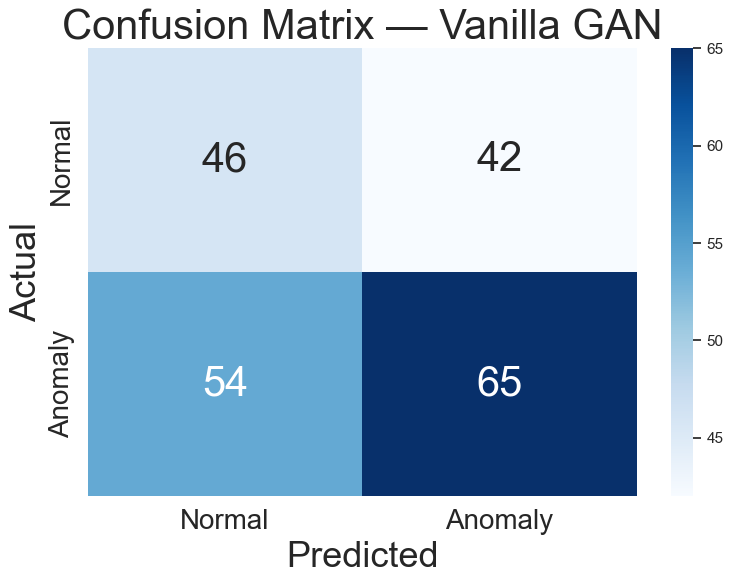

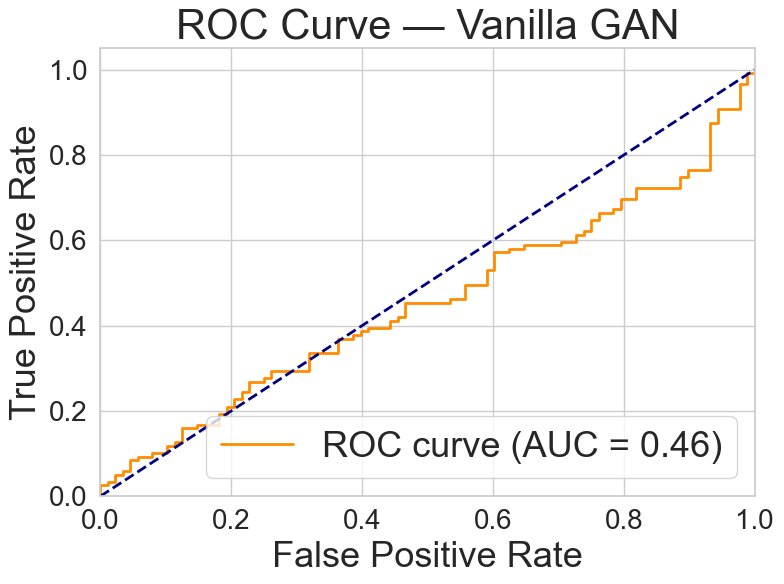

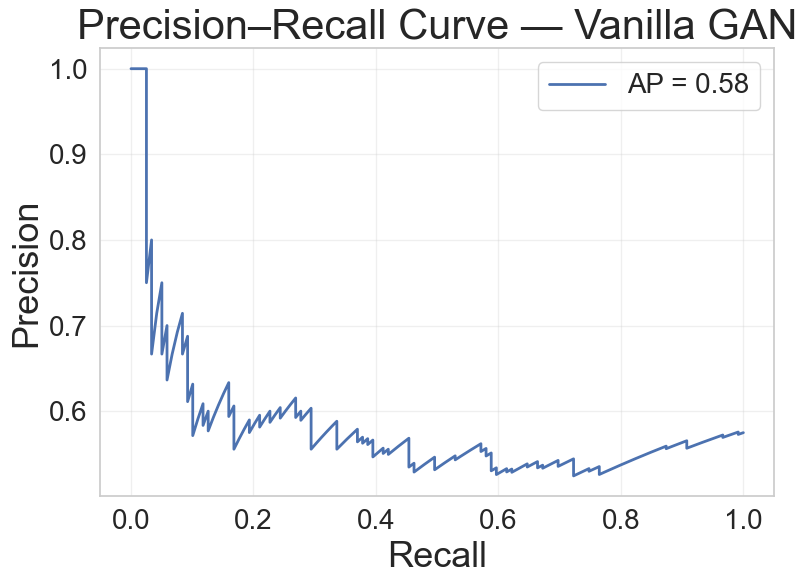

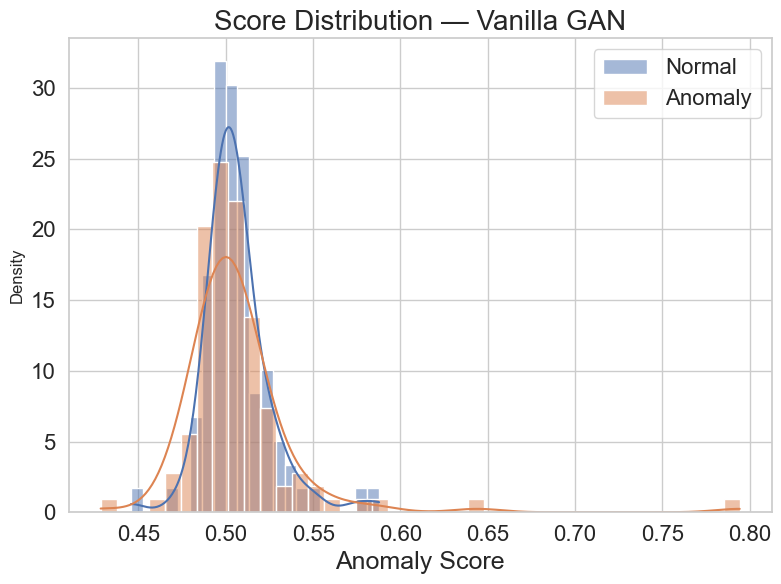

In [50]:
# # Evaluate on CV and Test sets
# print("\n--- Vanilla GAN (CV) ---")
# gan_model.evaluate(X_cv_scaled, y_cv, name="Vanilla GAN (CV)")

print("\n--- Vanilla GAN (Test) ---")
GAN_preds, GAN_scores = gan_model.predict(X_test)
# Evaluate performance using existing function
precision, recall, f1, fin = evaluate_model(y_test, GAN_preds, y_score=GAN_scores, model_name="Vanilla GAN", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="Vanilla GAN", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with Vanilla GAN Predictions

We visualize the Vanilla GAN's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


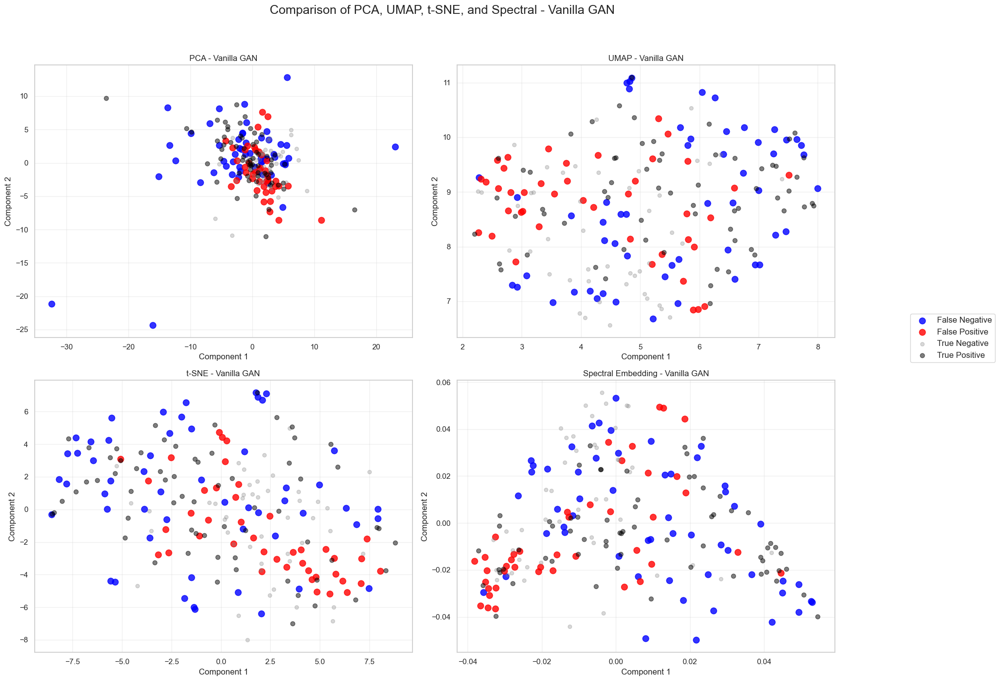

In [51]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, GAN_preds, model_name="Vanilla GAN")


### 3D Visualization of Vanilla GAN Predictions

To better understand how the Vanilla GAN detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [52]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=GAN_preds, model_name="Vanilla GAN", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=GAN_preds, model_name="Vanilla GAN", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=GAN_preds, model_name="Vanilla GAN", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=GAN_preds, model_name="Vanilla GAN", num_components=3)

### Vanilla GAN Feature Importance Analysis

The gan_feature_importance function estimates how important each feature is for the Vanilla GAN by measuring how much the discriminator’s score changes when that feature is masked (set to zero). A larger change means the feature is more influential in determining whether a point is realistic or anomalous.

The analysis:

- Perturbs each feature individually.

- Measures the average absolute change in discriminator output.

- Ranks and plots the top 20 most impactful features.

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2815621506.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


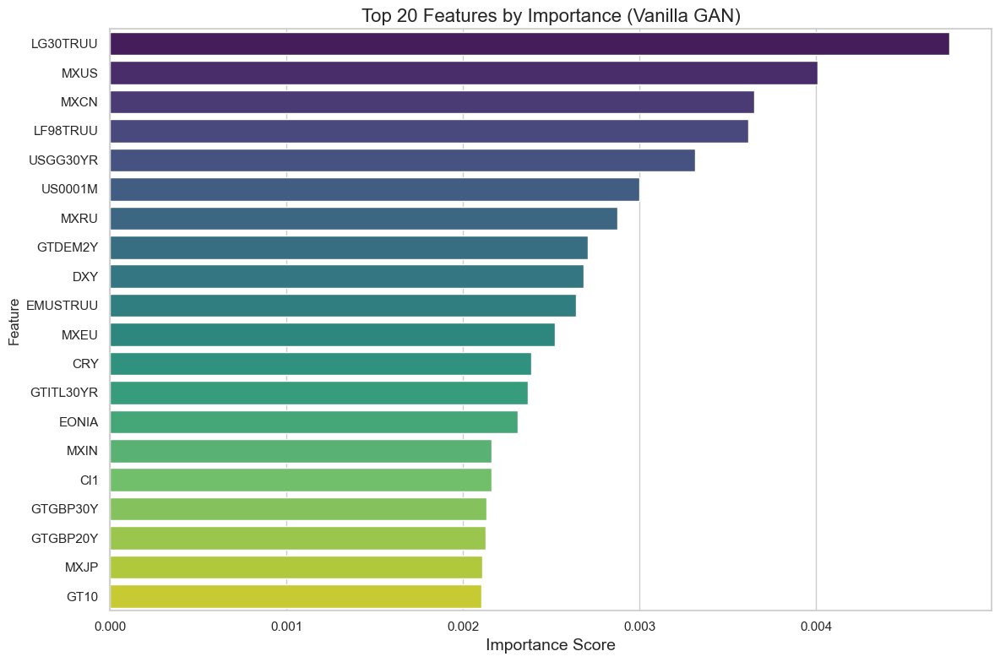

In [53]:
def gan_feature_importance(model, X, feature_names):
    """
    Measure feature importance for Vanilla GAN by evaluating how masking each feature affects discriminator score.
    """
    model.G.eval(); model.D1.eval(); model.D2.eval(); model.Dout.eval()
    X_tensor = torch.from_numpy(X).float().to(model.device)

    with torch.no_grad():
        original_scores = model._discriminator(X_tensor).cpu().numpy().ravel()

    importances = []
    for i in range(X.shape[1]):
        perturbed = X_tensor.clone()
        perturbed[:, i] = 0.0  # mask feature i
        with torch.no_grad():
            perturbed_scores = model._discriminator(perturbed).cpu().numpy().ravel()
        delta = np.abs(perturbed_scores - original_scores).mean()
        importances.append(delta)

    df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    df = df.sort_values('Importance', ascending=False)

    # Plot
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (Vanilla GAN)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df

gan_imp_df = gan_feature_importance(
    model=gan_model,
    X=X_test,
    feature_names=stationary_df.columns
)

## 7.2 f-AnoGAN (Feature-Matching GAN for Anomaly Detection)

f-AnoGAN improves upon vanilla GAN by addressing the key limitation: Vanilla GANs do not offer a direct way to map a test sample back to the latent space.

### Key Idea
f-AnoGAN introduces an encoder network that learns to project input samples into the latent space of the generator. This allows us to:

- Reconstruct any input using the generator.

- Compare the input and its reconstruction in feature space (not just pixel space).

### Anomaly Score
Anomaly detection is based on:

- Residual loss: difference between input and its reconstruction.

- Discrimination loss: how fake the discriminator thinks the reconstruction is.

These two scores are typically combined into a final anomaly score.

#### Training
1. Train a GAN (generator + discriminator) on normal data.

2. Train an encoder to map real samples to the latent space using feature-matching loss.

### Testing
1. Encode the test sample.

2. Generate its reconstruction.

3. Compare input vs. reconstruction in both pixel and feature space.

4. High anomaly score → likely anomaly.

## fAnoGANDetector

The `fAnoGANDetector` extends the vanilla GAN by introducing an **encoder** network that learns to project input data into the latent space. This enables efficient anomaly scoring using both **reconstruction error** and **feature-matching** loss, as proposed in **f-AnoGAN**.

### Architecture
- **Generator** `G`: Pre-trained from the Vanilla GAN.
- **Discriminator** `D`: Same as in the GAN, outputs both real/fake probability and intermediate feature representations.
- **Encoder** `E`: Learns to map data `x` to latent vectors `z = E(x)` such that `G(E(x)) ≈ x`.

### Anomaly Detection Strategy
After training the encoder:
- A sample is **reconstructed** via `G(E(x))`.
- The anomaly score is based on:
  - **Reconstruction error**: how well the sample can be rebuilt.
  - **Feature-matching error**: difference between feature activations of real vs. reconstructed samples from the discriminator.

### Key Methods

| Method               | Description                                                                  |
|----------------------|------------------------------------------------------------------------------|
| `fit(X_train)`       | Trains the encoder using reconstruction and feature-matching loss.           |
| `set_threshold()`    | Sets the decision threshold using percentile of reconstruction errors.       |
| `predict(X)`         | Returns anomaly predictions and reconstruction scores for input `X`.         |

### Usage Example
```python
fanogan = fAnoGANDetector(generator=gan.G, discriminator=(gan.D1, gan.D2, gan.Dout), data_dim=X_train.shape[1])
fanogan.fit(X_train)
fanogan.set_threshold(X_cv, contam=0.05)
y_pred, scores = fanogan.predict(X_test)


In [54]:
class fAnoGANDetector:
    def __init__(self, generator, discriminator, data_dim, latent_dim=32, lambda_fm=0.1, device=None):
        self.device = device or torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.data_dim = data_dim
        self.latent_dim = latent_dim
        self.lambda_fm = lambda_fm
        self.G = generator
        self.D1, self.D2, self.Dout = discriminator
        self._build_encoder()

    def _build_encoder(self):
        self.E = nn.Sequential(
            nn.Linear(self.data_dim, 128), nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(128, 64), nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(64, self.latent_dim)
        ).to(self.device)

    def _discriminator(self, x):
        f1 = self.D1(x)
        f2 = self.D2(f1)
        return self.Dout(f2), f2

    def fit(self, X_train, enc_epochs=100, batch_size=128, lr=1e-4):
        for p in self.G.parameters(): p.requires_grad = False
        for net in (self.D1, self.D2, self.Dout):
            for p in net.parameters(): p.requires_grad = False
        loader = DataLoader(TensorDataset(torch.from_numpy(X_train).float()), batch_size=batch_size, shuffle=True)
        optE = optim.Adam(self.E.parameters(), lr=lr)
        mse = nn.MSELoss()

        for ep in range(1, enc_epochs + 1):
            for real_batch, in loader:
                real = real_batch.to(self.device)
                z = self.E(real); rec = self.G(z)
                loss_rec = mse(rec, real)
                _, fr = self._discriminator(real)
                _, fr_rec = self._discriminator(rec.detach())
                loss_fm = mse(fr_rec, fr)
                loss = loss_rec + self.lambda_fm * loss_fm
                optE.zero_grad(); loss.backward(); optE.step()

    def _recon_error(self, X):
        with torch.no_grad():
            X_t = torch.from_numpy(X).float().to(self.device)
            rec = self.G(self.E(X_t))
            errs = ((X_t - rec) ** 2).mean(dim=1).cpu().numpy()
        return errs

    def set_threshold(self, X_train, contam):
        errs = self._recon_error(X_train)
        self.thr = np.percentile(errs, 100 * (1 - contam))

    def predict(self, X):
        errs = self._recon_error(X)
        return (errs > self.thr).astype(int), errs


### f-AnoGAN Hyperparameter Tuning with Optuna

This section performs **Optuna-based tuning** of the encoder component in the f-AnoGAN architecture. The generator and discriminator are fixed and pretrained from the best Vanilla GAN configuration.

#### Search Objective
The objective function:
- Reuses the best `VanillaGANDetector` setup.
- Trains the **f-AnoGAN encoder** using sampled hyperparameters:
  - `enc_lr`: learning rate for the encoder.
  - `enc_epochs`: number of encoder training epochs.
  - `batch_size_fa`: batch size for encoder training.
  - `lambda_fm`: weight on feature-matching loss.
- Evaluates performance on the cross-validation set using **F1 score**.

#### Execution
The `run_optuna_fanogan()` function:
- Runs the optimization process.
- Stores results in a SQLite database.
- Reports the best F1 score and hyperparameter configuration.


In [55]:
def objective_fanogan(trial):
    # Encoder hyperparameters
    enc_lr       = trial.suggest_float("enc_lr", 1e-5, 1e-3, log=True)
    enc_epochs   = trial.suggest_int("enc_epochs", 50, 200, step=50)
    batch_size_fa= trial.suggest_categorical("batch_size_fa", [64, 128, 256])
    lambda_fm    = trial.suggest_float("lambda_fm", 0.01, 1.0, log=True)

    # First step: train Vanilla GAN with best parameters
    G_model = VanillaGANDetector(data_dim=X_train.shape[1], latent_dim=best_g["latent_dim"])
    G_model.fit(X_train, n_epochs=best_g["n_epochs"], batch_size=best_g["batch_size"], lr=best_g["lr"])

    # Seconf step: train f-AnoGAN encoder on top of GAN's generator and discriminator
    model = fAnoGANDetector(
        generator    = G_model.G,
        discriminator= (G_model.D1, G_model.D2, G_model.Dout),
        data_dim     = X_train.shape[1],
        latent_dim   = best_g["latent_dim"],
        lambda_fm    = lambda_fm
    )
    model.fit(X_train, enc_epochs=enc_epochs, batch_size=batch_size_fa, lr=enc_lr)

    # Third step: threshold & predict
    model.set_threshold(X_train, contam)
    y_pred, _ = model.predict(X_cross_val)
    f1 = f1_score(y_cross_val, y_pred)

    trial.report(f1, step=0)
    if trial.should_prune():
        raise optuna.TrialPruned()
    return f1

# Run Optuna for f-AnoGAN
def run_optuna_fanogan(n_trials=30):
    study_fa = optuna.create_study(
        direction      = "maximize",
        study_name     = "fanogan_study",
        storage        = "sqlite:///optuna_fanogan.db",
        load_if_exists = True,
        sampler        = optuna.samplers.TPESampler(),
        pruner         = optuna.pruners.MedianPruner(n_warmup_steps=5)
    )
    print("Starting f-AnoGAN encoder search …")
    study_fa.optimize(objective_fanogan, n_trials=n_trials, show_progress_bar=True)
    print("Best f-AnoGAN F1:", study_fa.best_value)
    print("Best f-AnoGAN params:", study_fa.best_params)
    return study_fa


### f-AnoGAN: Final Training and Thresholding

This code finalizes the **f-AnoGAN pipeline** using the best hyperparameters from Optuna:
1. Loads `best_fa` encoder parameters.
2. Re-trains the Vanilla GAN using `best_g` settings.
3. Initializes `fAnoGANDetector` with pretrained GAN components.
4. Trains the encoder with the optimal configuration.
5. Sets the anomaly threshold on the training set.


In [56]:
# 1. Run Optuna tuning for f-AnoGAN
study_fa = run_optuna_fanogan(n_trials=1)
best_fa = study_fa.best_params

# 2. Train the GAN model first with best_g from Vanilla GAN tuning
gan = VanillaGANDetector(data_dim=X_train.shape[1], latent_dim=best_g["latent_dim"])
gan.fit(X_train, n_epochs=best_g["n_epochs"], batch_size=best_g["batch_size"], lr=best_g["lr"])

# 3. Create f-AnoGAN using pretrained generator and discriminator
fanogan = fAnoGANDetector(
    generator     = gan.G,
    discriminator = (gan.D1, gan.D2, gan.Dout),
    data_dim      = X_train.shape[1],
    latent_dim    = best_g["latent_dim"],
    lambda_fm     = best_fa["lambda_fm"]
)

# 4. Train the encoder with best f-AnoGAN parameters
fanogan.fit(X_train,
            enc_epochs = best_fa["enc_epochs"],
            batch_size = best_fa["batch_size_fa"],
            lr         = best_fa["enc_lr"])

# 5. Threshold
fanogan.set_threshold(X_train, contam)


[I 2025-05-14 15:17:54,680] Using an existing study with name 'fanogan_study' instead of creating a new one.


Starting f-AnoGAN encoder search …


  0%|          | 0/1 [00:00<?, ?it/s]

[I 2025-05-14 15:17:58,466] Trial 576 finished with value: 0.7611940298507462 and parameters: {'enc_lr': 0.00042106701093219727, 'enc_epochs': 50, 'batch_size_fa': 64, 'lambda_fm': 0.35917005623255244}. Best is trial 50 with value: 0.7894736842105263.
Best f-AnoGAN F1: 0.7894736842105263
Best f-AnoGAN params: {'enc_lr': 0.0009989751192172336, 'enc_epochs': 150, 'batch_size_fa': 64, 'lambda_fm': 0.03912562287197306}



--- fAno GAN (Test) ---

f-AnoGAN Performance:
Precision: 0.6453
Recall:    0.9328
F1 Score:  0.7629
Financial Score: 0.6082


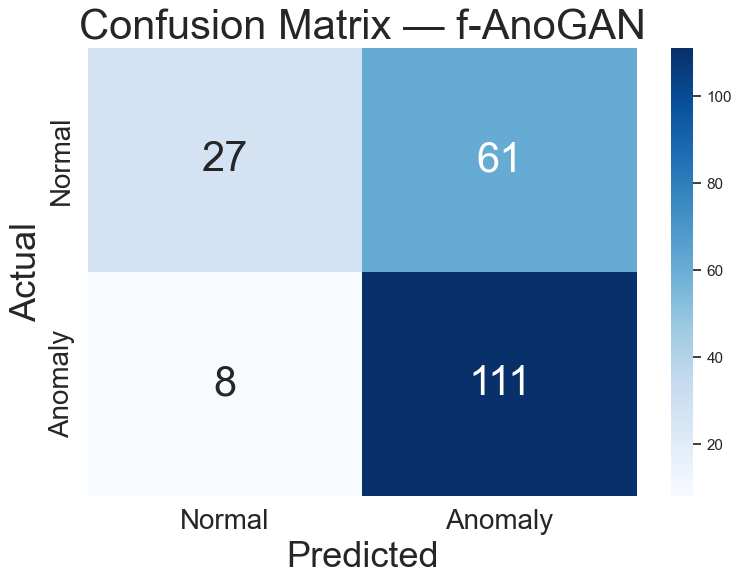

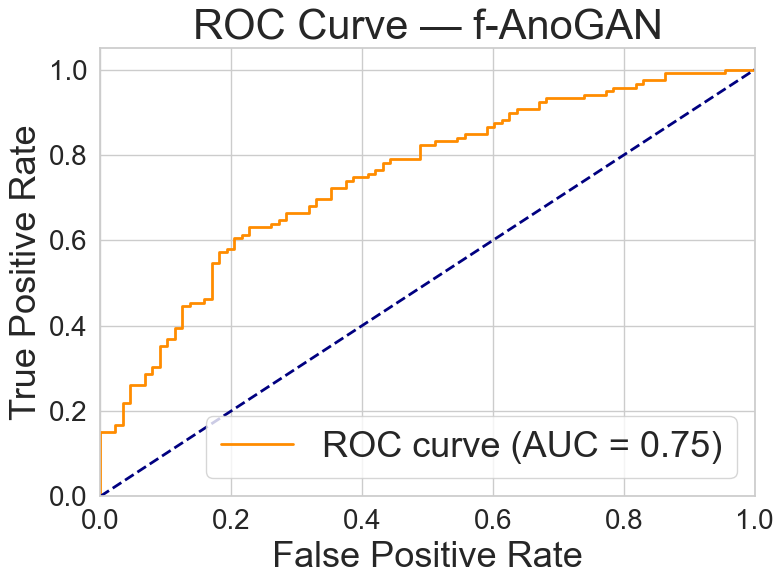

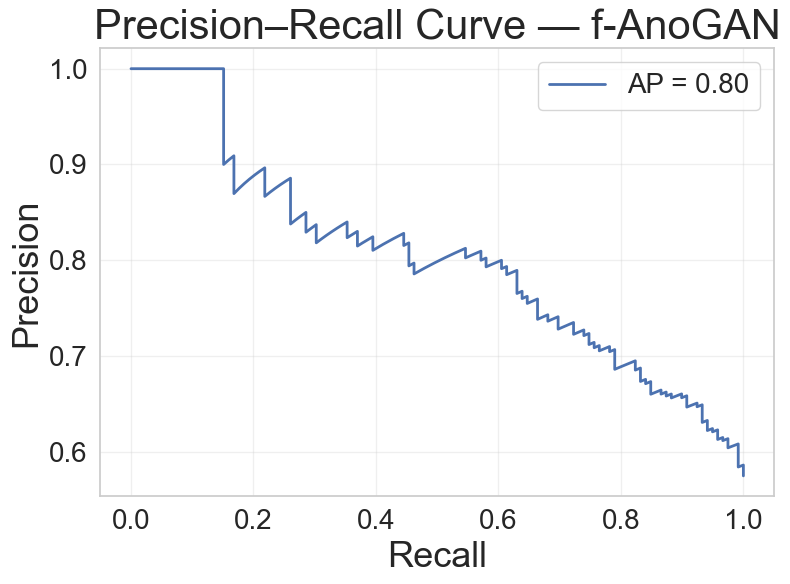

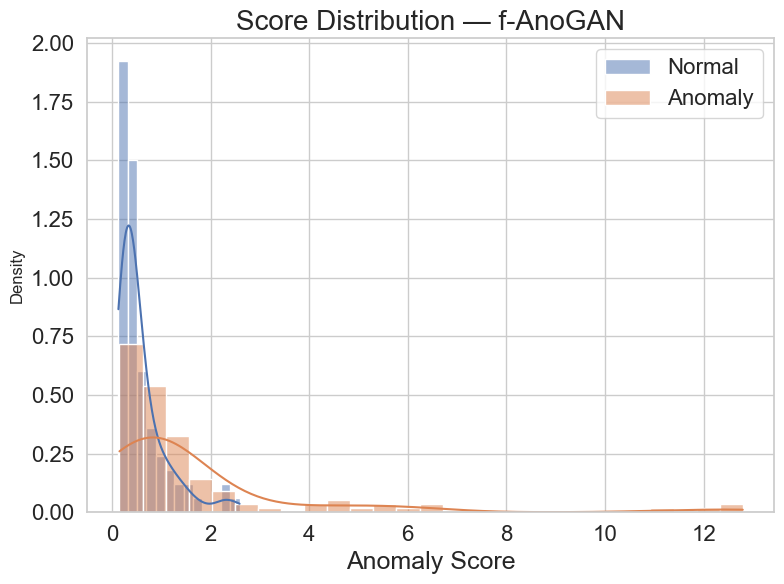

In [57]:
# Predict on Test set using f-AnoGAN and evaluate performance metrics
print("\n--- fAno GAN (Test) ---")
fANOGAN_pred, fANOGAN_scores = fanogan.predict(X_test)
precision, recall, f1, fin = evaluate_model(y_test, fANOGAN_pred, y_score=fANOGAN_scores, model_name="f-AnoGAN", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="f-AnoGAN", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)


### 2D Latent Space Projections with fANO-GAN Predictions

We visualize the fANO-GAN's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


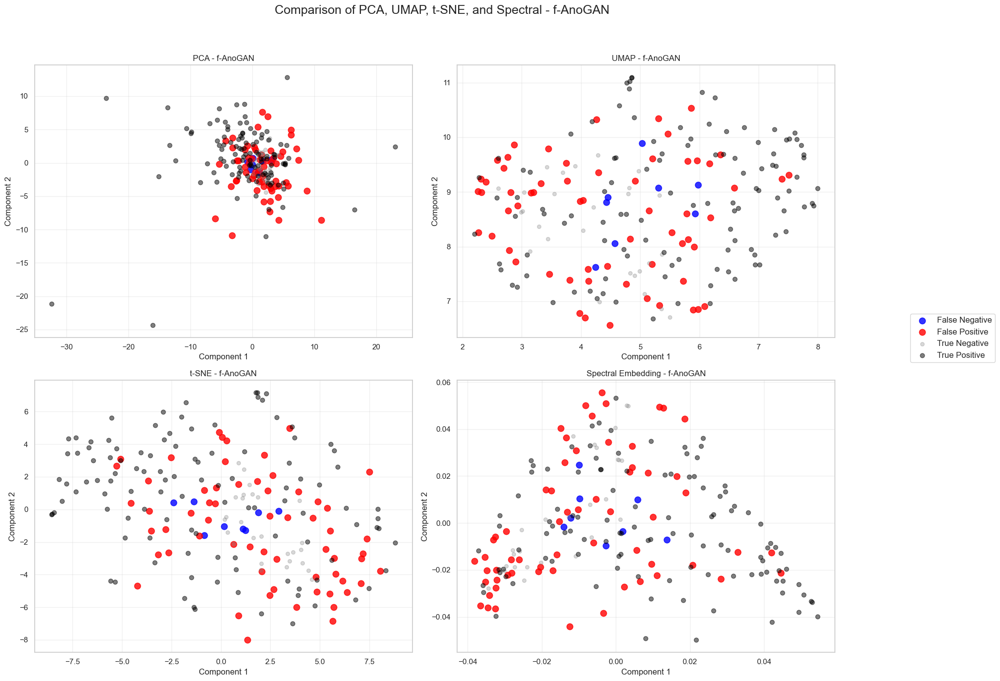

In [58]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, fANOGAN_pred, model_name="f-AnoGAN")

### 3D Visualization of fANO-GAN Predictions

To better understand how the fANO-GAN detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [59]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=fANOGAN_pred, model_name="f-AnoGAN", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=fANOGAN_pred, model_name="f-AnoGAN", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=fANOGAN_pred, model_name="f-AnoGAN", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=fANOGAN_pred, model_name="f-AnoGAN", num_components=3)

### Feature Importance for f-AnoGAN
The fanogan_feature_importance function evaluates which features most influence the reconstruction quality of an f-AnoGAN model. It does this by:

- Measuring the baseline reconstruction error.

- Masking each feature (setting it to 0) one at a time.

- Computing the increase in reconstruction error after masking.

- Ranking features by how much error increases, indicating their importance.

A higher score means the feature is more critical for the model to accurately reconstruct the input.

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2197267351.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


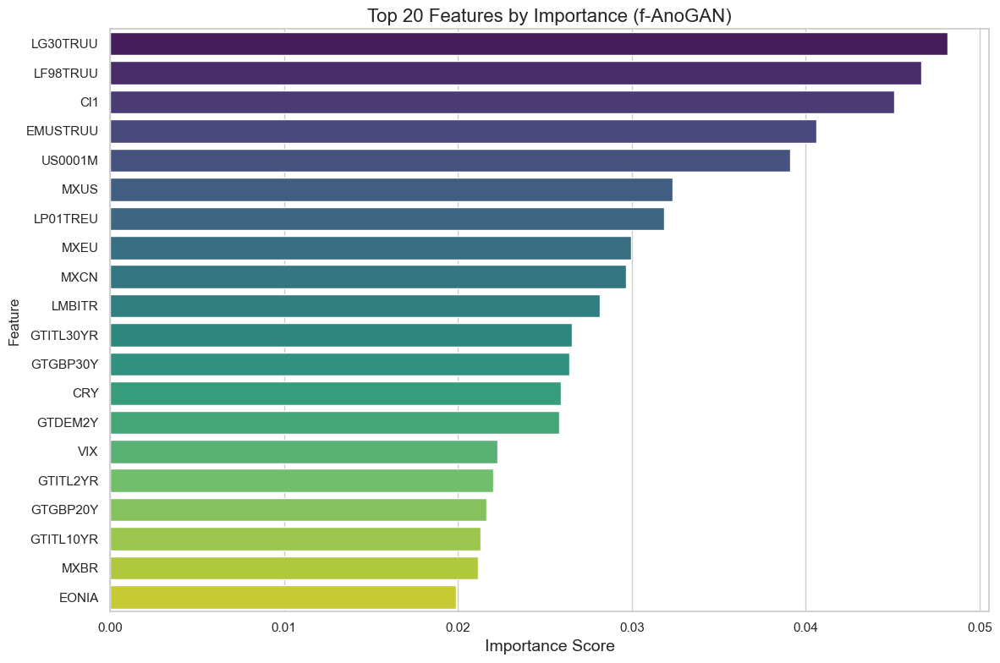

In [60]:
def fanogan_feature_importance(model, X, feature_names):
    """
    Feature importance for f-AnoGAN based on change in reconstruction error after masking each feature.
    """
    model.G.eval(); model.E.eval()
    X_tensor = torch.from_numpy(X).float().to(model.device)

    with torch.no_grad():
        z = model.E(X_tensor)
        rec = model.G(z)
        base_error = ((rec - X_tensor) ** 2).mean(dim=1).cpu().numpy()

    importances = []
    for i in range(X.shape[1]):
        X_perturbed = X_tensor.clone()
        X_perturbed[:, i] = 0.0
        with torch.no_grad():
            rec_p = model.G(model.E(X_perturbed))
            pert_error = ((rec_p - X_tensor) ** 2).mean(dim=1).cpu().numpy()
        delta = (pert_error - base_error).mean()
        importances.append(delta)

    df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    df = df.sort_values('Importance', ascending=False)

    # Plot
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (f-AnoGAN)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df

importance_fanogan_df = fanogan_feature_importance(
    model=fanogan,
    X=X_test,
    feature_names=stationary_df.columns
)



# 8. Long Short-Term Memory Networks (LSTM)

## LSTM for Anomaly Detection

A **Long Short-Term Memory (LSTM)** network is a type of **Recurrent Neural Network (RNN)** designed to model **sequential and time-dependent data**.

### Why LSTM?

Unlike basic RNNs, LSTMs can **retain long-term dependencies** using:
- **Memory cells** to store information.
- **Input**, **Forget**, and **Output gates** to control data flow.

This makes them especially useful for **time series** or any data where **temporal order matters**.

### How is an LSTM Used for Anomaly Detection?

There are two main strategies:

#### 1. **Prediction-Based**  
- Train the LSTM to **predict the next value** (or window) in a time series.  
- During inference, compute the **prediction error**.
- Large errors → **anomalies**.

#### 2. **Reconstruction-Based (Autoencoder)**  
- Use an **LSTM Autoencoder**:
  - The **encoder** compresses the sequence.
  - The **decoder** reconstructs it.
- Use the **reconstruction error** as an anomaly score.

> If a sequence is poorly reconstructed → it's likely **anomalous**.


### Training / Validation / Test Process

#### 1. **Training Phase** (Unsupervised)
- Train the LSTM (or LSTM Autoencoder) **only on normal sequences**.
- The model learns the temporal structure of normality.

#### 2. **Validation Phase** (Semi-supervised)
- Use a labeled validation set to:
  - Compute reconstruction/prediction errors.
  - Tune a **threshold** (e.g., using Optuna).
  - Optimize metrics like **F1**, **Recall**, or **AUROC**.

#### 3. **Test Phase** (Supervised Evaluation)
- Evaluate the model on the **test set**:
  - Use the tuned threshold to classify sequences.
  - Compute evaluation metrics:
    - Precision, Recall, F1
    - Confusion Matrix
    - ROC Curve, AUC

### Further Reading

- [Understanding LSTM Networks](https://colah.github.io/posts/2015-08-Understanding-LSTMs/)
- [Time Series Anomaly Detection Using LSTM Autoencoders](https://towardsdatascience.com/time-series-anomaly-detection-using-lstm-autoencoder-9f40cddc9e2e)

> LSTMs are well-suited for anomaly detection when the data has **strong temporal dependencies**. They’re widely used in finance, energy, network security, and industrial IoT.




### Do Not Shuffle Time Series for LSTM Models

When working with **time series data** — especially in financial applications — it's critical to **preserve the temporal order**.

LSTMs are designed to learn from **sequential dependencies**, so shuffling the data would:

- Break temporal relationships between observations
- Prevent the model from learning time-based patterns
- Lead to misleading training and evaluation results

Always split your dataset **chronologically**:
- **Training**: earlier time periods
- **Validation/Test**: later time periods

Use **rolling windows** or **sliding sequences** to construct input samples while keeping the original order intact.

Let's rebuild the standartized dataset avoiding reshuffling.


In [61]:
# Data Preparation

# Convert to numpy arrays
X = stationary_df.values
y = y_stationary

# Masks
normal_mask = (y == 0)
anomaly_mask = (y == 1)

X_normal_timeseries = X[normal_mask]
X_anomaly_timeseries = X[anomaly_mask]

# Sizes
n_normal = len(X_normal_timeseries)
n_anomaly = len(X_anomaly_timeseries)

# Chronological splits
train_size = int(0.8 * n_normal)
cv_normal_size = int(0.1 * n_normal)

# Splits
X_train_timeseries = X_normal_timeseries[:train_size]
X_cv_normal = X_normal_timeseries[train_size:train_size + cv_normal_size]
X_cv_anomaly = X_anomaly_timeseries[:int(0.5 * n_anomaly)]
X_test_normal = X_normal_timeseries[train_size + cv_normal_size:]
X_test_anomaly = X_anomaly_timeseries[int(0.5 * n_anomaly):]

# Labels
y_cross_val_timeseries = np.hstack([np.zeros(len(X_cv_normal)), np.ones(len(X_cv_anomaly))])
y_test_timeseries = np.hstack([np.zeros(len(X_test_normal)), np.ones(len(X_test_anomaly))])

# Stack sets
X_cross_val_timeseries = np.vstack([X_cv_normal, X_cv_anomaly])
X_test_timeseries = np.vstack([X_test_normal, X_test_anomaly])

# Standardize
scaler = StandardScaler()
X_train_timeseries = scaler.fit_transform(X_train_timeseries)
X_cross_val_timeseries = scaler.transform(X_cross_val_timeseries)
X_test_timeseries = scaler.transform(X_test_timeseries)

# Full dataset for sequence generation
X_full = np.vstack([X_train_timeseries, X_cross_val_timeseries, X_test_timeseries])
y_full = np.hstack([
    np.zeros(len(X_train_timeseries)),
    y_cross_val_timeseries,
    y_test_timeseries
])

print(f"Training set size: {X_train_timeseries.shape[0]} (all normal)")
print(f"Cross-validation set size: {X_cross_val_timeseries.shape[0]} ({len(X_cv_normal)} normal, {len(X_cv_anomaly)} anomalies)")
print(f"Test set size: {X_test_timeseries.shape[0]} ({len(X_test_normal)} normal, {len(X_test_anomaly)} anomalies)")


# Sequence Creator for LSTM
def create_sequences(X, y, seq_length=30):
    sequences = []
    seq_labels = []
    for i in range(len(X) - seq_length + 1):
        seq = X[i : i + seq_length]
        label = y[i + seq_length - 1] if y is not None else 0
        sequences.append(seq)
        seq_labels.append(label)
    return np.stack(sequences), np.array(seq_labels)

Training set size: 698 (all normal)
Cross-validation set size: 205 (87 normal, 118 anomalies)
Test set size: 207 (88 normal, 119 anomalies)


## 8.1 Unidirectional and Stateless LSTM Autoencoder for Anomaly Detection

This model uses a **unidirectional, stateless LSTM autoencoder** to detect anomalies in sequential data, such as financial time series.

### Architecture:
- **Encoder**: An LSTM processes the input sequence and encodes it into a fixed-length latent vector using the **last hidden state**.
- **Decoder**: Another LSTM reconstructs the sequence from the latent vector, repeated across time steps.
- **Output**: A linear layer maps the decoded hidden states back to the original feature space.

### Key Features:
- **Reconstruction-based** anomaly detection: anomalies are detected when reconstruction error exceeds a threshold.
- **Stateless**: Hidden states are reset between batches; suitable for independent windows of data.
- **Unidirectional**: Only past information is used, which matches the causality constraints in time series data.

### Training and Evaluation:
- The model is trained using only normal data (unsupervised).
- A percentile-based threshold is computed from validation errors to classify anomalies.
- Optuna is used to tune hyperparameters such as sequence length, LSTM hidden dimensions, number of layers, learning rate, and batch size.


In [62]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import optuna
from optuna.exceptions import TrialPruned
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score


# LSTM Autoencoder
class LSTMAutoencoder(nn.Module):
    def __init__(self, n_features, hidden_dim, num_layers):
        super().__init__()
        self.encoder = nn.LSTM(n_features, hidden_dim, num_layers, batch_first=True)
        self.decoder = nn.LSTM(hidden_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, n_features)

    def forward(self, x):
        _, (h_n, _) = self.encoder(x)
        h = h_n[-1]
        dec_input = h.unsqueeze(1).repeat(1, x.size(1), 1)
        dec_out, _ = self.decoder(dec_input)
        return self.fc(dec_out)

    @torch.no_grad()
    def reconstruct_full(self, X_full, seq_len, device):
        self.eval()
        T, F = X_full.shape
        windows, idxs = [], []
        for start in range(T - seq_len + 1):
            windows.append(X_full[start:start+seq_len])
            idxs.append(np.arange(start, start+seq_len))
        windows = np.stack(windows)
        recon_acc = np.zeros((T, F), dtype=float)
        hit_count = np.zeros(T, dtype=float)
        for w, inds in zip(windows, idxs):
            w_t = torch.from_numpy(w).unsqueeze(0).float().to(device)
            w_rec = self(w_t).cpu().numpy().squeeze(0)
            recon_acc[inds] += w_rec
            hit_count[inds] += 1
        recon_full = recon_acc / hit_count[:, None]
        err_per_t = ((X_full - recon_full) ** 2).mean(axis=1)
        return recon_full, err_per_t




### Optuna Hyperparameter Optimization for LSTM Autoencoder

This module defines an `objective` function and runs an Optuna study to optimize 
the hyperparameters of a stateless LSTM Autoencoder for anomaly detection in time series data.

### Function: `objective(trial)`

Trains an LSTM autoencoder using trial-suggested hyperparameters and evaluates performance 
on a validation set using the F1 score.

#### Tuned Hyperparameters:
- `seq_len`: Input sequence/window length
- `hidden_dim`: Number of units in the LSTM hidden layer
- `num_layers`: Number of LSTM layers
- `lr`: Learning rate (log-uniform scale)
- `batch_size`: Batch size for training


### Optimization Details

- **Training**: Only on normal data (unsupervised anomaly detection)
- **Evaluation**: 
  - Uses reconstruction error on validation sequences
  - Anomalies classified using 95th percentile threshold on validation error
- **Metric**: F1 score
- **Early stopping**: Stops training if no improvement after 5 epochs
- **Pruning**: Uses `MedianPruner` to prune underperforming trials early

### Study Configuration

```python
study = optuna.create_study(
    study_name='LSTM_AE_study',
    storage='sqlite:///optuna_LSTM_AE.db',
    load_if_exists=True,
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)


In [63]:
# Optuna Objective
def objective(trial):
    """ 
    Objective function for Optuna hyperparameter tuning.
    It trains an LSTM autoencoder and evaluates its performance on a validation set.
    """
    # Hyperparameters
    seq_len = trial.suggest_int('seq_len', 20, 50, step=5)
    hidden_dim = trial.suggest_int('hidden_dim', 32, 128, step=32)
    num_layers = trial.suggest_int('num_layers', 1, 3)
    lr = trial.suggest_loguniform('lr', 1e-4, 1e-2)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    epochs = 20
    patience = 5

    # Sequences
    X_seq, y_seq = create_sequences(X_full, y_full, seq_len)
    n = len(X_seq)
    train_end = int(0.8 * n)
    cv_end = int(0.9 * n)

    X_train = X_seq[:train_end]
    y_train = y_seq[:train_end]
    X_train = X_train[y_train == 0]  # Only normal

    X_cv = X_seq[train_end:cv_end]
    y_cv = y_seq[train_end:cv_end]

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train)), batch_size=batch_size, shuffle=True)
    cv_loader = DataLoader(TensorDataset(torch.FloatTensor(X_cv), torch.LongTensor(y_cv)), batch_size=batch_size, shuffle=False)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = LSTMAutoencoder(X_train.shape[2], hidden_dim, num_layers).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    best_loss = float('inf')
    no_improve_epochs = 0

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for batch in train_loader:
            seqs = batch[0].to(device)
            optimizer.zero_grad()
            out = model(seqs)
            loss = criterion(out, seqs)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * seqs.size(0)

        avg_loss = running_loss / len(train_loader.dataset)
        trial.report(avg_loss, epoch)
        if trial.should_prune():
            raise TrialPruned()

        if avg_loss < best_loss:
            best_loss = avg_loss
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1
            if no_improve_epochs >= patience:
                break

    # Validation
    model.eval()
    errors, labels = [], []
    with torch.no_grad():
        for seqs, labs in cv_loader:
            seqs = seqs.to(device)
            out = model(seqs)
            batch_err = ((out - seqs)**2).mean(dim=(1, 2)).cpu().numpy()
            errors.extend(batch_err)
            labels.extend(labs.numpy())

    errors = np.array(errors)
    labels = np.array(labels)
    thresh = np.percentile(errors[labels == 0], 95)
    preds = (errors > thresh).astype(int)
    f1 = f1_score(labels, preds, zero_division=0)

    trial.report(f1, epoch)
    if trial.should_prune():
        raise TrialPruned()
    return f1


# Optuna Study
study = optuna.create_study(
    study_name='LSTM_AE_study',
    storage='sqlite:///optuna_LSTM_AE.db',
    load_if_exists=True,
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)

print('Starting hyperparameter optimization...')
study.optimize(objective, n_trials=5, show_progress_bar=True)
print('Optimization completed.')
print('Best params:', study.best_params)
print('Best CV F1:', study.best_value)


[I 2025-05-14 15:18:06,335] Using an existing study with name 'LSTM_AE_study' instead of creating a new one.


Starting hyperparameter optimization...


  0%|          | 0/5 [00:00<?, ?it/s]

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\3839359682.py:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform('lr', 1e-4, 1e-2)


[I 2025-05-14 15:18:07,134] Trial 970 pruned. 
[I 2025-05-14 15:18:07,342] Trial 971 pruned. 
[I 2025-05-14 15:18:07,506] Trial 972 pruned. 
[I 2025-05-14 15:18:07,718] Trial 973 pruned. 
[I 2025-05-14 15:18:07,912] Trial 974 pruned. 
Optimization completed.
Best params: {'seq_len': 50, 'hidden_dim': 128, 'num_layers': 1, 'lr': 0.008236481955379753, 'batch_size': 64}
Best CV F1: 0.42857142857142855


### Final Training and Evaluation of LSTM Autoencoder

This section retrains the best LSTM autoencoder model found via Optuna and evaluates its performance on the test set.

### Steps

1. **Retrieve Best Hyperparameters**  
   - Extracts the best parameters from the Optuna study (e.g., `seq_len`, `hidden_dim`, `lr`, etc.).

2. **Prepare Training Sequences**  
   - Creates sliding-window sequences from the full normal training set.

3. **Train Final Model**  
   - Initializes a fresh model and trains it for 30 epochs on all normal sequences using MSE loss.

4. **Reconstruct and Score**  
   - Applies the trained model to reconstruct both training and test sets.
   - Computes per-timestep reconstruction error.

5. **Thresholding**  
   - Defines an anomaly threshold as the 95th percentile of training reconstruction error.
   - Flags test anomalies where reconstruction error exceeds the threshold.


### Output
- `y_pred_LSTM`: binary predictions for anomalies on the test set
- `test_err`: raw reconstruction error scores for ROC/AUC or precision-recall analysis



In [64]:
# Retrain the final model

# Step 1: Use Best Parameters from Optuna
best_params = study.best_params
seq_len = best_params['seq_len']
hidden_dim = best_params['hidden_dim']
num_layers = best_params['num_layers']
lr = best_params['lr']
batch_size = best_params['batch_size']
epochs = 30  # increase slightly for final training

# Step 2: Build sequences from full normal training data
X_final_train_seq, _ = create_sequences(X_train_timeseries, None, seq_len)
train_loader = DataLoader(
    TensorDataset(torch.FloatTensor(X_final_train_seq)),
    batch_size=batch_size,
    shuffle=True
)

# Step 3: Instantiate model and train
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMAutoencoder(X_final_train_seq.shape[2], hidden_dim, num_layers).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

print("Training final model...")
model.train()
for epoch in range(epochs):
    running_loss = 0.0
    for batch in train_loader:
        seqs = batch[0].to(device)
        optimizer.zero_grad()
        out = model(seqs)
        loss = criterion(out, seqs)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * seqs.size(0)
    avg_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.6f}")

# Step 4: Compute reconstruction error on test set
recon_test, test_err = model.reconstruct_full(X_test_timeseries, seq_len, device)

# Step 5: Compute threshold from training reconstruction error
recon_train, train_err = model.reconstruct_full(X_train_timeseries, seq_len, device)
threshold = np.percentile(train_err, 95)

# Step 6: Predict anomalies on test set
y_pred_LSTM = (test_err > threshold).astype(int)



Training final model...
Epoch 1/30 - Loss: 0.988932
Epoch 2/30 - Loss: 0.980645
Epoch 3/30 - Loss: 0.975834
Epoch 4/30 - Loss: 0.972159
Epoch 5/30 - Loss: 0.969434
Epoch 6/30 - Loss: 0.967934
Epoch 7/30 - Loss: 0.967169
Epoch 8/30 - Loss: 0.966519
Epoch 9/30 - Loss: 0.965621
Epoch 10/30 - Loss: 0.963121
Epoch 11/30 - Loss: 0.965803
Epoch 12/30 - Loss: 0.963791
Epoch 13/30 - Loss: 0.960378
Epoch 14/30 - Loss: 0.957230
Epoch 15/30 - Loss: 0.948253
Epoch 16/30 - Loss: 0.948369
Epoch 17/30 - Loss: 0.943786
Epoch 18/30 - Loss: 0.945711
Epoch 19/30 - Loss: 0.942093
Epoch 20/30 - Loss: 0.938663
Epoch 21/30 - Loss: 0.933341
Epoch 22/30 - Loss: 0.937776
Epoch 23/30 - Loss: 0.931213
Epoch 24/30 - Loss: 0.925983
Epoch 25/30 - Loss: 0.919326
Epoch 26/30 - Loss: 0.927974
Epoch 27/30 - Loss: 0.929379
Epoch 28/30 - Loss: 0.922104
Epoch 29/30 - Loss: 0.918476
Epoch 30/30 - Loss: 0.916815


### Evaluate LSTM Autoencoder Performance

This step evaluates the final LSTM autoencoder on the test set using classification metrics and visualizations.


--- LSTM Autoencoder (Test) ---

LSTM Autoencoder Performance:
Precision: 0.9697
Recall:    0.2689
F1 Score:  0.4211
Financial Score: 0.3696


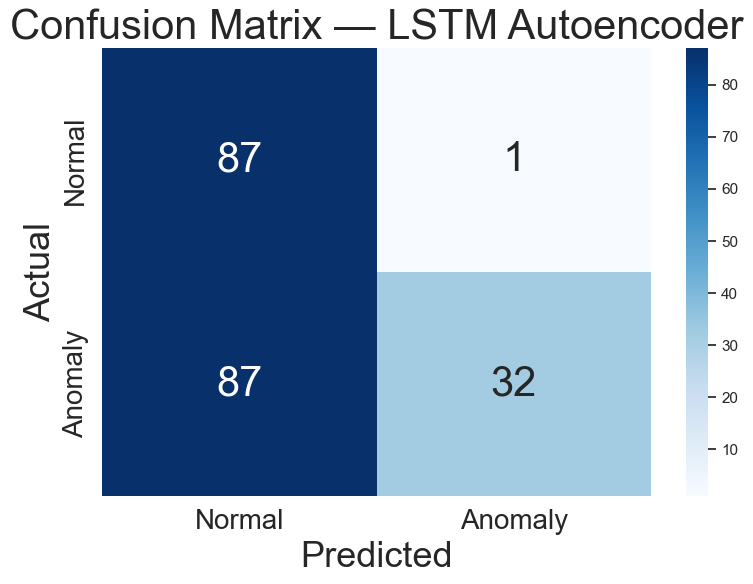

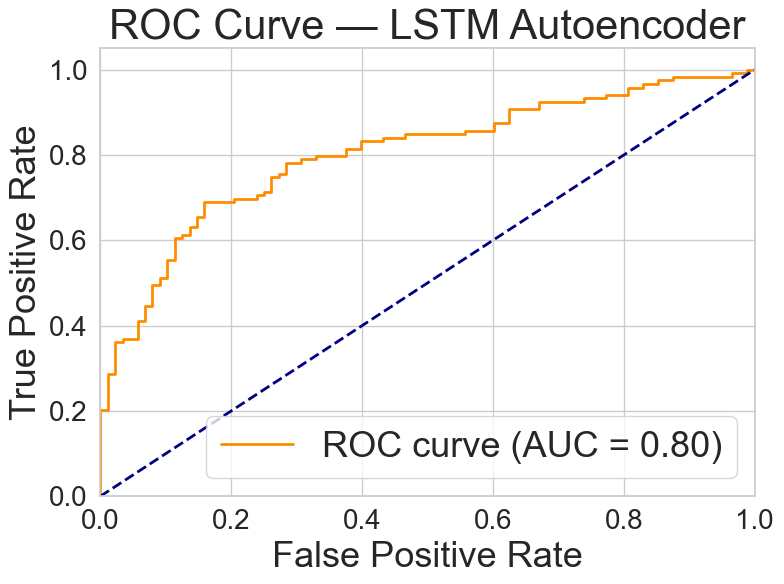

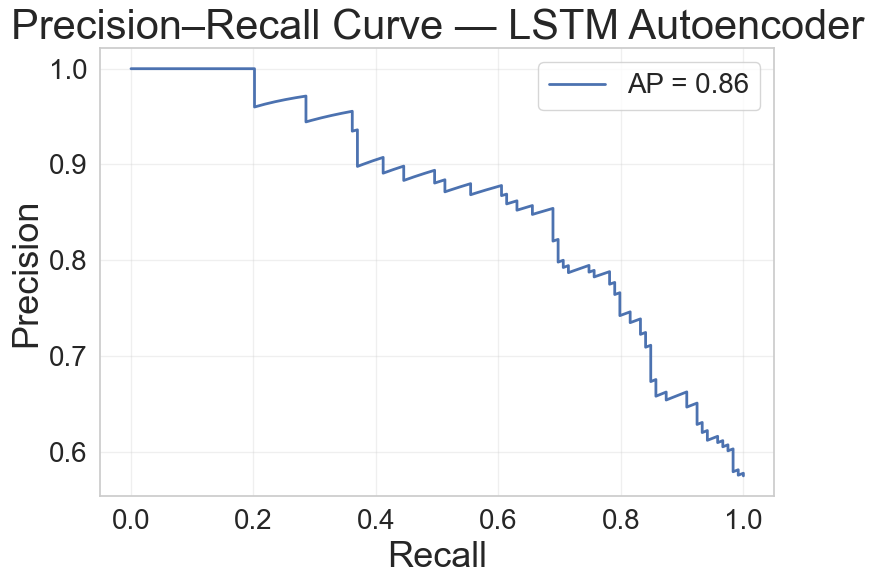

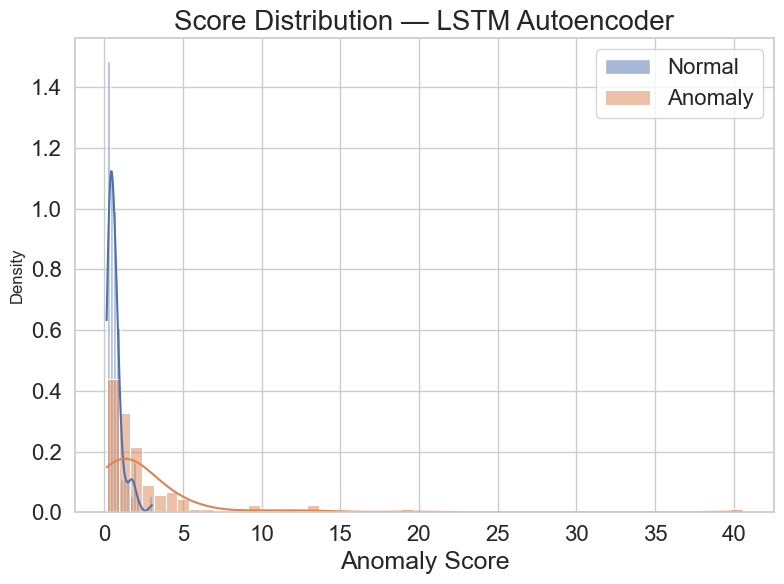

In [65]:
# # Step 7: Print classification report
# from sklearn.metrics import classification_report, confusion_matrix
# print("\nConfusion Matrix:")
# print(confusion_matrix(y_true, y_pred))
# print("\nClassification Report:")
# print(classification_report(y_true, y_pred, digits=3))

# Evaluate performance metrics
print("\n--- LSTM Autoencoder (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test_timeseries, y_pred=y_pred_LSTM, y_score=test_err, model_name="LSTM Autoencoder", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="LSTM Autoencoder", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)



### 2D Latent Space Projections with LSTM Predictions

We visualize the LSTM's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


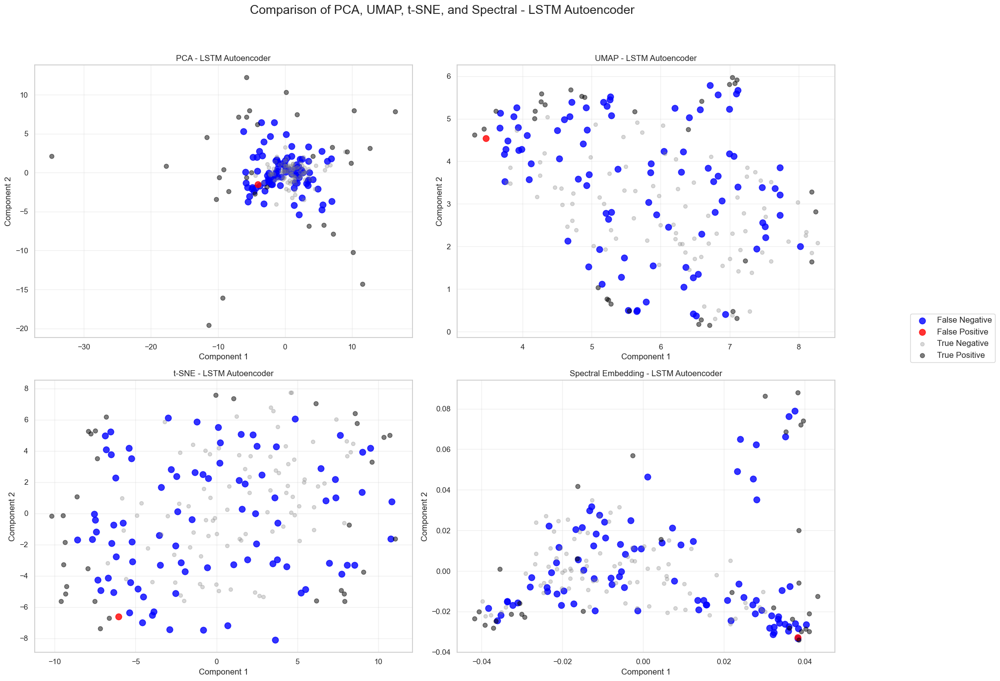

In [66]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test_timeseries, y_test_timeseries, y_pred_LSTM, model_name="LSTM Autoencoder")

### 3D Visualization of LSTM Predictions

To better understand how the LSTM detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.


In [67]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="f-AnoGAN", num_components=3)
    visualize_umap(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="f-AnoGAN", num_components=3)
    visualize_tsne(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="f-AnoGAN", num_components=3)
    visualize_spectral(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="f-AnoGAN", num_components=3)

## LSTM Autoencoder Feature Importance

This function estimates **global feature importance** for an LSTM autoencoder by measuring the change in reconstruction error when each input feature is masked (set to zero) across all timesteps.

#### **Inputs**:
- `model`: Trained LSTM autoencoder
- `X_full`: 2D array (T, n_features), the full input time series (e.g. test set)
- `seq_len`: Length of the sliding input window used during training
- `feature_names`: List of feature names for labeling the output

#### **Logic**:
- For each feature:
  - Mask that feature (set to zero across all timesteps)
  - Recompute the reconstruction error
  - Compare it to the baseline error
- The larger the increase in error, the more important the feature

#### **Output**:
- A `DataFrame` sorted by feature importance
- A bar plot of the top 20 features by importance score

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\3476069499.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


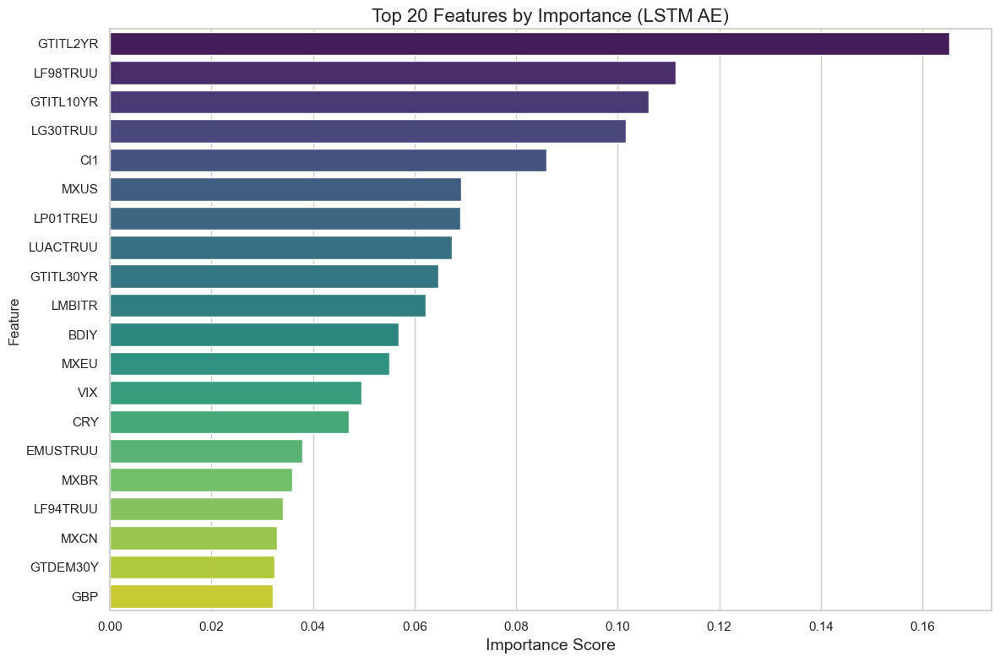

In [68]:
def lstm_feature_importance(model, X_full, seq_len, feature_names):
    """
    Feature importance for LSTM Autoencoder by measuring change in reconstruction error
    when each feature is masked (set to 0) across all timesteps.
    
    Parameters:
    - model: trained LSTM autoencoder
    - X_full: 2D array (T, n_features), full test or validation set
    - seq_len: sequence length used during training
    - feature_names: list of feature names

    Returns:
    - DataFrame with feature importance scores
    """
    model.eval()
    device = next(model.parameters()).device

    # Baseline error
    _, base_err = model.reconstruct_full(X_full, seq_len, device)
    base_err_mean = base_err.mean()

    importances = []
    for i in range(X_full.shape[1]):
        X_perturbed = X_full.copy()
        X_perturbed[:, i] = 0.0  # Mask feature i across all time
        _, pert_err = model.reconstruct_full(X_perturbed, seq_len, device)
        pert_err_mean = pert_err.mean()
        importances.append(base_err_mean - pert_err_mean)

    # Build DataFrame
    df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # Plot top features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (LSTM AE)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df

importance_LSTM_aut_df = lstm_feature_importance(
    model=model,
    X_full=X_test_timeseries,
    seq_len=seq_len,
    feature_names=stationary_df.columns
)


## 8.2 Prediction-Based LSTM for Anomaly Detection

In this approach, we train an LSTM to predict the next timestep and use the one-step-ahead prediction error as our anomaly score.


### 8.2.1 Model definition

We define an LSTM that consumes a sequence of past `seq_len` time-steps and predicts the next time-step for all features.


In [69]:

# 8.2.1 Prediction‐based LSTM class (fix __init__)
class LSTMPredictor(nn.Module):
    def __init__(self, n_features, hidden_dim, num_layers):
        super().__init__()   # super().__init__(), not super()._init_()
        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=0.2      # optional regularization
        )
        self.fc = nn.Linear(hidden_dim, n_features)

    def forward(self, x):
        # x.shape = [batch, seq_len, n_features]
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])  # predict next timestep





### 8.2.2 Sequence Generation

We slide a window of length `seq_len` over the data to form `(X, y)` pairs:
- **X**: last `seq_len` timesteps  
- **y**: the very next timestep  
Only windows whose target `y` is “normal” (label 0) are used for training.


In [70]:
# Create prediction sequences: X(t:t+seq_len) -> y(t+seq_len)

def create_pred_sequences(data, labels, seq_len):
    """
    data:  (T, n_features) numpy array of features
    labels: (T,) numpy array of 0/1 anomaly labels
    seq_len: window length
    Returns:
      X_seq: shape (T - seq_len, seq_len, n_features)
      y_seq: shape (T - seq_len,)  of true labels at t+seq_len
    """
    X, y = [], []
    for i in range(len(data) - seq_len):
        X.append(data[i : i + seq_len])
        y.append(labels[i + seq_len])
    return np.stack(X), np.array(y)



### 8.2.3 Optuna Hyperparameter Tuning

We tune:
- `seq_len` (window size)  
- `hidden_dim`, `num_layers`  
- `lr`, `batch_size`  

We prune trials based on training loss and final validation F1.


In [71]:
def objective(trial):
    # ── 1) Hyperparameters ─────────────────────────────────────
    seq_len    = trial.suggest_int('seq_len',    20, 50, step=5)
    hidden_dim = trial.suggest_int('hidden_dim', 32, 128, step=32)
    num_layers = trial.suggest_int('num_layers', 1, 3)
    lr = trial.suggest_float('lr', 1e-4, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    epochs, patience = 20, 5

    # ── 2) Generate sequences + true labels ────────────────────
    X_seq, y_seq = create_pred_sequences(X_full, y_full, seq_len)  # y_seq is 0/1 now
    n_windows    = len(y_seq)
    # If there are no normals or no anomalies at all → give zero score
    if y_seq.sum() == 0 or y_seq.sum() == n_windows:
        return 0.0

    # ── 3) Chronological split ─────────────────────────────────
    train_end = int(0.8 * n_windows)
    cv_end    = int(0.9 * n_windows)

    # TRAIN: only normal windows
    train_mask = (y_seq[:train_end] == 0)
    if train_mask.sum() == 0:
        return 0.0
    X_train = X_seq[:train_end][train_mask]

    # CV: keep both classes
    X_cv, y_cv = X_seq[train_end:cv_end], y_seq[train_end:cv_end]

    # ── 4) DataLoaders ─────────────────────────────────────────
    train_loader = DataLoader(
        TensorDataset(torch.FloatTensor(X_train)),
        batch_size=batch_size, shuffle=True
    )
    cv_loader = DataLoader(
        TensorDataset(torch.FloatTensor(X_cv), torch.LongTensor(y_cv)),
        batch_size=batch_size, shuffle=False
    )

    # ── 5) Model / Optimizer / Loss ───────────────────────────
    model     = LSTMPredictor(X_train.shape[2], hidden_dim, num_layers).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    # ── 6) Training + pruning ──────────────────────────────────
    best_loss, no_improve = float('inf'), 0
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for (seqs,) in train_loader:
            seqs = seqs.to(device)
            optimizer.zero_grad()
            preds  = model(seqs)
            target = seqs[:, -1, :]
            loss   = criterion(preds, target)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * seqs.size(0)
        avg_loss = running_loss / len(train_loader.dataset)

        trial.report(avg_loss, epoch)
        if trial.should_prune():
            raise TrialPruned()
        if avg_loss < best_loss:
            best_loss, no_improve = avg_loss, 0
        else:
            no_improve += 1
            if no_improve >= patience:
                break

    # ── 7) Validation: compute MSE → threshold → F1 ────────────
    model.eval()
    errors = []
    with torch.no_grad():
        for seqs, labs in cv_loader:
            seqs = seqs.to(device)
            preds = model(seqs)
            err   = ((preds - seqs[:, -1, :])**2).mean(dim=1).cpu().numpy()
            errors.extend(err)
    errors = np.array(errors)
    thresh = np.percentile(errors[y_cv == 0], 95)
    y_pred = (errors > thresh).astype(int)
    f1     = f1_score(y_cv, y_pred, zero_division=0)

    trial.report(f1, epochs)
    if trial.should_prune():
        raise TrialPruned()

    return f1



### 8.2.4 Run the Optuna Study

We’ll store our results in a new SQLite database so autoencoder and predictor studies remain separate.


In [72]:
study = optuna.create_study(
    study_name='LSTM_Predictor_Study',
    storage='sqlite:///optuna_LSTM_Predictor.db',
    load_if_exists=True,
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)
study.optimize(objective, n_trials=5)
print("Best Params:", study.best_params)
print("Best CV F1:", study.best_value)


[I 2025-05-14 15:18:16,306] Using an existing study with name 'LSTM_Predictor_Study' instead of creating a new one.
[I 2025-05-14 15:18:16,998] Trial 677 pruned. 
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
[I 2025-05-14 15:18:17,118] Trial 678 pruned. 
[I 2025-05-14 15:18:17,217] Trial 679 pruned. 
[I 2025-05-14 15:18:17,327] Trial 680 pruned. 
[I 2025-05-14 15:18:17,436] Trial 681 pruned. 


Best Params: {'seq_len': 20, 'hidden_dim': 96, 'num_layers': 1, 'lr': 0.00011099949117398404, 'batch_size': 64}
Best CV F1: 0.8444444444444444


### 8.2.5 Final Training & Evaluation

1. Retrain on **all** normal windows with the best hyperparameters.  
2. Compute the 95th-percentile threshold on training errors.  
3. Evaluate on the test set, reporting Precision/Recall/F1/AUC.


In [73]:
best_params = study.best_params
print("Best Params dict:", best_params)
print("Available keys:", list(best_params.keys()))

Best Params dict: {'seq_len': 20, 'hidden_dim': 96, 'num_layers': 1, 'lr': 0.00011099949117398404, 'batch_size': 64}
Available keys: ['seq_len', 'hidden_dim', 'num_layers', 'lr', 'batch_size']


In [74]:
def create_feature_sequences(X, seq_len):
    """
    X: (T, n_features)
    Returns:
      X_seq: (T-seq_len, seq_len, n_features)
      y_feat: (T-seq_len, n_features) next-step feature vectors
    """
    Xs, Ys = [], []
    for i in range(len(X) - seq_len):
        Xs.append(X[i : i + seq_len])
        Ys.append(X[i + seq_len])
    return np.stack(Xs), np.stack(Ys)


def create_label_sequences(y, seq_len):
    """
    y: (T,) 0/1 anomaly labels
    Returns:
      y_seq: (T-seq_len,) the true label at t+seq_len
    """
    return np.array([y[i + seq_len] for i in range(len(y) - seq_len)])

Training final model…
Epoch 1/30 — Loss: 0.995060
Epoch 2/30 — Loss: 0.993076
Epoch 3/30 — Loss: 0.991420
Epoch 4/30 — Loss: 0.989826
Epoch 5/30 — Loss: 0.988262
Epoch 6/30 — Loss: 0.986698
Epoch 7/30 — Loss: 0.985246
Epoch 8/30 — Loss: 0.983765
Epoch 9/30 — Loss: 0.982306
Epoch 10/30 — Loss: 0.980887
Epoch 11/30 — Loss: 0.979438
Epoch 12/30 — Loss: 0.978008
Epoch 13/30 — Loss: 0.976578
Epoch 14/30 — Loss: 0.975121
Epoch 15/30 — Loss: 0.973664
Epoch 16/30 — Loss: 0.972186
Epoch 17/30 — Loss: 0.970659
Epoch 18/30 — Loss: 0.969142
Epoch 19/30 — Loss: 0.967589
Epoch 20/30 — Loss: 0.965969
Epoch 21/30 — Loss: 0.964329
Epoch 22/30 — Loss: 0.962648
Epoch 23/30 — Loss: 0.960860
Epoch 24/30 — Loss: 0.959071
Epoch 25/30 — Loss: 0.957158
Epoch 26/30 — Loss: 0.955203
Epoch 27/30 — Loss: 0.953106
Epoch 28/30 — Loss: 0.951042
Epoch 29/30 — Loss: 0.948856
Epoch 30/30 — Loss: 0.946711

--- Prediction-Based LSTM (Test) ---

LSTM Predictor Performance:
Precision: 0.9200
Recall:    0.3866
F1 Score:  0.5

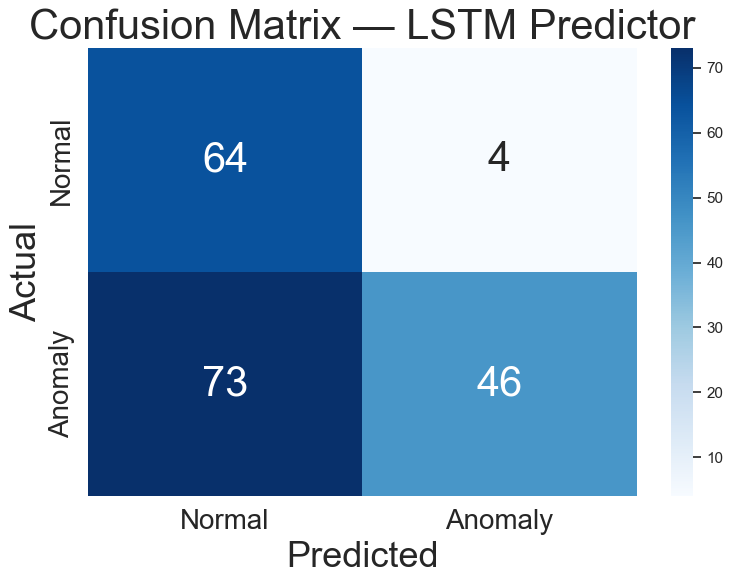

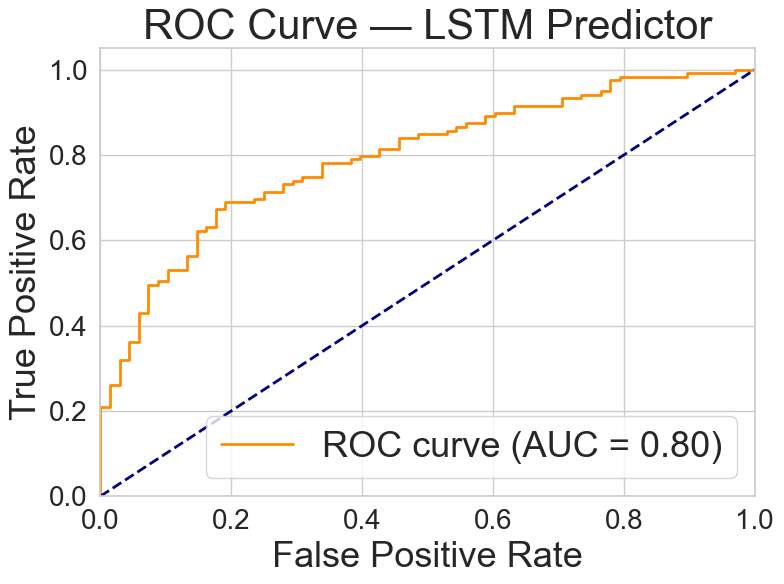

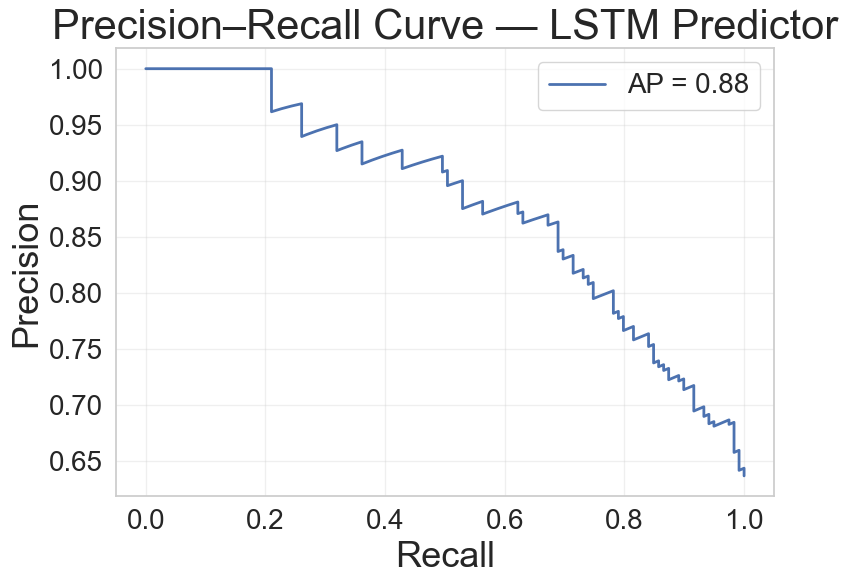

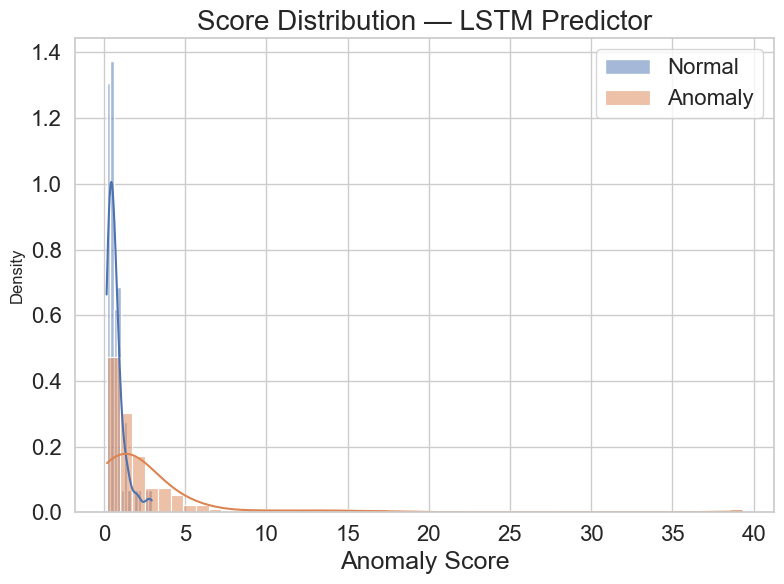

In [75]:
# 5) Final training & test evaluation

# Unpack best params
best = study.best_trial.params
seq_len, hidden_dim = best['seq_len'], best['hidden_dim']
num_layers, lr = best['num_layers'], best['lr']
batch_size = best['batch_size']
epochs = 30

# 5.1) Build feature‐based sequences for training
X_train_feat, y_train_feat = create_feature_sequences(X_train_timeseries, seq_len)

train_loader = DataLoader(
    TensorDataset(torch.FloatTensor(X_train_feat), torch.FloatTensor(y_train_feat)),
    batch_size=batch_size, shuffle=True
)

# 5.2) Instantiate model, optimizer, loss
model     = LSTMPredictor(X_train_feat.shape[2], hidden_dim, num_layers).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# 5.3) Train on next‐step prediction
print("Training final model…")
for epoch in range(epochs):
    model.train()
    total_loss = 0.0
    for seqs, targets in train_loader:
        seqs, targets = seqs.to(device), targets.to(device)
        optimizer.zero_grad()
        preds = model(seqs)
        loss = criterion(preds, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * seqs.size(0)
    print(f"Epoch {epoch+1}/{epochs} — Loss: {total_loss/len(train_loader.dataset):.6f}")

# 5.4) Build feature‐based sequences for test inference
X_test_feat, y_test_feat = create_feature_sequences(X_test_timeseries, seq_len)
test_loader = DataLoader(
    TensorDataset(torch.FloatTensor(X_test_feat), torch.FloatTensor(y_test_feat)),
    batch_size=batch_size, shuffle=False
)

# 5.5) Compute prediction errors on test set
errors = []
model.eval()
with torch.no_grad():
    for seqs, targets in test_loader:
        seqs, targets = seqs.to(device), targets.to(device)
        preds = model(seqs)
        # per‐window MSE
        err   = ((preds - targets)**2).mean(dim=1).cpu().numpy()
        errors.extend(err)
errors = np.array(errors)

# 5.6) Build label sequence for test‐time anomaly ground truth
y_true = create_label_sequences(y_test_timeseries, seq_len)  # shape matches errors

# 5.7) Threshold & final evaluation
threshold = np.percentile(errors[y_true == 0], 95)
y_pred    = (errors > threshold).astype(int)

print("\n--- Prediction-Based LSTM (Test) ---")
precision, recall, f1, fin = evaluate_model(
    y_true=y_true,
    y_pred=y_pred,
    y_score=errors,
    model_name="LSTM Predictor",
    mean_anomaly=mean_anomaly,
    mean_normal=mean_normal
)
results.append(
    dict(model="LSTM Predictor", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

**Thresholding & Evaluation**  
- We compute the 95th-percentile of validation MSE on normal windows.  
- On test data, windows with one-step MSE > threshold are flagged as anomalies.  


### 2D Latent Space Projections with LSTM Predictions

We visualize the LSTM's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


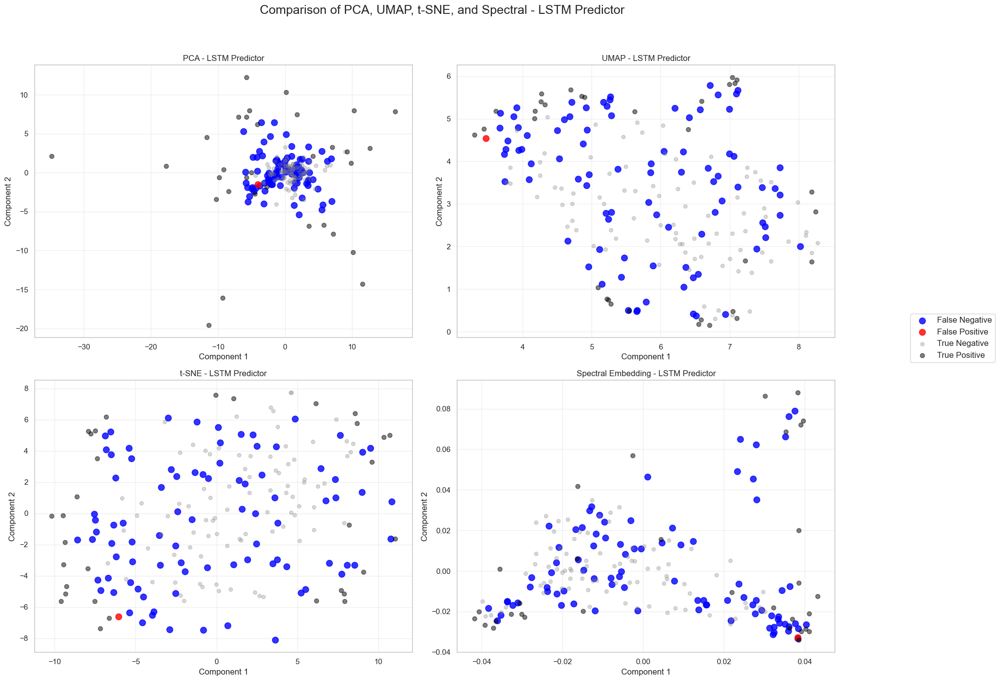

In [76]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test_timeseries, y_test_timeseries, y_pred_LSTM, model_name="LSTM Predictor")

### 3D Visualization of LSTM Predictions

To better understand how the LSTM detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.


In [77]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="LSTM Predictor", num_components=3)
    visualize_umap(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="LSTM Predictor", num_components=3)
    visualize_tsne(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="LSTM Predictor", num_components=3)
    visualize_spectral(X_test_timeseries, y_true=y_test_timeseries, y_pred=y_pred_LSTM, model_name="LSTM Predictor", num_components=3)

## LSTM Predictor Feature Importance

This function estimates **global feature importance** for an LSTM predictor by measuring the change in reconstruction error when each input feature is masked (set to zero) across all timesteps.

#### **Inputs**:
- `model`: Trained LSTM predictor
- `X_full`: 2D array (T, n_features), the full input time series (e.g. test set)
- `seq_len`: Length of the sliding input window used during training
- `feature_names`: List of feature names for labeling the output

#### **Logic**:
- For each feature:
  - Mask that feature (set to zero across all timesteps)
  - Recompute the reconstruction error
  - Compare it to the baseline error
- The larger the increase in error, the more important the feature

#### **Output**:
- A `DataFrame` sorted by feature importance
- A bar plot of the top 20 features by importance score

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\3191480532.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


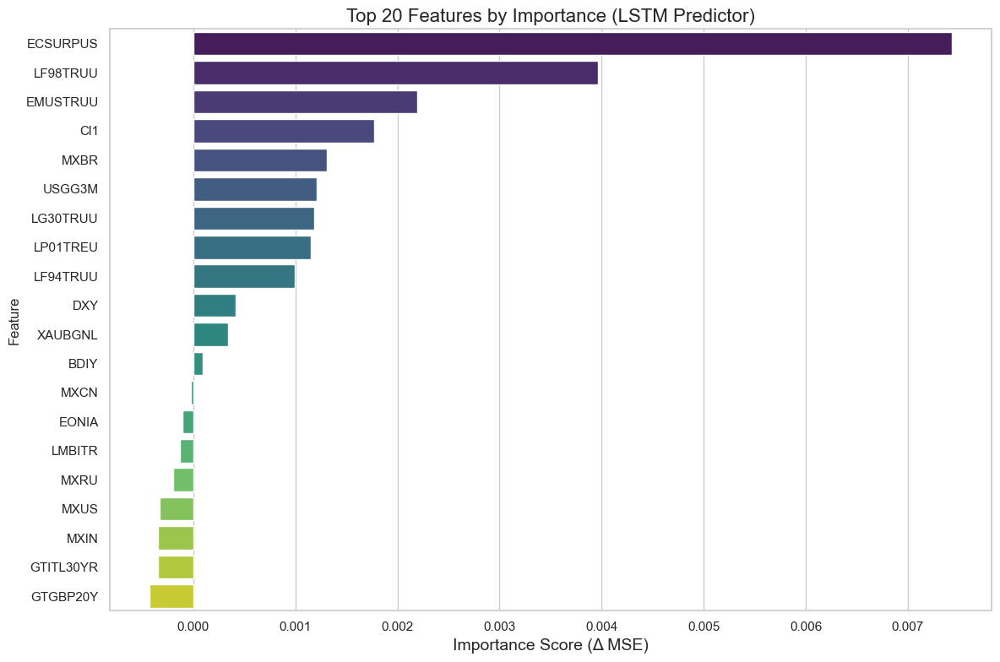

In [78]:
def lstm_predictor_feature_importance(model, X, seq_len, feature_names):
    """
    Feature importance for an LSTM predictor by measuring the change in one‐step
    forecast MSE when each feature is masked (set to 0) in the inputs, but
    still comparing against the original (unmasked) target.

    Importance = perturbed_MSE – baseline_MSE, so positive means error increased.
    """
    model.eval()
    device   = next(model.parameters()).device
    X_tensor = torch.from_numpy(X).float().to(device)
    mse_fn   = nn.MSELoss(reduction='none')

    # 1) Baseline one‐step errors
    base_errors = []
    with torch.no_grad():
        for t in range(seq_len, X_tensor.size(0)):
            window = X_tensor[t-seq_len:t].unsqueeze(0)  # (1, seq_len, n_feat)
            pred   = model(window).squeeze(0)            # (n_feat,)
            target = X_tensor[t]                         # true next‐step
            err    = mse_fn(pred, target).mean().item()
            base_errors.append(err)
    base_errors = np.array(base_errors)
    base_mean   = base_errors.mean()

    # 2) Mask each feature in the input and recompute errors
    importances = []
    for i in range(X_tensor.size(1)):
        X_masked = X_tensor.clone()
        X_masked[:, i] = 0.0

        pert_errors = []
        with torch.no_grad():
            for t in range(seq_len, X_masked.size(0)):
                window = X_masked[t-seq_len:t].unsqueeze(0)
                pred   = model(window).squeeze(0)
                target = X_tensor[t]  # still use original target
                err    = mse_fn(pred, target).mean().item()
                pert_errors.append(err)
        pert_mean = np.array(pert_errors).mean()

        # positive importance → error went up
        importances.append(pert_mean - base_mean)

    # 3) Build and sort DataFrame
    df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # 4) Plot top 20
    plt.figure(figsize=(12, 8))
    sns.barplot(
        x='Importance',
        y='Feature',
        data=df.head(20),
        palette='viridis'
    )
    plt.title('Top 20 Features by Importance (LSTM Predictor)', fontsize=16)
    plt.xlabel('Importance Score (Δ MSE)', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df

# ---------------------------------------------------------
# Usage:
importance_LSTM_pred_df = lstm_predictor_feature_importance(
    model=model,
    X=X_test_timeseries,
    seq_len=seq_len,
    feature_names=stationary_df.columns.tolist()
)


# 9. COPOD - Copula-based Outlier Detection

Copula-Based Outlier Detection (COPOD) is a statistical, unsupervised anomaly detection algorithm that uses copula theory to detect anomalies based on extreme tail behavior in multivariate distributions.

### Why COPOD?
Unlike deep learning models, COPOD is:

- Training-free and parameter-free

- Interpretable: based on probability theory

- Efficient: fast to compute, scales well to large datasets

It uses empirical copulas to detect whether a point lies in the extreme tail of the data distribution—an indication of anomaly.

### How is COPOD Used for Anomaly Detection?
COPOD estimates the outlier score of each sample by assessing:

1. Marginal Tail Probability
    - For each feature:

        - Compute how extreme a value is (left or right tail).

    - Take the maximum tail probability across all features.

2. Dependence Structure (Copula)
    - Models joint feature dependencies using empirical copulas.

    - Detects if a sample violates normal dependence patterns.

> The final outlier score is a combination of marginal and joint tail scores.

### Training / Validation / Test Process
1. Training Phase
- COPOD doesn’t require training.

- It simply fits the empirical distribution of the input data.

2. Validation Phase
- Use a labeled subset (optional) to:

    - Evaluate performance.

    - Compare thresholds (optional, but not required).

3. Test Phase
- Predict anomaly labels on new data:

    - Use .decision_scores_ for continuous scores.

    - Use .predict() for binary labels (1 = anomaly, 0 = normal).

- Evaluate with:

    - Precision, Recall, F1

    - Confusion Matrix

    - ROC Curve, AUC


### Further Reading

- [COPOD: Copula-Based Outlier Detection (arXiv)](https://arxiv.org/abs/2001.01565)  
  *Original paper introducing the method.*

- [PyOD Documentation – COPOD](https://pyod.readthedocs.io/en/latest/pyod.models.html#copod)  
  *Implementation and usage details in the PyOD library.*


> COPOD is a powerful choice when you want a fast, interpretable, unsupervised anomaly detector with no tuning required.


In [79]:
from pyod.models.copod import COPOD

# 1. Initialize the COPOD detector
#    You can optionally set `contamination` if you have an estimate of anomaly proportion.

# Calculate contamination from cross-validation set
raw_contamination = np.mean(y_cross_val)
print(f"\nEstimated contamination from cross-validation set: {raw_contamination:.4f}")

# Cap contamination for algorithms that have limits
contam = min(raw_contamination, 0.5)
print(f"Using capped contamination value: {contam:.4f}")
detector_COPOD = COPOD(contam)

# 2. Fit on the (scaled) training set (only normals)
detector_COPOD.fit(X_train)

# 3. Get predictions & scores on cross‐validation to tune threshold (if needed)
y_cv_scores_COPOD = detector_COPOD.decision_function(X_cross_val)
y_cv_pred_COPOD   = detector_COPOD.predict(X_cross_val)

print("CV Precision: ", precision_score(y_cross_val, y_cv_pred_COPOD))
print("CV Recall:    ", recall_score(y_cross_val, y_cv_pred_COPOD))
print("CV F1-score: ", f1_score(y_cross_val, y_cv_pred_COPOD))
print("CV Financial Score: ", financial_score(y_cross_val, y_cv_pred_COPOD, mean_anomaly = mean_anomaly, mean_normal = mean_normal))


Estimated contamination from cross-validation set: 0.5756
Using capped contamination value: 0.5000
CV Precision:  0.6929133858267716
CV Recall:     0.7457627118644068
CV F1-score:  0.7183673469387755
CV Financial Score:  0.5513023237299405


In [80]:
# Threshold Tuning Objective
def threshold_objective(trial):
    """
    Optuna objective to tune the decision threshold based on F1 score
    using validation anomaly scores and true labels.
    """
    # Suggest a threshold between the 80th percentile and the max score
    lower = float(np.percentile(y_cv_scores_COPOD, 80))
    upper = float(np.max(y_cv_scores_COPOD))
    thresh = trial.suggest_float("threshold", lower, upper)

    # Binarize predictions
    y_cv_pred_COPOD = (y_cv_scores_COPOD > thresh).astype(int)

    # Compute F1 score
    f1 = f1_score(y_cross_val, y_cv_pred_COPOD, zero_division=0)

    # Report for pruning and logging
    trial.report(f1, step=0)
    if trial.should_prune():
        raise TrialPruned()

    return f1

threshold_study = optuna.create_study(
    study_name='Threshold_Tuning_CV',
    storage='sqlite:///optuna_copula_threshold.db',
    load_if_exists=True,
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)


print("Starting threshold optimization...")
threshold_study.optimize(threshold_objective, n_trials=10, show_progress_bar=True)
print("Threshold optimization completed.")
print("Best threshold:", threshold_study.best_params['threshold'])
print("Best CV F1:", threshold_study.best_value)

# Apply the best threshold to the test set
best_thresh = threshold_study.best_params['threshold']
y_test_scores_COPOD = detector_COPOD.decision_function(X_test)
y_test_pred_COPOD = (y_test_scores_COPOD > best_thresh).astype(int)

# # After fitting your detector, getting test predictions/scores:
# y_test_scores_COPOD = detector_COPOD.decision_function(X_test)
# y_test_pred_COPOD   = detector_COPOD.predict(X_test)

[I 2025-05-14 15:18:22,726] Using an existing study with name 'Threshold_Tuning_CV' instead of creating a new one.


Starting threshold optimization...


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2025-05-14 15:18:22,914] Trial 1100 finished with value: 0.4779874213836478 and parameters: {'threshold': 70.87780613018083}. Best is trial 13 with value: 0.4779874213836478.
[I 2025-05-14 15:18:22,971] Trial 1101 pruned. 
[I 2025-05-14 15:18:23,042] Trial 1102 pruned. 
[I 2025-05-14 15:18:23,085] Trial 1103 pruned. 
[I 2025-05-14 15:18:23,128] Trial 1104 pruned. 
[I 2025-05-14 15:18:23,176] Trial 1105 pruned. 
[I 2025-05-14 15:18:23,236] Trial 1106 finished with value: 0.4779874213836478 and parameters: {'threshold': 72.26464646224096}. Best is trial 13 with value: 0.4779874213836478.
[I 2025-05-14 15:18:23,276] Trial 1107 pruned. 
[I 2025-05-14 15:18:23,315] Trial 1108 pruned. 
[I 2025-05-14 15:18:23,358] Trial 1109 finished with value: 0.4779874213836478 and parameters: {'threshold': 72.22087931021578}. Best is trial 13 with value: 0.4779874213836478.
Threshold optimization completed.
Best threshold: 72.22915819822182
Best CV F1: 0.4779874213836478


### Evaluate COPOD Autoencoder Performance

This step evaluates the COPOD anomaly detectionn on the test set using classification metrics and visualizations.


--- COPOD (Test) ---

COPOD Performance:
Precision: 0.7447
Recall:    0.2941
F1 Score:  0.4217
Financial Score: 0.3595


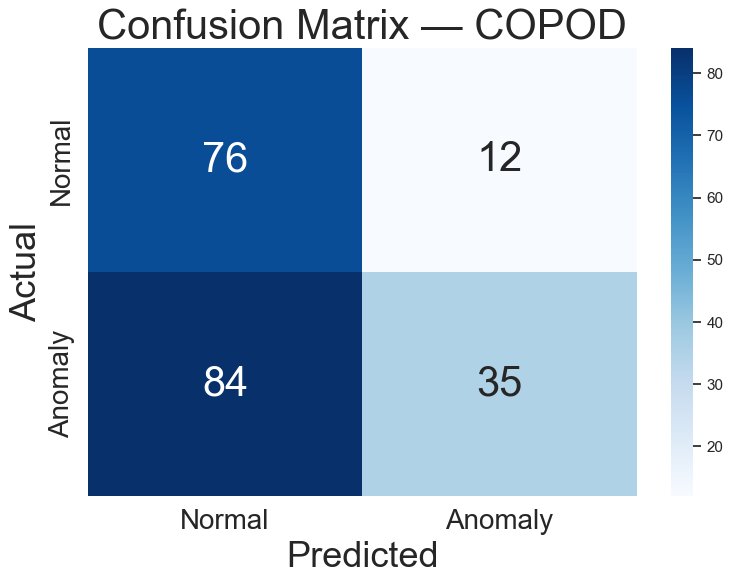

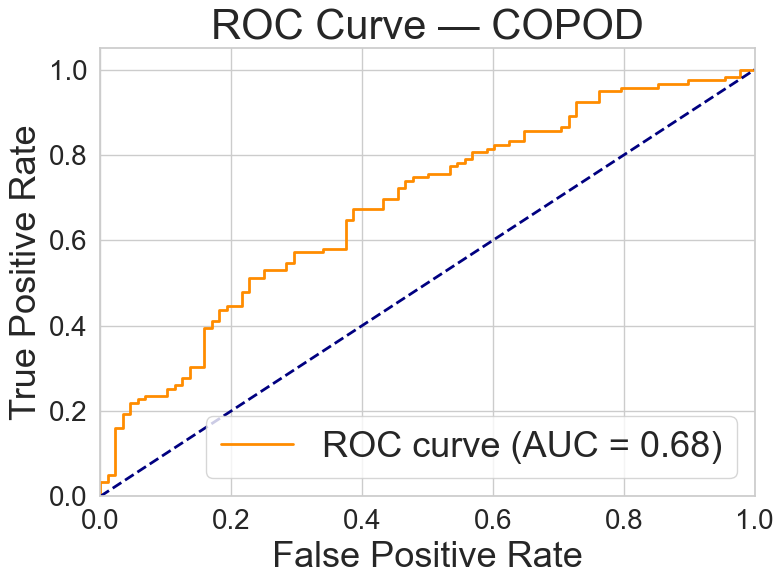

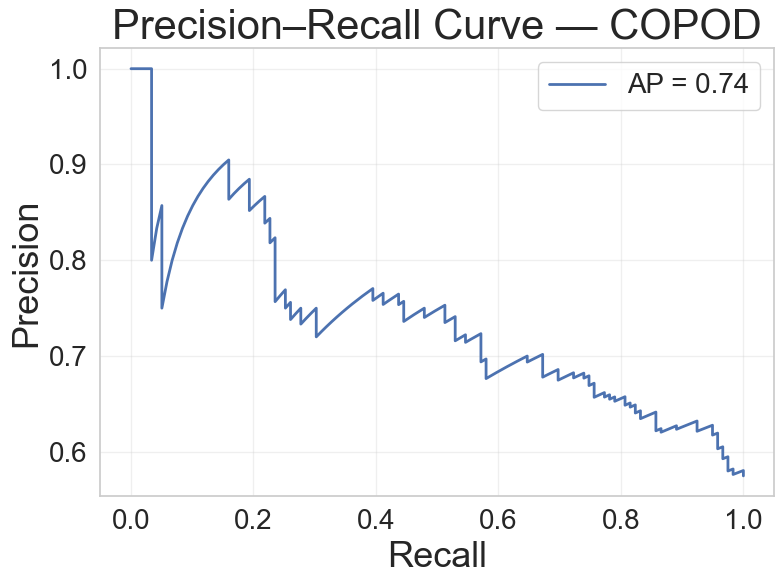

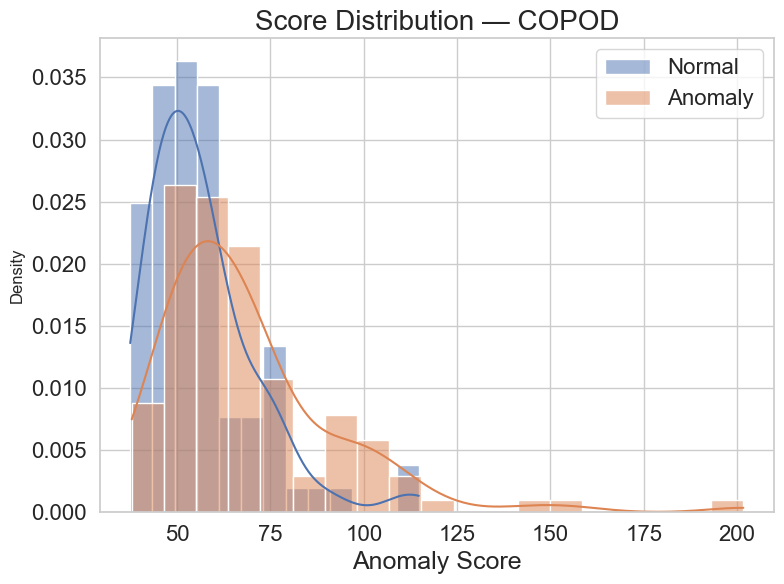

In [81]:
# Evaluate performance metrics
print("\n--- COPOD (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test, y_pred=y_test_pred_COPOD, y_score=y_test_scores_COPOD, model_name="COPOD", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="COPOD", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with COPOD Predictions

We visualize the COPOD's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


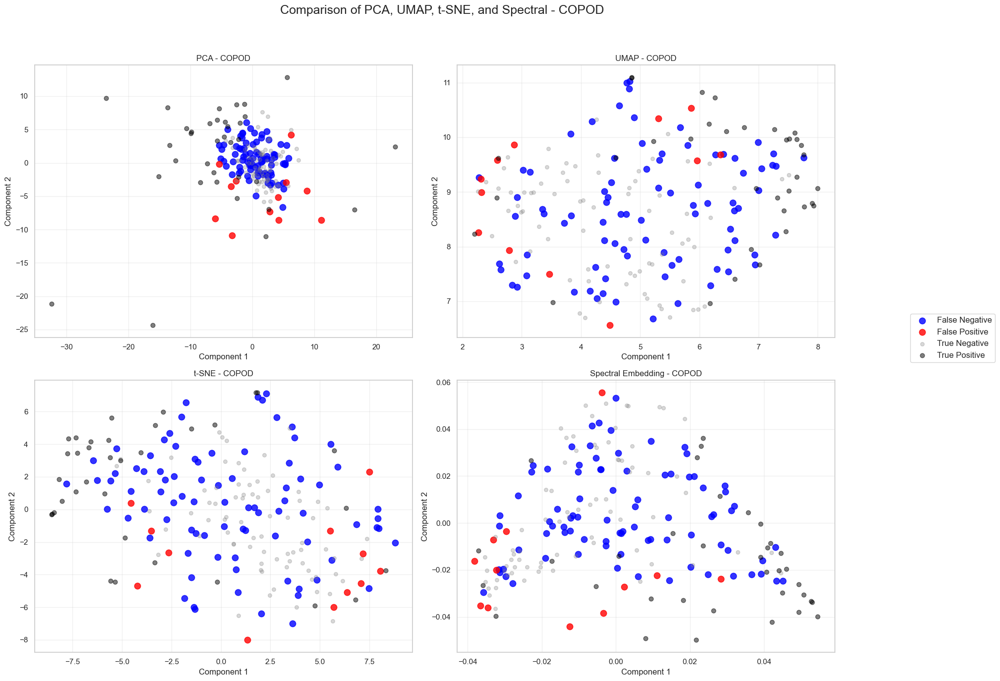

In [82]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_test_pred_COPOD, model_name="COPOD")

### 3D Visualization of COPOD Predictions

To better understand how the COPOD detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [83]:
if flag:    
# Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_test_pred_COPOD, model_name="COPOD", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_test_pred_COPOD, model_name="COPOD", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_test_pred_COPOD, model_name="COPOD", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_test_pred_COPOD, model_name="COPOD", num_components=3)

C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\1787140183.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


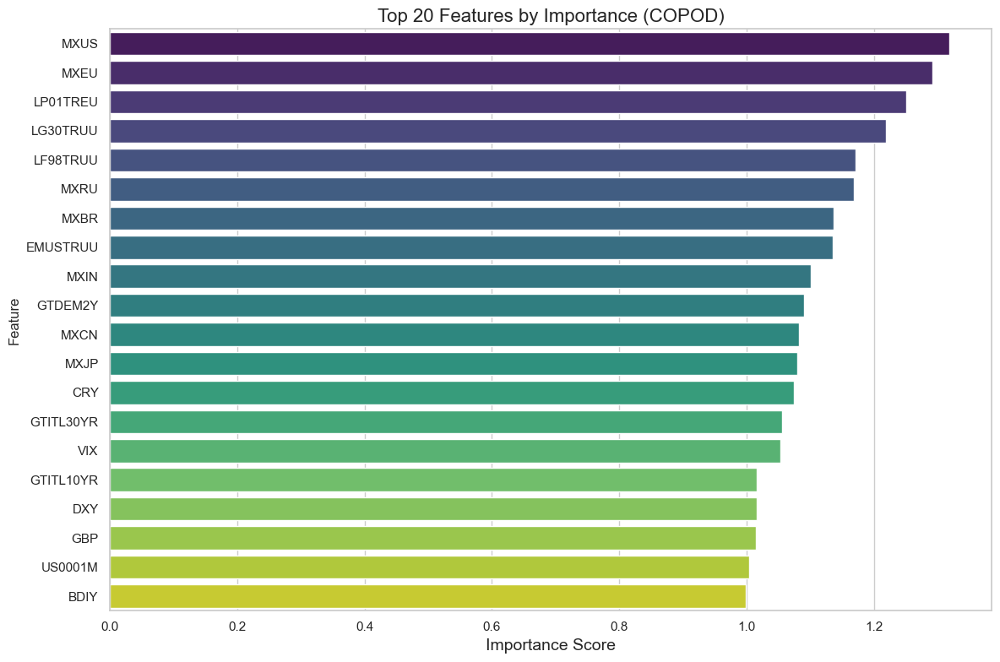

In [84]:
def copod_feature_importance(model, X_full, feature_names):
    """
    Feature importance for COPOD by measuring change in anomaly score
    when each feature is masked (set to 0).

    Parameters:
    - model: fitted COPOD model
    - X_full: 2D numpy array (n_samples, n_features)
    - feature_names: list of feature names

    Returns:
    - DataFrame with feature importance scores
    """
    # Original anomaly scores
    base_scores = model.decision_function(X_full)
    base_mean = base_scores.mean()

    importances = []
    for i in range(X_full.shape[1]):
        X_perturbed = X_full.copy()
        X_perturbed[:, i] = 0.0  # Mask feature i across all samples
        pert_scores = model.decision_function(X_perturbed)
        pert_mean = pert_scores.mean()
        delta = base_mean - pert_mean
        importances.append(delta)

    # Create DataFrame
    df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # Plot top features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (COPOD)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df


importance_df_copod = copod_feature_importance(
    model=detector_COPOD,
    X_full=X_test,
    feature_names=stationary_df.columns
)


# 10. Isolation Forest

Isolation Forest (IForest) is an unsupervised anomaly detection algorithm based on the idea that **anomalies are easier to isolate** than normal data points.

### Why Isolation Forest?

Isolation Forest is:

- Randomized and ensemble-based, like Random Forests
- Efficient and scalable to large, high-dimensional datasets
- Unsupervised: does not require labeled data
- Interpretable: relies on how quickly data points can be separated

Unlike density-based methods, IForest directly targets the detection of anomalies through **random isolation**.

### How is IForest Used for Anomaly Detection?

Isolation Forest isolates anomalies using:

1. Random Subsampling
   - Builds multiple shallow trees by randomly selecting features and split values.

2. Path Length Estimation
   - For each data point, compute the average **path length** from root to leaf across all trees.

3. Anomaly Scoring
   - Points with **shorter path lengths** are more likely to be anomalies.

> Anomalous points are easier to isolate and thus require fewer splits in the trees.

### Training / Validation / Test Process

1. Training Phase
- Fit the model using `model.fit(X_train_scaled)` on unlabeled data.

2. Validation Phase
- Use `.decision_function()` on a labeled validation set to:

    - Compute continuous anomaly scores.

    - Tune thresholds (e.g., using Optuna).

3. Test Phase
- Apply `.predict()` to classify samples as:

    - `1 = anomaly`

    - `0 = normal`

- Evaluate using:

    - Precision, Recall, F1

    - Confusion Matrix

    - ROC Curve, AUC

### Further Reading

- [Isolation Forest (Original Paper)](https://cs.nju.edu.cn/zhouzh/zhouzh.files/publication/icdm08b.pdf)  
  *Original paper by Liu, Ting, and Zhou.*

- [Scikit-learn Documentation – IsolationForest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html)  
  *Native implementation in Scikit-learn.*

- [PyOD Documentation – IForest](https://pyod.readthedocs.io/en/latest/pyod.models.html#iforest)  
  *Extended features and wrapper via the PyOD library.*

> Isolation Forest is a great general-purpose baseline for anomaly detection — fast, scalable, and effective across many domains.


In [85]:
from pyod.models.iforest import IForest

# 1. Initialize the Isolation Forest detector

# Estimate contamination from cross-validation labels
raw_contamination = np.mean(y_cross_val)
print(f"\nEstimated contamination from cross-validation set: {raw_contamination:.4f}")

# Cap contamination if needed
contam = min(raw_contamination, 0.5)
print(f"Using capped contamination value: {contam:.4f}")

detector_IF = IForest(contamination=contam, random_state=42)

# 2. Fit on the (scaled) training set (only normals)
detector_IF.fit(X_train)

# 3. Compute cross-validation scores
y_cv_scores_IForest = detector_IF.decision_function(X_cross_val)  # anomaly scores
y_cv_pred_IForest   = detector_IF.predict(X_cross_val)            # default threshold-based prediction

# Initial CV metrics (optional)
print("CV Precision: ", precision_score(y_cross_val, y_cv_pred_IForest))
print("CV Recall:    ", recall_score(y_cross_val, y_cv_pred_IForest))
print("CV F1-score: ", f1_score(y_cross_val, y_cv_pred_IForest))
print("CV Financial Score: ", financial_score(y_cross_val, y_cv_pred_IForest, mean_anomaly = mean_anomaly, mean_normal = mean_normal))




Estimated contamination from cross-validation set: 0.5756
Using capped contamination value: 0.5000
CV Precision:  0.6764705882352942
CV Recall:     0.7796610169491526
CV F1-score:  0.7244094488188977
CV Financial Score:  0.5591491144477454


In [86]:
# 4. Optuna threshold tuning
def threshold_objective(trial):
    """
    Optuna objective to tune the decision threshold based on F1 score
    using validation anomaly scores and true labels.
    """
    lower = float(np.percentile(y_cv_scores_IForest, 80))
    upper = float(np.max(y_cv_scores_IForest))
    thresh = trial.suggest_float("threshold", lower, upper)

    y_cv_pred = (y_cv_scores_IForest > thresh).astype(int)
    f1 = f1_score(y_cross_val, y_cv_pred, zero_division=0)

    trial.report(f1, step=0)
    if trial.should_prune():
        raise TrialPruned()

    return f1

threshold_study = optuna.create_study(
    study_name='Threshold_Tuning_IForest',
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)

print("Starting threshold optimization...")
threshold_study.optimize(threshold_objective, n_trials=50, show_progress_bar=True)
print("Threshold optimization completed.")
print("Best threshold:", threshold_study.best_params['threshold'])
print("Best CV F1:", threshold_study.best_value)

# Apply the best threshold to the cross-validation set
y_cv_pred_IForest = (y_cv_scores_IForest > threshold_study.best_params['threshold']).astype(int)

# 5. Apply best threshold to the test set
best_thresh = threshold_study.best_params['threshold']
y_test_scores_IForest = detector_IF.decision_function(X_test)
y_test_pred_IForest   = (y_test_scores_IForest > best_thresh).astype(int)


[I 2025-05-14 15:18:26,274] A new study created in memory with name: Threshold_Tuning_IForest


Starting threshold optimization...


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2025-05-14 15:18:26,285] Trial 0 finished with value: 0.323943661971831 and parameters: {'threshold': 0.1163548338672244}. Best is trial 0 with value: 0.323943661971831.
[I 2025-05-14 15:18:26,288] Trial 1 finished with value: 0.3472222222222222 and parameters: {'threshold': 0.10617838052241073}. Best is trial 1 with value: 0.3472222222222222.
[I 2025-05-14 15:18:26,292] Trial 2 finished with value: 0.3356643356643357 and parameters: {'threshold': 0.11251023514290301}. Best is trial 1 with value: 0.3472222222222222.
[I 2025-05-14 15:18:26,295] Trial 3 finished with value: 0.0967741935483871 and parameters: {'threshold': 0.17965434302392708}. Best is trial 1 with value: 0.3472222222222222.
[I 2025-05-14 15:18:26,297] Trial 4 finished with value: 0.22556390977443608 and parameters: {'threshold': 0.13806209887914078}. Best is trial 1 with value: 0.3472222222222222.
[I 2025-05-14 15:18:26,299] Trial 5 pruned. 
[I 2025-05-14 15:18:26,302] Trial 6 pruned. 
[I 2025-05-14 15:18:26,304] Tria

### Evaluate Isolation Forest Autoencoder Performance

This step evaluates the Isolation Forest anomaly detectionn on the test set using classification metrics and visualizations.


--- Isolation Forest (Test) ---

Isolation Forest Performance:
Precision: 0.7755
Recall:    0.3193
F1 Score:  0.4524
Financial Score: 0.3758


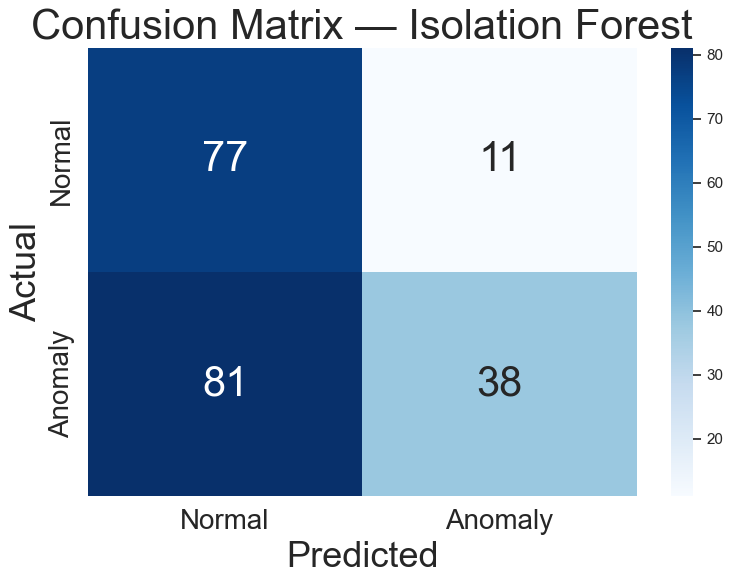

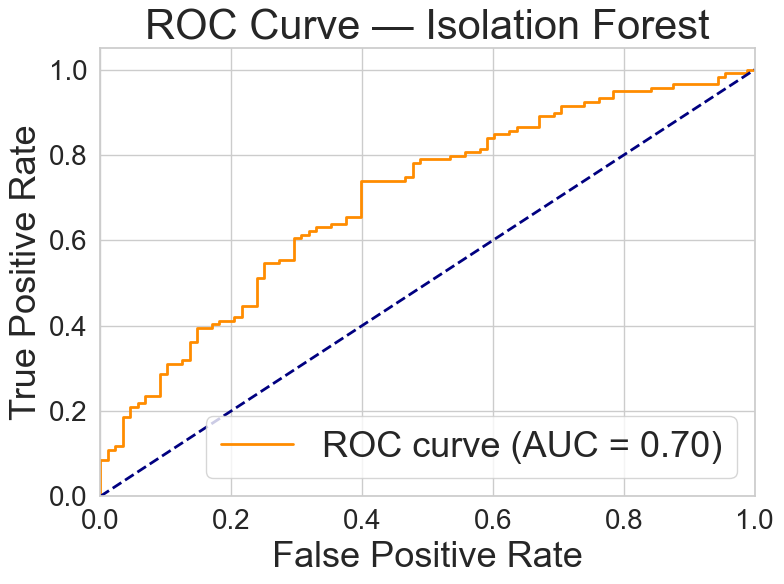

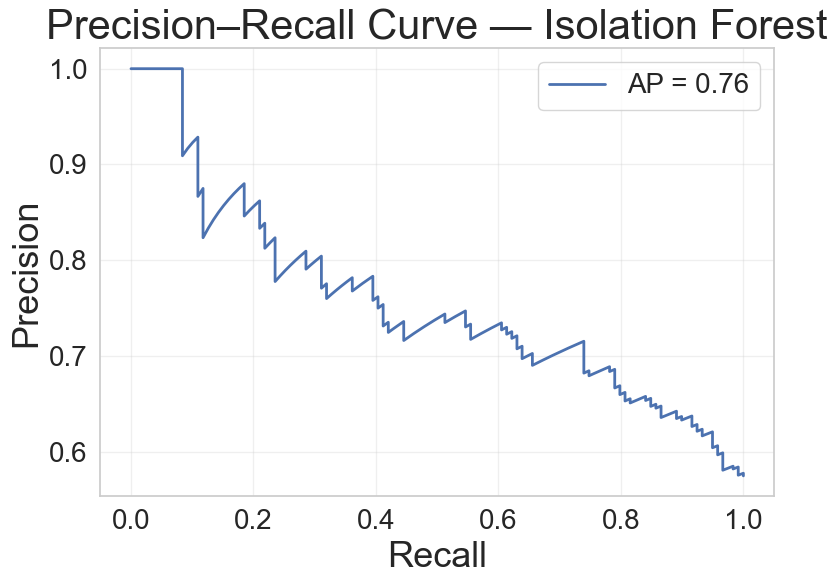

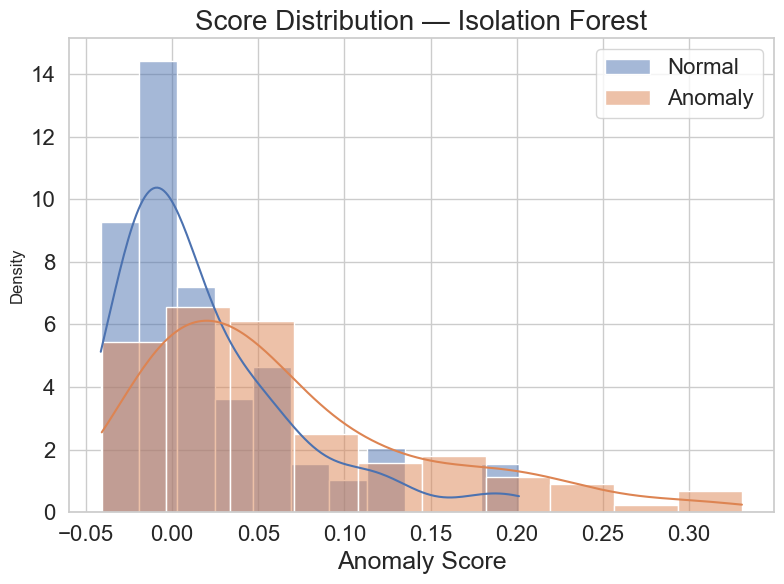

In [87]:
# Evaluate performance metrics
print("\n--- Isolation Forest (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test, y_pred=y_test_pred_IForest, y_score=y_test_scores_IForest, model_name="Isolation Forest", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="Isolation Forest", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with Isolation Forest Predictions

We visualize the Isolation Forest's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


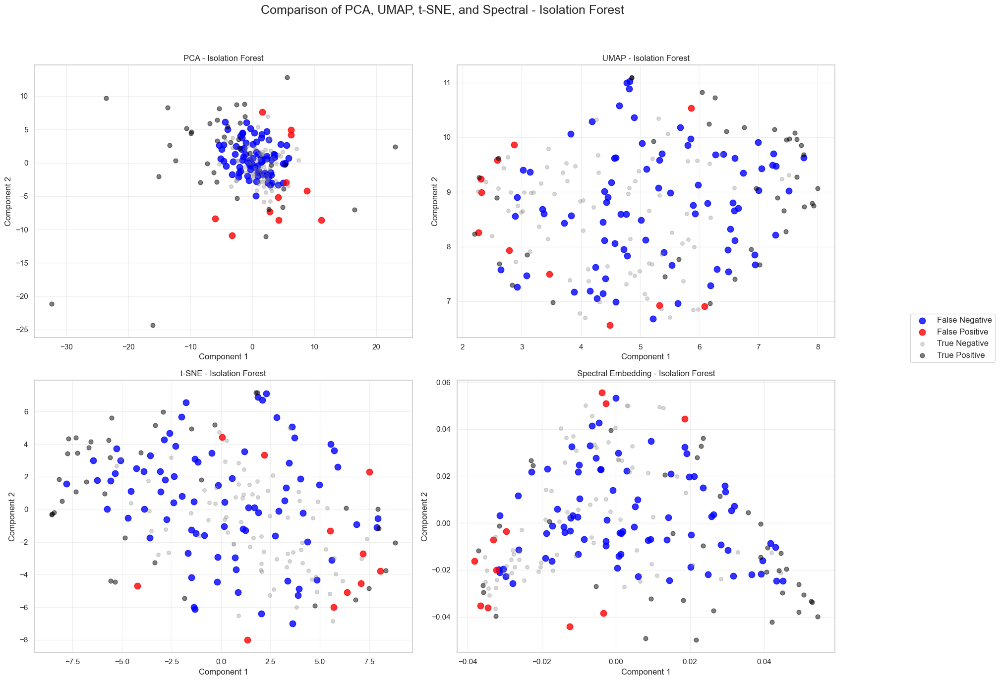

In [88]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_test_pred_IForest, model_name="Isolation Forest")

### 3D Visualization of Isolation Forest Predictions

To better understand how the Isolation Forest detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [89]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_test_pred_IForest, model_name="Isolation Forest", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_test_pred_IForest, model_name="Isolation Forest", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_test_pred_IForest, model_name="Isolation Forest", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_test_pred_IForest, model_name="Isolation Forest", num_components=3)

## Isolation Forest Feature Importance

Estimates feature importance for a trained Isolation Forest model by measuring the change in average anomaly score when each feature is masked (set to 0).

**Inputs**:
- `model`: Fitted IForest detector (PyOD)
- `X_full`: 2D input data (n_samples × n_features)
- `feature_names`: List of feature names

**Logic**:
- For each feature:
  - Mask it across all samples
  - Recompute anomaly scores
  - Importance = base_mean - perturbed_mean

**Output**:
- A sorted DataFrame of importance scores
- Bar plot of top 20 features


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\1858260784.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


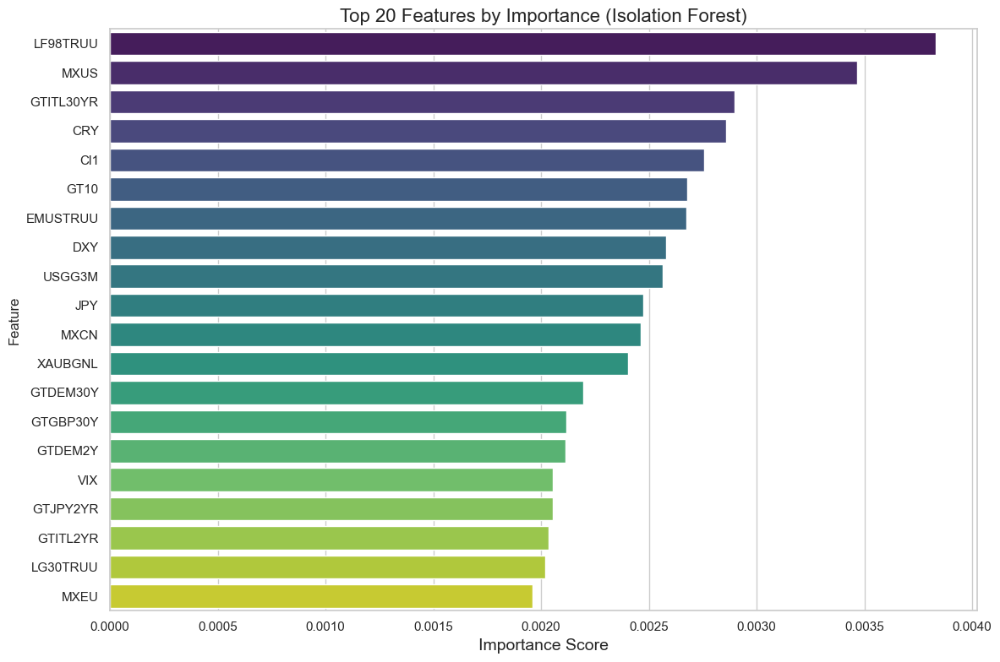

In [90]:
def iforest_feature_importance(model, X_full, feature_names):
    """
    Feature importance for Isolation Forest by measuring change in anomaly scores
    when each feature is masked (set to 0).

    Parameters:
    - model: fitted Isolation Forest model (from pyod)
    - X_full: 2D numpy array (n_samples, n_features)
    - feature_names: list of feature names

    Returns:
    - DataFrame with feature importance scores
    """
    # Base anomaly scores
    base_scores = model.decision_function(X_full)
    base_mean = base_scores.mean()

    importances = []
    for i in range(X_full.shape[1]):
        X_perturbed = X_full.copy()
        X_perturbed[:, i] = 0.0
        pert_scores = model.decision_function(X_perturbed)
        pert_mean = pert_scores.mean()
        delta = base_mean - pert_mean
        importances.append(delta)

    # DataFrame
    df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # Plot top features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (Isolation Forest)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df


importance_df_iforest = iforest_feature_importance(
    model=detector_IF,  # your trained IForest model
    X_full=X_test,
    feature_names=stationary_df.columns
)


# 11. Local Outlier Factor (LOF)

Local Outlier Factor (LOF) is a **density-based, unsupervised anomaly detection algorithm** that identifies points with significantly lower local density than their neighbors.

### Why LOF?

LOF is useful when:

- You want to detect **local anomalies**, not just global outliers.
- Your data lies in clusters, and **context matters**.
- You prefer interpretable, non-parametric models.

It is particularly effective when outliers occur in **dense regions** and can’t be separated globally.

### How is LOF Used for Anomaly Detection?

LOF compares the **local density** of a sample to the densities of its k-nearest neighbors:

1. **k-Nearest Neighbors**
   - For each point, find its `k` closest points.

2. **Local Reachability Density**
   - Estimate how densely the point is surrounded by its neighbors.

3. **LOF Score**
   - If a point's density is **much lower** than its neighbors', its **LOF score increases**.
   - LOF ≈ 1 → normal  
   - LOF > 1 → potential anomaly

> Anomalies are those that appear in sparse regions relative to their neighbors.

### Training / Validation / Test Process

1. Training Phase
- No training required in the traditional sense.
- Fit the model with `.fit(X_train_scaled)` on unlabeled data.

2. Validation Phase
- Use `.decision_function()` to compute anomaly scores.
- Tune the `n_neighbors` hyperparameter if needed.

3. Test Phase
- Use `.predict()` for binary labels:
    - `1 = anomaly`
    - `0 = normal`

- Evaluate using:

    - Precision, Recall, F1

    - Confusion Matrix

    - ROC Curve, AUC

### Further Reading

- [LOF: Identifying Density-Based Local Outliers (Original Paper)](https://www.dbs.ifi.lmu.de/Publikationen/Papers/LOF.pdf)  
  *Breunig et al., 2000.*

- [Scikit-learn Documentation – LOF](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html)  
  *Built-in support in sklearn for unsupervised LOF.*

- [PyOD Documentation – LOF](https://pyod.readthedocs.io/en/latest/pyod.models.html#lof)  
  *PyOD wrapper for additional tools like scoring and model export.*

> LOF is ideal when anomalies are defined by **local context**, especially in clustered or unevenly distributed data.


### Practical Implementation with PyOD + Optuna

In this implementation, we:

- Estimate the contamination from a labeled validation set.
- Use **PyOD's LOF model** to compute anomaly scores.
- Use **Optuna** to tune:
  - `n_neighbors` (number of neighbors to define local density)
  - A custom **threshold** on LOF scores to maximize validation F1-score.
- Retrain the LOF model with the best parameters and evaluate on the test set.

> This setup ensures the LOF model is both **context-sensitive** and **performance-optimized** for our specific dataset.


In [91]:
from pyod.models.lof import LOF

# 1. Estimate contamination from cross-validation labels
raw_contamination = np.mean(y_cross_val)
print(f"\nEstimated contamination from cross-validation set: {raw_contamination:.4f}")

# Cap contamination if needed
contam = min(raw_contamination, 0.5)
print(f"Using capped contamination value: {contam:.4f}")

# 2. Create Optuna study for tuning n_neighbors and threshold
def lof_threshold_objective(trial):
    """
    Optuna objective to tune LOF n_neighbors and decision threshold.
    """
    # Suggest hyperparameters
    n_neighbors = trial.suggest_int("n_neighbors", 10, 50, step=5)

    # Initialize and fit LOF with suggested n_neighbors
    detector_LOF = LOF(contamination=contam, n_neighbors=n_neighbors)
    detector_LOF.fit(X_train)

    # Compute decision scores on validation set
    y_cv_scores = detector_LOF.decision_function(X_cross_val)

    # Suggest a decision threshold
    lower = float(np.percentile(y_cv_scores, 80))
    upper = float(np.max(y_cv_scores))
    threshold = trial.suggest_float("threshold", lower, upper)

    # Convert scores to binary predictions
    y_cv_pred = (y_cv_scores > threshold).astype(int)

    # Evaluate with F1 score
    f1 = f1_score(y_cross_val, y_cv_pred, zero_division=0)
    trial.report(f1, step=0)
    if trial.should_prune():
        raise TrialPruned()

    return f1

# Create and run study
threshold_study = optuna.create_study(
    study_name='Threshold_Tuning_LOF',
    direction='maximize',
    pruner=optuna.pruners.MedianPruner(),
    sampler=optuna.samplers.TPESampler(seed=42)
)

print("Starting LOF threshold + hyperparameter tuning...")
threshold_study.optimize(lof_threshold_objective, n_trials=50, show_progress_bar=True)
print("Optimization completed.")
print("Best parameters:", threshold_study.best_params)
print("Best CV F1:", threshold_study.best_value)

# 3. Retrain LOF with best parameters
best_neighbors = threshold_study.best_params['n_neighbors']
best_thresh    = threshold_study.best_params['threshold']

detector_LOF = LOF(contamination=contam, n_neighbors=best_neighbors)
detector_LOF.fit(X_train)

# Compute cross-validation scores and predictions
y_cv_scores_LOF = detector_LOF.decision_function(X_cross_val)
y_cv_pred_LOF   = (y_cv_scores_LOF > best_thresh).astype(int)

# 4. Apply best threshold to the test set
y_test_scores_LOF = detector_LOF.decision_function(X_test)
y_test_pred_LOF   = (y_test_scores_LOF > best_thresh).astype(int)


[I 2025-05-14 15:18:29,049] A new study created in memory with name: Threshold_Tuning_LOF



Estimated contamination from cross-validation set: 0.5756
Using capped contamination value: 0.5000
Starting LOF threshold + hyperparameter tuning...


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2025-05-14 15:18:29,146] Trial 0 finished with value: 0.01680672268907563 and parameters: {'n_neighbors': 25, 'threshold': 4.258221713445057}. Best is trial 0 with value: 0.01680672268907563.
[I 2025-05-14 15:18:29,212] Trial 1 finished with value: 0.06557377049180328 and parameters: {'n_neighbors': 40, 'threshold': 3.30336139056154}. Best is trial 1 with value: 0.06557377049180328.
[I 2025-05-14 15:18:29,287] Trial 2 finished with value: 0.25 and parameters: {'n_neighbors': 15, 'threshold': 2.02962726944174}. Best is trial 2 with value: 0.25.
[I 2025-05-14 15:18:29,349] Trial 3 finished with value: 0.01680672268907563 and parameters: {'n_neighbors': 10, 'threshold': 4.003071797031284}. Best is trial 2 with value: 0.25.
[I 2025-05-14 15:18:29,417] Trial 4 finished with value: 0.049586776859504134 and parameters: {'n_neighbors': 35, 'threshold': 3.6245766241462327}. Best is trial 2 with value: 0.25.
[I 2025-05-14 15:18:29,481] Trial 5 pruned. 
[I 2025-05-14 15:18:29,548] Trial 6 fini

### Evaluate LOF Performance

This step evaluates the LOF anomaly detectionn on the test set using classification metrics and visualizations.


--- LOF (Test) ---

LOF Performance:
Precision: 0.7885
Recall:    0.3445
F1 Score:  0.4795
Financial Score: 0.3898


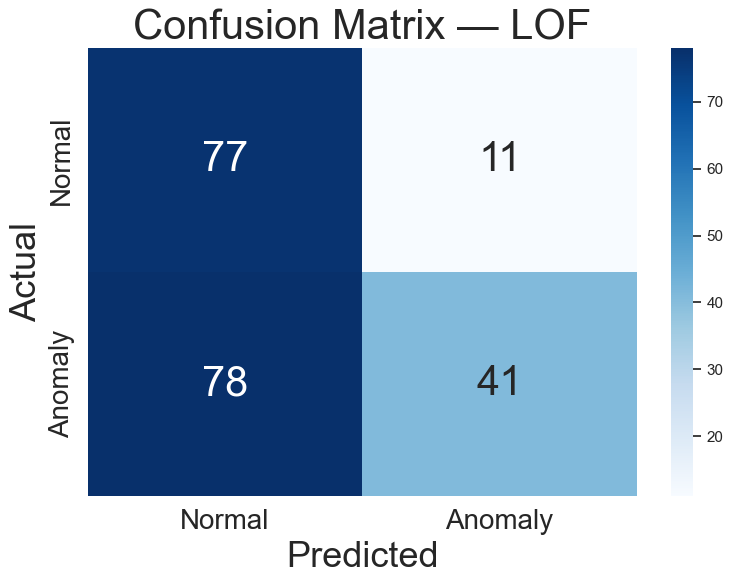

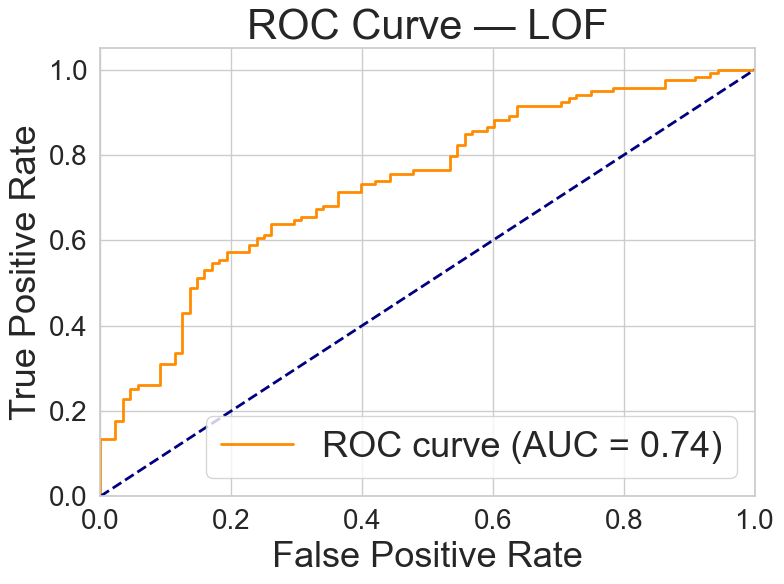

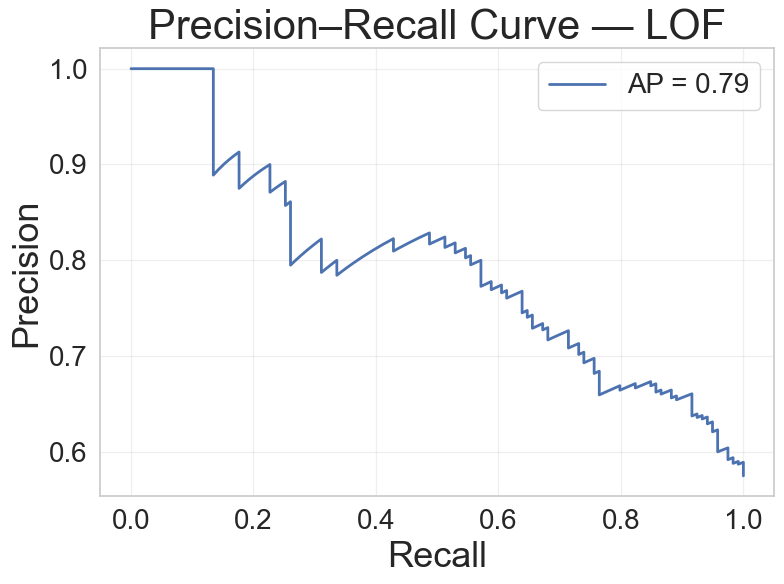

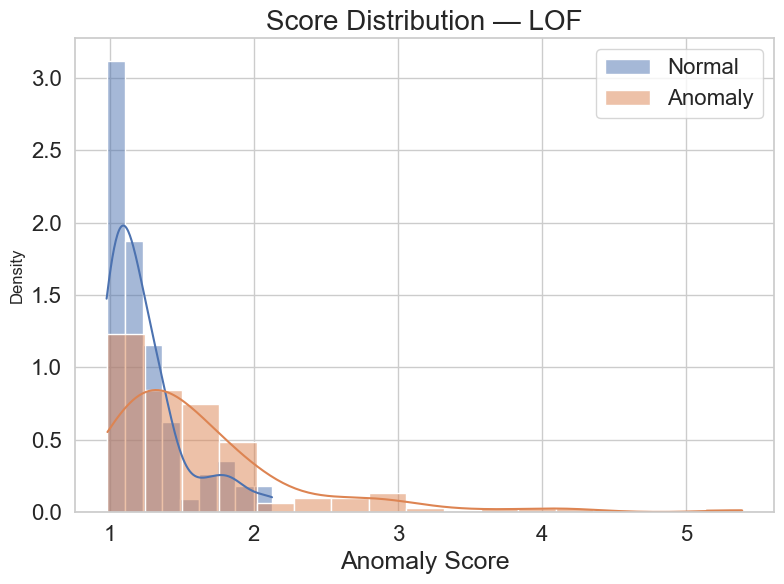

In [92]:
# Evaluate performance metrics
print("\n--- LOF (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test, y_pred=y_test_pred_LOF, y_score=y_test_scores_LOF, model_name="LOF", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="LOF", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with LOF Predictions

We visualize the LOF's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


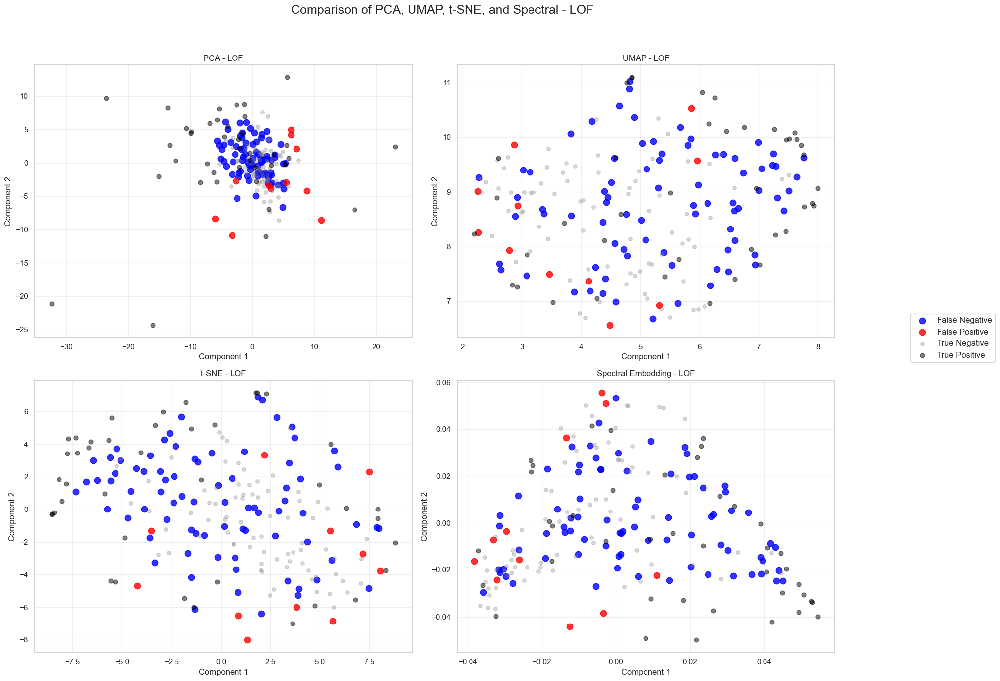

In [93]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_test_pred_LOF, model_name="LOF")

### 3D Visualization of LOF Predictions

To better understand how the LOF detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [94]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_test_pred_LOF, model_name="LOF", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_test_pred_LOF, model_name="LOF", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_test_pred_LOF, model_name="LOF", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_test_pred_LOF, model_name="LOF", num_components=3)

## Local Outlier Factor (LOF) Feature Importance

Estimates feature importance for a trained LOF model by measuring the change in average anomaly score when each feature is masked (set to 0).

**Inputs**:
- `model`: Fitted LOF detector (PyOD)
- `X_full`: 2D input data (n_samples × n_features)
- `feature_names`: List of feature names

**Logic**:
- For each feature:
  - Mask it across all samples
  - Recompute anomaly scores
  - Importance = base_mean - perturbed_mean

**Output**:
- A sorted DataFrame of importance scores
- Bar plot of top 20 features


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\40844020.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


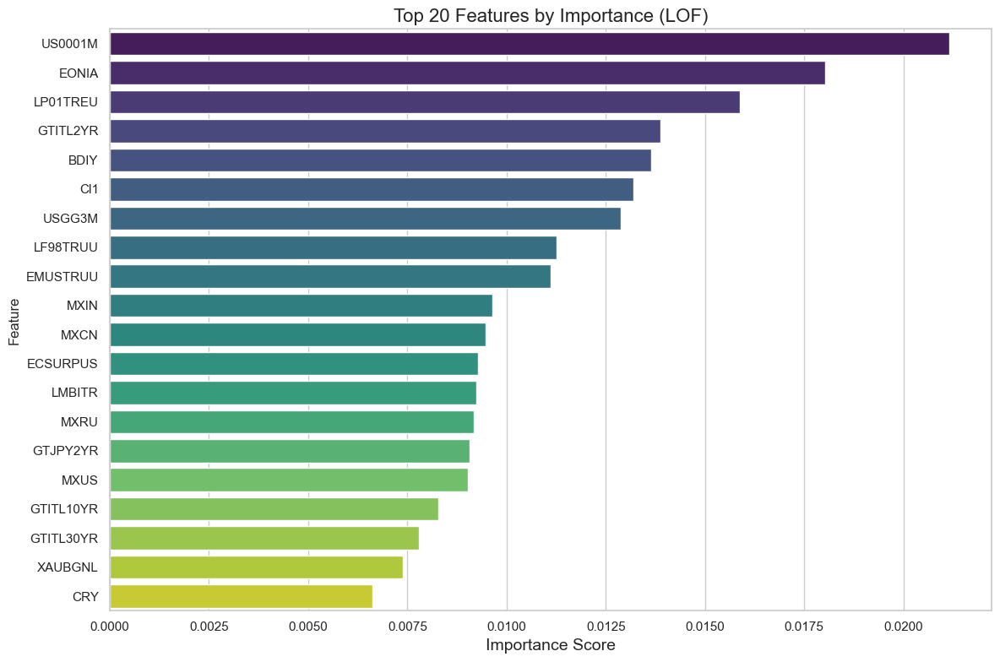

In [95]:
def lof_feature_importance(model, X_full, feature_names):
    """
    Feature importance for Local Outlier Factor (LOF) by measuring change in anomaly scores
    when each feature is masked (set to 0).

    Parameters:
    - model: fitted LOF model (from pyod)
    - X_full: 2D numpy array (n_samples, n_features)
    - feature_names: list of feature names

    Returns:
    - DataFrame with feature importance scores
    """
    # Base scores from the original data
    base_scores = model.decision_function(X_full)
    base_mean = base_scores.mean()

    importances = []
    for i in range(X_full.shape[1]):
        X_perturbed = X_full.copy()
        X_perturbed[:, i] = 0.0
        pert_scores = model.decision_function(X_perturbed)
        pert_mean = pert_scores.mean()
        delta = base_mean - pert_mean
        importances.append(delta)

    # Create DataFrame
    df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values('Importance', ascending=False)

    # Plot top features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (LOF)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df


importance_df_lof = lof_feature_importance(
    model=detector_LOF,  # your trained LOF model
    X_full=X_test,
    feature_names=stationary_df.columns
)


# 12. Ensemble Method

An ensemble-based anomaly detection method combines multiple individual detectors to produce a more robust and stable outlier score. The idea is to **leverage the strengths of different algorithms** by aggregating their predictions or scores.

### Why Use an Ensemble?

Ensemble anomaly detection offers:

- **Robustness**: reduces the variance of individual models  
- **Stability**: smoother predictions through averaging  
- **Complementarity**: different models capture different patterns

> Rather than relying on a single method, ensemble techniques balance different views of what constitutes "anomaly".

### How Is the Ensemble Built?

This approach aggregates **normalized scores** from multiple detectors:

1. **Score Normalization**
   - Apply `MinMaxScaler` to scale all scores to the [0, 1] range.
   - Ensures comparability between detectors (e.g., LSTM AE, LOF, IForest).

2. **Score Aggregation**
   - Average the normalized scores for each sample.
   - Other strategies include `max`, `median`, or weighted combinations.

3. **Threshold Selection**
   - Use a labeled cross-validation set to tune the threshold.
   - Often chosen to match a target **contamination rate**.

> Final ensemble score = normalized mean of all detector scores.

### Training / Validation / Test Process

1. Training Phase
- Train each base detector (e.g., Autoencoder, LOF, IForest) independently.

2. Validation Phase
- Compute normalized scores across models.
- Tune a unified threshold using the validation set and target contamination.

3. Test Phase
- Predict anomalies using the aggregated test scores and chosen threshold.
- Evaluate the ensemble using:

    - Precision, Recall, F1

    - Confusion Matrix

    - ROC Curve, AUC

### Further Reading

- [Anomaly Detection Ensemble Approaches (ODDS)](http://odds.cs.stonybrook.edu)  
  *Benchmark and theory resources for anomaly ensembles.*

- [PyOD Documentation – Combination Methods](https://pyod.readthedocs.io/en/latest/pyod.models.combination.html)  
  *PyOD's built-in tools for score-level ensemble methods.*

> Ensemble methods are ideal when you want to boost performance by combining complementary unsupervised models.



## Models Used in the Ensemble

- **LSTM Autoencoder** – reconstruction-based sequence model  
- **Isolation Forest** – tree-based global anomaly detector  
- **LOF (Local Outlier Factor)** – local density anomaly detector  

These models are independent and unsupervised, making them ideal candidates for ensemble fusion.

In [96]:
from sklearn.preprocessing import MinMaxScaler

# Score and threshold tuning for ensemble
all_cv   = np.vstack([y_AE_cv_pred,  y_cv_pred_IForest,  y_cv_pred_LOF ]).T
all_test = np.vstack([y_AE_pred_test, y_test_pred_IForest, y_test_pred_LOF]).T

sc_norm  = MinMaxScaler()                       # scale each detector 0‑1
all_cv_n   = sc_norm.fit_transform(all_cv)
all_test_n = sc_norm.transform(all_test)

ensemble_cv_scores   = all_cv_n.mean(axis=1)    # simple average
ensemble_test_scores = all_test_n.mean(axis=1)

# choose threshold on CV set that matches contamination
contamination = np.mean(y_cross_val)
thr = np.percentile(ensemble_cv_scores, 100*(1-contamination))
print(f"Chosen threshold (CV‑based) = {thr:.6f}")

# predict on test set using ensemble
y_test_pred_ensemble = (ensemble_test_scores > thr).astype(int)

Chosen threshold (CV‑based) = 0.191870


### Evaluate Ensemble Performance

This step evaluates the Ensemble anomaly detectionn on the test set using classification metrics and visualizations.


--- Ensemble (Test) ---

Ensemble Performance:
Precision: 0.7054
Recall:    0.7647
F1 Score:  0.7339
Financial Score: 0.5649


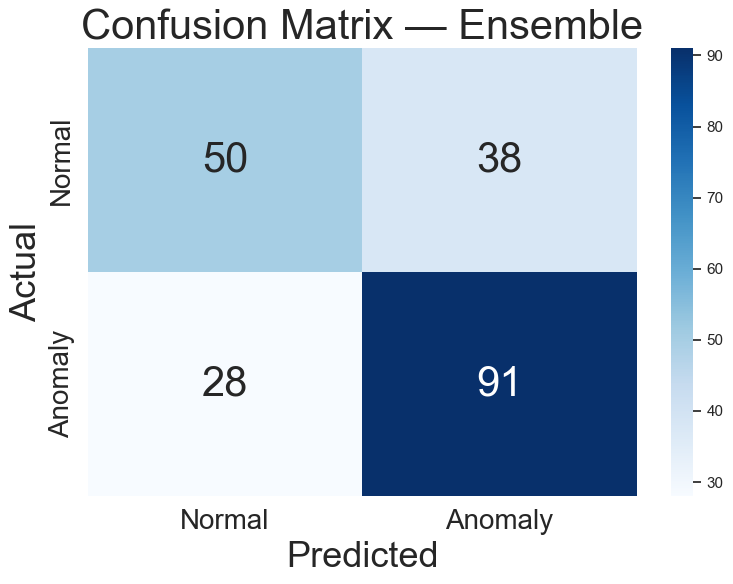

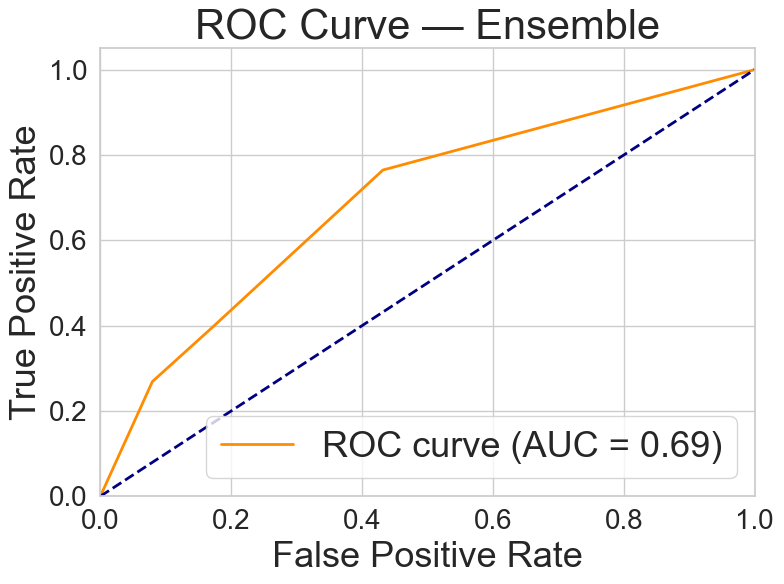

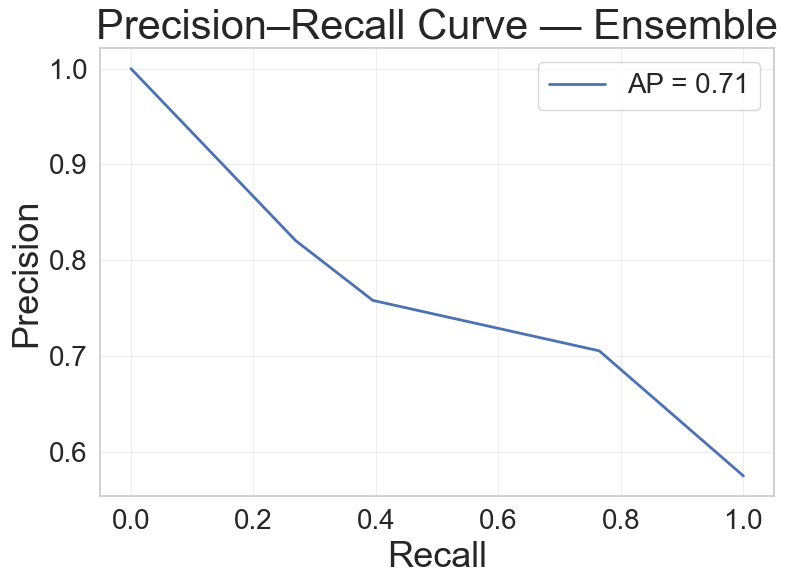

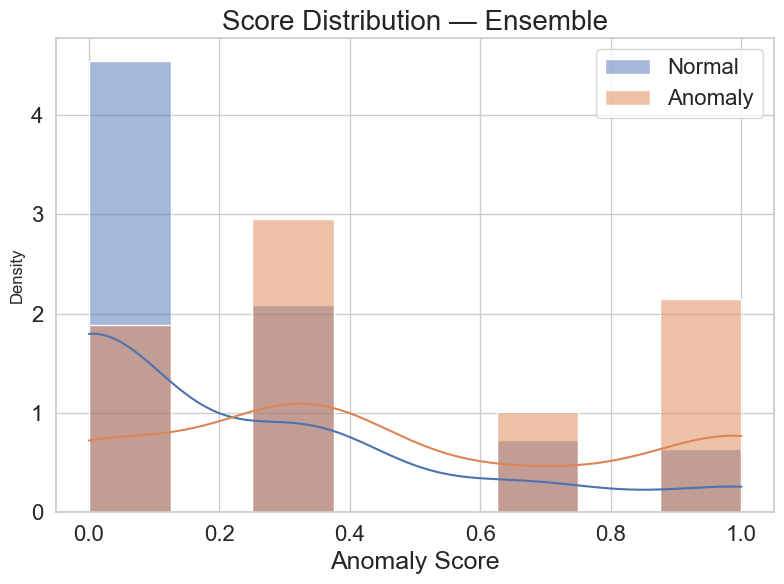

In [97]:
# Evaluate performance metrics
print("\n--- Ensemble (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test, y_pred=y_test_pred_ensemble, y_score=ensemble_test_scores, model_name="Ensemble", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="Ensemble", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with Ensemble Predictions

We visualize the Ensemble's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


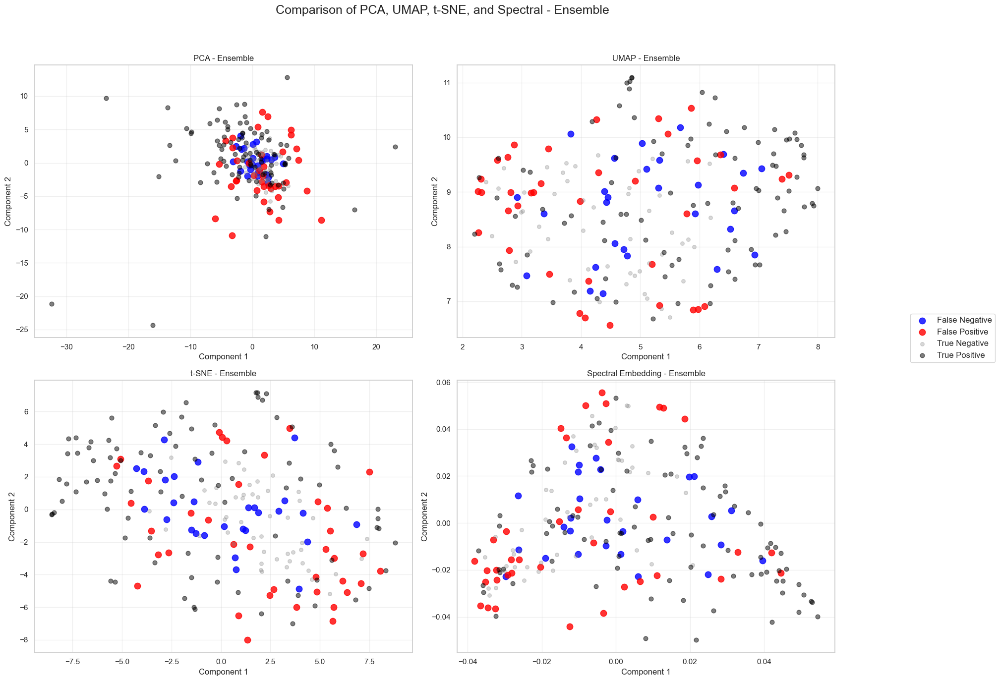

In [98]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_test_pred_ensemble, model_name="Ensemble")

### 3D Visualization of Ensemble Predictions

To better understand how the Ensemble detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [99]:
if flag:
    # Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_test_pred_ensemble, model_name="Ensemble", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_test_pred_ensemble, model_name="Ensemble", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_test_pred_ensemble, model_name="Ensemble", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_test_pred_ensemble, model_name="Ensemble", num_components=3)

## Ensemble Feature Importance

Estimates feature importance for an ensemble of anomaly detectors by measuring the change in the average ensemble anomaly score when each feature is masked (set to 0).

**Inputs**:
- `models`: List of trained models (e.g., [Autoencoder, LOF, IForest])
- `X_full`: 2D input data (n_samples × n_features)
- `feature_names`: List of feature names

**Logic**:
- For each feature:
  - Mask it across all samples
  - Recompute scores from each model (AE + PyOD)
  - Normalize all scores (e.g., MinMax)
  - Aggregate via average
  - Importance = base_mean - perturbed_mean

**Output**:
- A sorted DataFrame of importance scores
- Bar plot of top 20 features


C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\773627005.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')


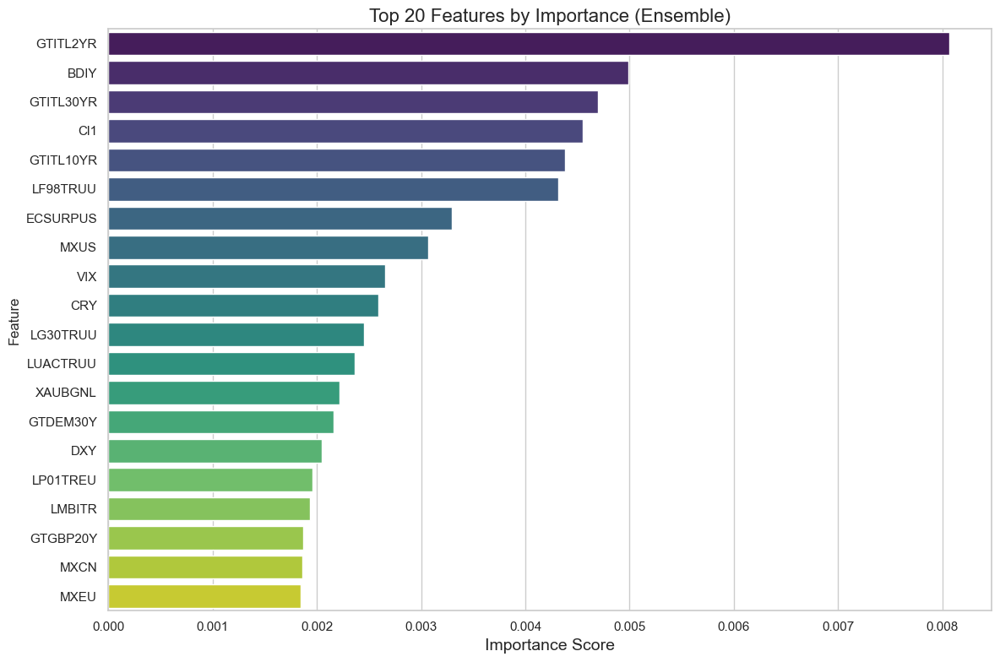

In [100]:
def ensemble_feature_importance(models, X_full, feature_names, ae_index=0, seq_len=None, device='cpu'):
    """
    Compute feature importance for an ensemble (including an LSTM Autoencoder) 
    using the change in anomaly scores when features are masked.

    Parameters:
    - models: list of models [AE, PyOD1, PyOD2]
    - X_full: np.ndarray (n_samples, n_features) — the original input (2D)
    - feature_names: list of column names
    - ae_index: index of the autoencoder in the models list
    - seq_len: sequence length for AE model (required if it's sequence-based)
    - device: torch device (default='cpu')

    Returns:
    - DataFrame with feature importance scores
    """
    ae_model = models[ae_index]
    other_models = [m for i, m in enumerate(models) if i != ae_index]

    # === Base Scores ===
    # AE
    if seq_len:
        _, ae_scores = ae_model.reconstruct_full(X_full, seq_len, device)
    else:
        X_tensor = torch.tensor(X_full).float().to(device)
        with torch.no_grad():
            output = ae_model(X_tensor)
            ae_scores = ((output - X_tensor) ** 2).mean(dim=1).cpu().numpy()

    # Other models
    other_scores = [m.decision_function(X_full) for m in other_models]

    # Stack and normalize
    base_stack = np.vstack([ae_scores] + other_scores).T
    scaler = MinMaxScaler()
    base_scaled = scaler.fit_transform(base_stack)
    base_ensemble = base_scaled.mean(axis=1)
    base_mean = base_ensemble.mean()

    # === Importance Loop ===
    importances = []
    for i in range(X_full.shape[1]):
        X_pert = X_full.copy()
        X_pert[:, i] = 0.0

        # AE perturbed
        if seq_len:
            _, ae_pert_scores = ae_model.reconstruct_full(X_pert, seq_len, device)
        else:
            X_tensor_pert = torch.tensor(X_pert).float().to(device)
            with torch.no_grad():
                output_pert = ae_model(X_tensor_pert)
                ae_pert_scores = ((output_pert - X_tensor_pert) ** 2).mean(dim=1).cpu().numpy()

        # Other model perturbed
        other_pert_scores = [m.decision_function(X_pert) for m in other_models]

        pert_stack = np.vstack([ae_pert_scores] + other_pert_scores).T
        pert_scaled = scaler.transform(pert_stack)
        pert_ensemble = pert_scaled.mean(axis=1)
        pert_mean = pert_ensemble.mean()

        delta = base_mean - pert_mean
        importances.append(delta)

    # === Output ===
    df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values('Importance', ascending=False)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=df.head(20), palette='viridis')
    plt.title('Top 20 Features by Importance (Ensemble)', fontsize=16)
    plt.xlabel('Importance Score', fontsize=14)
    plt.tight_layout()
    plt.show()

    return df


seq_len = 0

importance_df_ensemble = ensemble_feature_importance(
    models=[best_model_AE, detector_IF, detector_LOF],
    X_full=X_test_timeseries,
    feature_names=stationary_df.columns,
    ae_index=0,
    seq_len=seq_len,  # only if AE is sequence-based
    device=device
)


# 13. Stacked Ensemble Classifier

This hybrid ensemble combines three diverse anomaly detectors: a statistical model (**COPOD**), a deep learning model (**f-AnoGAN**), and a tree-based model (**Isolation Forest**). Their anomaly scores are used as features to train a **Random Forest classifier**, which learns to optimally weigh each model’s contribution.

### Why Stacking?

Stacking allows you to **blend heterogeneous models** by feeding their outputs into a meta-model:

- **COPOD** – Captures extreme tail dependencies in data using copula theory.
- **f-AnoGAN** – Detects anomalies via generative reconstruction and feature-matching.
- **Isolation Forest** – Identifies sparse patterns using random partitions.

> Each model brings a unique perspective. The ensemble amplifies their strengths.

### How the Ensemble Works

1. **Base Layer – Anomaly Detection Models**
   - Each detector is trained (or fitted) on the **training set**.
   - On the **validation and test sets**, they produce **continuous anomaly scores**:
     - `detector_COPOD.decision_function(...)`
     - `fanogan.predict(...)`
     - `detector_IF.decision_function(...)`

2. **Meta Layer – Random Forest Classifier**
   - Anomaly scores from the 3 detectors are **stacked**:  
     `X_stack = [score_COPOD, score_f-AnoGAN, score_IForest]`
   - A supervised **Random Forest classifier** is trained on the stacked CV data to learn the best decision boundary.

### Training / Validation / Test Procedure

1. **Training**
   - Fit base models using normal-only training data.
   - Use `.decision_function()` or custom logic to obtain scores.

2. **Validation**
   - Stack CV scores into a matrix `X_stack_cv`.
   - Train a Random Forest classifier with `class_weight={0: 10, 1: 1}` to penalize false positives more heavily.

3. **Testing**
   - Compute and stack test scores.
   - Predict final labels and probabilities using the trained classifier.

### Why Random Forest?

- Handles **nonlinear relationships** in score combinations
- Robust to class imbalance via `class_weight`
- Outputs **probabilities**, **feature importances**, and **interpretable results**

### Summary

- **Models used**: COPOD + f-AnoGAN + Isolation Forest
- **Stacking method**: Anomaly scores → Random Forest classifier
- **Advantages**:
  - Improves robustness and generalization
  - Blends generative, statistical, and algorithmic insights
  - Reduces variance of individual detectors

### Further Reading

- [Stacked Generalization (Wolpert, 1992)](https://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.40.334)  
  *Foundational paper on stacking in machine learning.*

- [PyOD + scikit-learn Ensemble Tutorial](https://pyod.readthedocs.io/en/latest/pyod.models.combination.html)  
  *Documentation on combining models and integrating supervised classifiers.*

> Stacked ensembles are ideal when you have labeled validation data and want to **combine the strength of unsupervised and deep detectors using a learned fusion strategy**.


In [101]:
from pyod.models.copod import COPOD
from pyod.models.iforest import IForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.manifold import SpectralEmbedding

# 1) Estimate contamination from CV
raw_contam = np.mean(y_cross_val)
contam = min(raw_contam, 0.5)

# 2) Use already tuned models (indeed 'detector_COPOD', 'fa_model', 'detector_IF' already exist)

# 3) Get anomaly scores on CV set
y_score_copod_cv = detector_COPOD.decision_function(X_cross_val)
_, y_score_fa_cv = fanogan.predict(X_cross_val)
y_score_if_cv = detector_IF.decision_function(X_cross_val)
y_score_lof_cv  = detector_LOF.decision_function(X_cross_val)
y_score_MVG_cv  = -np.log(p_MVG_cv + 1e-12)

X_stack_cv = np.vstack([
    y_score_copod_cv,
    y_score_fa_cv,
    y_score_if_cv,
    y_score_lof_cv,
    y_score_MVG_cv
]).T

# 5) Train cost-sensitive Random Forest on CV
clf = RandomForestClassifier(
    n_estimators=1000,
    class_weight={0: 10, 1: 1},
    random_state=42
)
clf.fit(X_stack_cv, y_cross_val)

# 6) Get test scores and stacked test matrix
y_score_copod_t = detector_COPOD.decision_function(X_test)
_, y_score_fa_t = fanogan.predict(X_test)
y_score_if_t = detector_IF.decision_function(X_test)
y_score_lof_t = detector_LOF.decision_function(X_test)
y_score_MVG_t = -np.log(p_MVG_test + 1e-12)

X_stack_test = np.vstack([
    y_score_copod_t,
    y_score_fa_t,
    y_score_if_t,
    y_score_lof_t,
    y_score_MVG_t
]).T

# 7) Final stacked prediction
y_pred_stack = clf.predict(X_stack_test)
y_prob_stack = clf.predict_proba(X_stack_test)[:, 1]


### Evaluate Stacked Ensemble Performance

This step evaluates the Stacked Ensemble anomaly detectionn on the test set using classification metrics and visualizations.


--- Stacked Ensemble (Test) ---

Stacked Ensemble Performance:
Precision: 0.6963
Recall:    0.7899
F1 Score:  0.7402
Financial Score: 0.5724


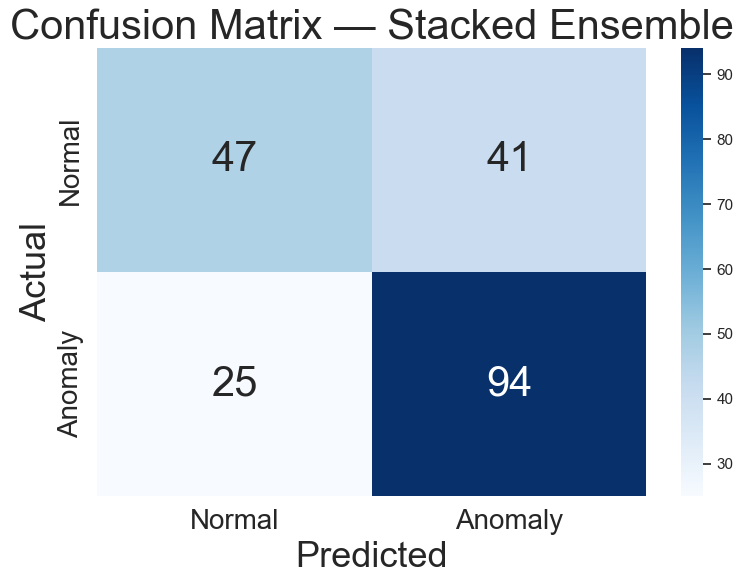

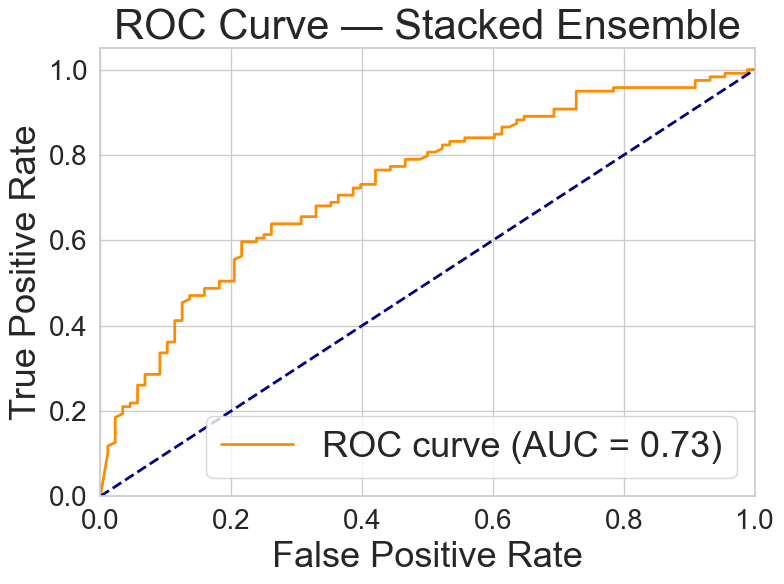

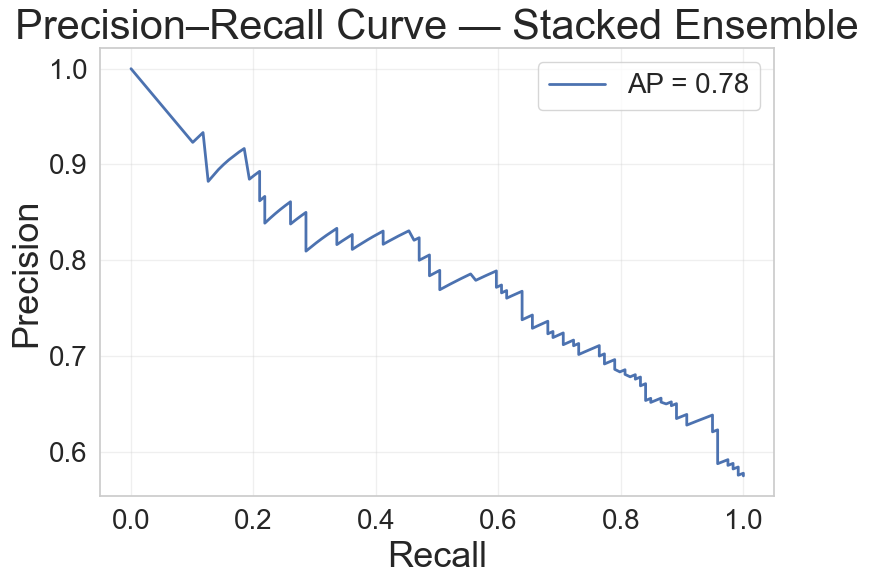

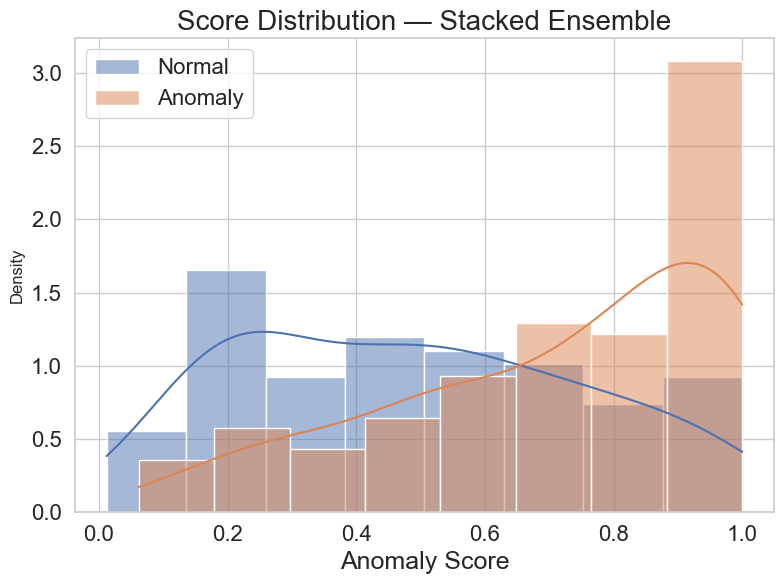

In [102]:
# Evaluate performance metrics
print("\n--- Stacked Ensemble (Test) ---")
precision, recall, f1, fin = evaluate_model(y_true=y_test, y_pred=y_pred_stack, y_score=y_prob_stack, model_name="Stacked Ensemble", mean_anomaly=mean_anomaly, mean_normal=mean_normal)
results.append(
    dict(model="Stacked Ensemble", precision=precision, recall=recall,
         f1=f1, finscore=fin)
)

### 2D Latent Space Projections with Stacked Ensemble Predictions

We visualize the Stacked Ensemble's classification results across four popular 2D projection techniques — PCA, UMAP, t-SNE, and Spectral Embedding — using the compare_dim_reductions function.
Each projection helps reveal how well the model separates normal and anomalous points in reduced-dimensional space.

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\nicol\AppData\Local\Temp\ipykernel_18640\2902658377.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.95, 0.95])  # Leave space on the right


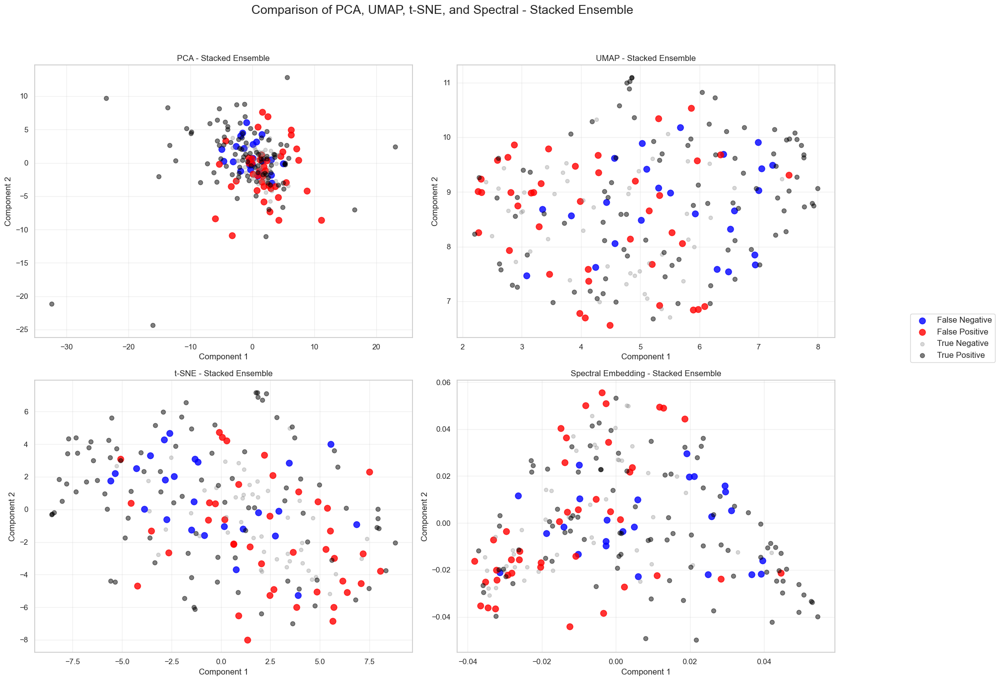

In [103]:
# Compare 2D projections: PCA, UMAP, t-SNE, Spectral
compare_dim_reductions(X_test, y_test, y_pred_stack, model_name="Stacked Ensemble")

### 3D Visualization of Stacked Ensemble Predictions

To better understand how the Stacked Ensemble detects anomalous data, we project the test set into 3D spaces using different dimensionality reduction techniques:

- PCA: Captures global variance with a linear transformation.

- UMAP: Preserves local and global structure in non-linear manifolds.

- t-SNE: Focuses on local neighborhood relationships.

- Spectral Embedding: Based on graph Laplacians, captures connectivity patterns.

Each projection reveals different geometric aspects of the classification results.

In [104]:
if flag:    
# Visualize PCA, UMAP, t-SNE, and Spectral Embedding in 3D
    visualize_pca(X_test, y_true=y_test, y_pred=y_pred_stack, model_name="Stacked Ensemble", num_components=3)
    visualize_umap(X_test, y_true=y_test, y_pred=y_pred_stack, model_name="Stacked Ensemble", num_components=3)
    visualize_tsne(X_test, y_true=y_test, y_pred=y_pred_stack, model_name="Stacked Ensemble", num_components=3)
    visualize_spectral(X_test, y_true=y_test, y_pred=y_pred_stack, model_name="Stacked Ensemble", num_components=3)

model,MVG + Optuna,Autoencoder + Optuna,Vanilla GAN,f-AnoGAN,LSTM Autoencoder,LSTM Predictor,COPOD,Isolation Forest,LOF,Ensemble,Stacked Ensemble
precision,0.701,0.705,0.607,0.645,0.970,0.920,0.745,0.776,0.788,0.705,0.696
recall,0.807,0.765,0.546,0.933,0.269,0.387,0.294,0.319,0.345,0.765,0.790
f1,0.750,0.734,0.575,0.763,0.421,0.544,0.422,0.452,0.480,0.734,0.740
finscore,0.582,0.565,0.434,0.608,0.370,0.414,0.360,0.376,0.390,0.565,0.572


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


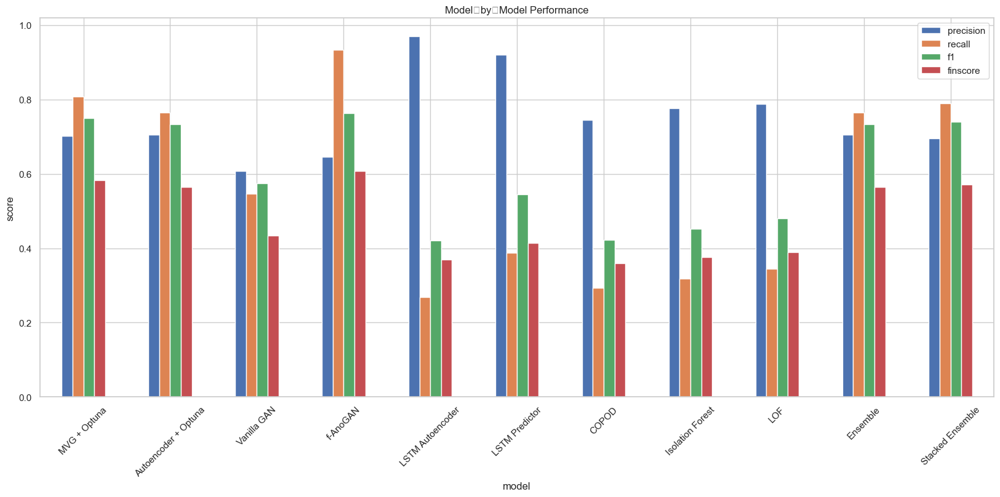

In [105]:
metrics_df = pd.DataFrame(results).set_index("model").round(3)
display(metrics_df.T)

# quick bar‑plot of F1 & FinScore
metrics_df.plot.bar(figsize=(20,8), rot=45);
plt.title("Model‑by‑Model Performance"); plt.ylabel("score");

### MLP

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, precision_recall_curve, auc

X = X_df.values
Y = data_df['Y'].values
idx = X_df.index
# 2. Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Split into train / temp
X_train, X_temp, Y_train, Y_temp, idx_train, idx_temp = train_test_split(
    X_scaled, Y, idx,
    test_size=0.40,
    random_state=42,
    stratify=Y
)


print(X_train.shape)
print(f"Train size: {len(Y_train)}")


X_val, X_test, Y_val, Y_test, idx_val, idx_test = train_test_split(
    X_temp, Y_temp, idx_temp,
    test_size=0.5,          # ≈20% totale come test, 20% val
    random_state=42,
    stratify=Y_temp
)


print(f"Sizes → train: {len(Y_train)}, val: {len(Y_val)}, test: {len(Y_test)}")

# 5. Build and train the neural network
model = MLPClassifier(
    hidden_layer_sizes=(512, 256, 128, 64, 32, 16),
    activation='relu',
    solver='adam',
    random_state=42
)
model.fit(X_train, Y_train)

# 6. Choose a threshold on the validation set
Y_val_prob = model.predict_proba(X_val)[:, 1]
best_f1, best_thresh = -1, 0.5
for τ in np.linspace(0.05, 0.95, 19):
    preds = (Y_val_prob > τ).astype(int)
    f1 = f1_score(Y_val, preds)
    if f1 > best_f1:
        best_f1, best_thresh = f1, τ

print(f"Best validation F1 = {best_f1:.4f} at threshold = {best_thresh:.2f}")

# 7. Evaluate on validation
Y_val_pred = (Y_val_prob > best_thresh).astype(int)
# print("=== Validation Results ===")
# print(f"AUC (probabilities): {roc_auc_score(Y_val, Y_val_prob):.4f}")
# print(classification_report(Y_val, Y_val_pred, digits=4))
# print("Confusion matrix:\n", confusion_matrix(Y_val, Y_val_pred))

# 8. Evaluate on test
Y_test_prob = model.predict_proba(X_test)[:, 1]
Y_test_pred = (Y_test_prob > best_thresh).astype(int)
# print("\n=== Test Results ===")
# print(f"AUC (probabilities): {roc_auc_score(Y_test, Y_test_prob):.4f}")
# print(classification_report(Y_test, Y_test_pred, digits=4))
# print("Confusion matrix:\n", confusion_matrix(Y_test, Y_test_pred))

# 9. (Optional) Plot ROC curves
fpr_val, tpr_val, _ = roc_curve(Y_val, Y_val_prob)
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_test_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr_val,  tpr_val,  label=f'Val ROC (AUC={roc_auc_score(Y_val, Y_val_prob):.2f})')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC={roc_auc_score(Y_test, Y_test_prob):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

# evaluate_model(Y_val, Y_val_pred, y_score = Y_val_prob, model_name="MLP, validation", mean_anomaly=mean_anomaly, mean_normal=mean_normal)

precision, recall, f1,finscore = evaluate_model(Y_test, Y_test_pred, y_score = Y_test_prob, model_name="MLP, test", mean_anomaly=mean_anomaly, mean_normal=mean_normal)

results.append(
    dict(model="MLP", precision=precision, recall=recall,
         f1=f1, finscore=finscore)
)


# TEST THE MODEL

In [143]:
# 3. Split into train / temp
X_train, X_temp, Y_train, Y_temp, idx_train, idx_temp = train_test_split(
    X_scaled, Y, idx,
    test_size=0.40,
    random_state=42,
    shuffle=False,
    # stratify=Y
)


X_val, X_test, Y_val, Y_test, idx_val, idx_test = train_test_split(
    X_temp, Y_temp, idx_temp,
    test_size=0.9,          # ≈20% totale come test, 20% val
    random_state=42,
    shuffle=False,
    # stratify=Y_temp
)
Y_val_prob = model.predict_proba(X_val)[:, 1]

In [ ]:
# 8. Evaluate on test
Y_test_prob = model.predict_proba(X_test)[:, 1]
Y_test_pred = (Y_test_prob > best_thresh).astype(int)
# print("\n=== Test Results ===")
# print(f"AUC (probabilities): {roc_auc_score(Y_test, Y_test_prob):.4f}")
# print(classification_report(Y_test, Y_test_pred, digits=4))
# print("Confusion matrix:\n", confusion_matrix(Y_test, Y_test_pred))

# 9. (Optional) Plot ROC curves
fpr_val, tpr_val, _ = roc_curve(Y_val, Y_val_prob)
fpr_test, tpr_test, _ = roc_curve(Y_test, Y_test_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr_val,  tpr_val,  label=f'Val ROC (AUC={roc_auc_score(Y_val, Y_val_prob):.2f})')
plt.plot(fpr_test, tpr_test, label=f'Test ROC (AUC={roc_auc_score(Y_test, Y_test_prob):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

# evaluate_model(Y_val, Y_val_pred, y_score = Y_val_prob, model_name="MLP, validation", mean_anomaly=mean_anomaly, mean_normal=mean_normal)

precision, recall, f1,finscore = evaluate_model(Y_test, Y_test_pred, y_score = Y_test_prob, model_name="MLP, test", mean_anomaly=mean_anomaly, mean_normal=mean_normal)

results.append(
    dict(model="MLP", precision=precision, recall=recall,
         f1=f1, finscore=finscore)
)

In [147]:
idx_test

DatetimeIndex(['2013-08-20', '2013-08-27', '2013-09-03', '2013-09-10',
               '2013-09-17', '2013-09-24', '2013-10-01', '2013-10-08',
               '2013-10-15', '2013-10-22',
               ...
               '2021-02-16', '2021-02-23', '2021-03-02', '2021-03-09',
               '2021-03-16', '2021-03-23', '2021-03-30', '2021-04-06',
               '2021-04-13', '2021-04-20'],
              dtype='datetime64[ns]', name='Data', length=401, freq=None)

In [148]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier

# Load data and split by date
df = pd.read_excel('Dataset4_EWS.xlsx', sheet_name='Markets', parse_dates=['Data'])
df.set_index('Data', inplace=True)
train = df.loc[:'2012-10-09']
test  = df.loc['2013-08-20':'2021-04-20']
features = df.columns.drop('Y')  # all features except target

X_train = train[features]
y_train = train['Y']
X_test  = test[features]
y_test  = test['Y']

# Align predictions to dates
pred_series = pd.Series(Y_test_pred, idx_test)

# Define the regional indices in the portfolio
indices = ['MXUS','MXEU','MXJP','MXBR','MXRU','MXIN','MXCN']

# Compute weekly returns for each index
returns = X_test[indices].pct_change()  # percentage change

# Initialize portfolio values (start at 1.0) for each scenario
dates = X_test.index
port_all   = [1.0]
port_no_true = [1.0]
port_no_pred = [1.0]

for i in range(1, len(dates)):
    avg_ret = returns.iloc[i].mean()   # equal-weighted return
    # All days scenario (always apply avg_ret)
    port_all.append(port_all[-1] * (1 + avg_ret))
    # Exclude True Anomalies scenario
    if y_test.iloc[i] == 1:
        port_no_true.append(port_no_true[-1])         # no change
    else:
        port_no_true.append(port_no_true[-1] * (1 + avg_ret))
    # Exclude Predicted Anomalies scenario
    if pred_series.iloc[i] == 1:
        port_no_pred.append(port_no_pred[-1])
    else:
        port_no_pred.append(port_no_pred[-1] * (1 + avg_ret))



In [149]:
scenarios = {
    "All Days":    np.array(port_all),
    "No True Anoms": np.array(port_no_true),
    "No Pred Anoms": np.array(port_no_pred)
}

# Compute max drawdown and days-to-recovery
def compute_drawdown(series):
    peak = series.expanding().max()
    drawdown = (series - peak) / peak
    mdd = drawdown.min()
    trough_date = drawdown.idxmin()
    peak_val = peak.loc[trough_date]
    # Find recovery date
    post = series.loc[trough_date:]
    recover_idx = post[post >= peak_val].first_valid_index()
    days_recovery = None
    if recover_idx is not None:
        days_recovery = series.index.get_loc(recover_idx) - series.index.get_loc(trough_date)
    return float(mdd), int(days_recovery), trough_date, recover_idx

# From scenarios to portfolio_df
portfolio_df = pd.DataFrame({
    'All_Days':    port_all,
    'No_Anomaly':  port_no_true,
    'No_Prediction': port_no_pred
}, index=dates)

mdd1, rec1, trough1, rec_idx1 = compute_drawdown(portfolio_df['All_Days'].dropna())
mdd2, rec2, trough2, rec_idx2 = compute_drawdown(portfolio_df['No_Anomaly'].dropna())
mdd3, rec3, trough3, rec_idx3 = compute_drawdown(portfolio_df['No_Prediction'].dropna())

print(f"All Days: Max DD={mdd1:.4%}, Recovery={rec1} weeks")
print(f"No True Anoms: Max DD={mdd2:.4%}, Recovery={rec2} weeks")   
print(f"No Pred Anoms: Max DD={mdd3:.4%}, Recovery={rec3} weeks")


All Days: Max DD=-32.1141%, Recovery=38 weeks
No True Anoms: Max DD=-13.8489%, Recovery=16 weeks
No Pred Anoms: Max DD=-12.8100%, Recovery=10 weeks


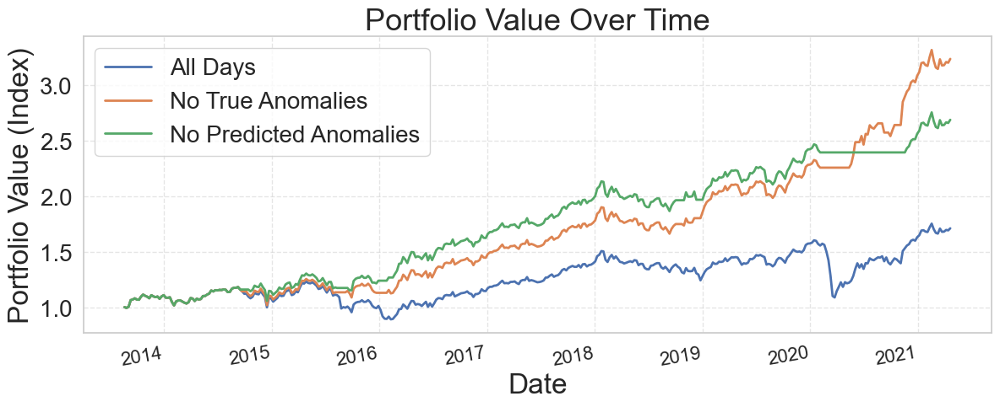

In [150]:
fig, ax = plt.subplots(figsize=(12, 5))

# Thicker lines; rely on default color cycle rather than hard‐coding colors
ax.plot(dates, port_all,    linewidth=2, label='All Days')
ax.plot(dates, port_no_true,linewidth=2, label='No True Anomalies')
ax.plot(dates, port_no_pred,linewidth=2, label='No Predicted Anomalies')

# Title and axis labels in English, with specified font sizes
ax.set_title('Portfolio Value Over Time',    fontsize=26)
ax.set_xlabel('Date',                         fontsize=24)
ax.set_ylabel('Portfolio Value (Index)',      fontsize=24)

# Legend formatting
ax.legend(fontsize=20, frameon=True)

# Grid style for better contrast
ax.grid(True, linestyle='--', alpha=0.5)

# Make ticks larger and rotate them for readability
plt.setp(ax.get_xticklabels(), fontsize=16, rotation=10, ha='right')
plt.setp(ax.get_yticklabels(), fontsize=20)

plt.tight_layout()
plt.show()


In [131]:

# Load data
df = pd.read_excel('Dataset4_EWS.xlsx', sheet_name='Markets')
df.set_index('Data', inplace=True)

# Define test period (post-2016) and equity indices
test = df.loc['2017-01-01':'2020-12-31'].copy()
idx = ['MXUS','MXEU','MXJP','MXBR','MXRU','MXIN','MXCN']

# Compute period returns (here weekly)
returns = test[idx].pct_change().dropna()

# Portfolio returns = equally-weighted average
port_ret = returns.mean(axis=1)

# Scenario 1: All trading days
port_val1 = (1 + port_ret).cumprod() * 100
# Prepend starting value at first date
start_date = returns.index[0] - pd.Timedelta(days=7)
port_val1 = pd.concat([pd.Series(100, index=[start_date]), port_val1]).sort_index()

# Scenario 2: Exclude anomaly days
# Identify normal (non-anomaly) dates
normal_dates = test.loc[test['Y']==0].index.sort_values()
# Compute returns only between consecutive normal dates
port_val2 = pd.Series([100], index=[normal_dates[0]])
for prev_date, curr_date in zip(normal_dates[:-1], normal_dates[1:]):
    # If dates are consecutive (7-day gap), use actual return; otherwise, return=0
    if (curr_date - prev_date).days == 7:
        # Average return across indices from prev_date to curr_date
        ret = (test.loc[curr_date, idx] / test.loc[prev_date, idx] - 1).mean()
    else:
        ret = 0.0
    new_val = port_val2.iloc[-1] * (1 + ret)
    port_val2.loc[curr_date] = new_val

# 6. Scenario C: exclude anomalies by TRUE labels
normal_lab = test.index[test['Y'] == 0]
port_lab = pd.Series([100], index=[normal_lab[0]])
for prev, curr in zip(normal_lab[:-1], normal_lab[1:]):
    if (curr - prev).days == 7:
        ret = (test.loc[curr, idx] / test.loc[prev, idx] - 1).mean()
    else:
        ret = 0.0
    port_lab.loc[curr] = port_lab.iloc[-1] * (1 + ret)

# Align both series on same timeline (anomaly gaps appear as NaN for port_val2)
all_dates = test.index.union([start_date])
portfolio_df = pd.DataFrame(index=all_dates)
portfolio_df['AllDays'] = port_val1.reindex(all_dates)
portfolio_df['NoAnomaly'] = port_val2.reindex(all_dates)
portfolio_df['Supervised_Anomaly'] = port_lab.reindex(all_dates)

# Compute max drawdown and days-to-recovery
def compute_drawdown(series):
    peak = series.expanding().max()
    drawdown = (series - peak) / peak
    mdd = drawdown.min()
    trough_date = drawdown.idxmin()
    peak_val = peak.loc[trough_date]
    # Find recovery date
    post = series.loc[trough_date:]
    recover_idx = post[post >= peak_val].first_valid_index()
    days_recovery = None
    if recover_idx is not None:
        days_recovery = series.index.get_loc(recover_idx) - series.index.get_loc(trough_date)
    return float(mdd), int(days_recovery), trough_date, recover_idx

mdd1, rec1, trough1, rec_idx1 = compute_drawdown(portfolio_df['AllDays'].dropna())
mdd2, rec2, trough2, rec_idx2 = compute_drawdown(portfolio_df['NoAnomaly'].dropna())
mdd3, rec3, trough3, rec_idx3 = compute_drawdown(portfolio_df['Supervised_Anomaly'].dropna())

print(f"All-Days MDD: {mdd1:.4%}, Trough: {trough1.date()}, Recovery idx: {rec1} periods later")
print(f"No-Anomaly MDD: {mdd2:.4%}, Trough: {trough2.date()}, Recovery idx: {rec2} periods later")


All-Days MDD: -32.1141%, Trough: 2020-03-24, Recovery idx: 38 periods later
No-Anomaly MDD: -12.5474%, Trough: 2018-09-11, Recovery idx: 12 periods later


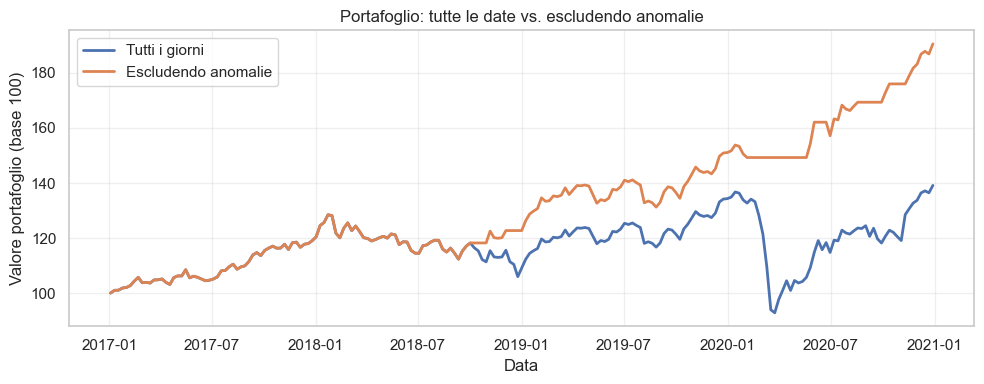

In [132]:
import matplotlib.pyplot as plt

# Crea una versione “riempita” in avanti (forward-fill) della serie NoAnomaly:
no_anom_ffill = portfolio_df['NoAnomaly'].ffill()

plt.figure(figsize=(10, 4))
plt.plot(portfolio_df.index, portfolio_df['AllDays'], label='Tutti i giorni', linewidth=2)
plt.plot(portfolio_df.index, no_anom_ffill, label='Escludendo anomalie', linewidth=2)
plt.xlabel('Data')
plt.ylabel('Valore portafoglio (base 100)')
plt.title('Portafoglio: tutte le date vs. escludendo anomalie')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### MLP with OPTUNA

In [106]:
# LAYER_MAP = {
#     3: (256, 128,  64),
#     4: (512, 256, 128,  64),
#     5: (512, 256, 128,  64, 32),
#     6: (512, 256, 128,  64, 32, 16),
# }

# def objective(trial):
#     # pick an int 3…6
#     k = trial.suggest_int("n_layers", 3, 6)
#     hidden_layer_sizes = LAYER_MAP[k]

#     lr         = trial.suggest_loguniform("learning_rate_init", 1e-4, 1e-1)
#     alpha      = trial.suggest_loguniform("alpha",            1e-6, 1e-2)
#     activation = trial.suggest_categorical("activation", ["relu", "tanh"])

#     model = MLPClassifier(
#         hidden_layer_sizes=hidden_layer_sizes,
#         learning_rate_init=lr,
#         alpha=alpha,
#         activation=activation,
#         solver="adam",
#         max_iter=1000,
#         early_stopping=True,
#         n_iter_no_change=20,
#         random_state=42,
#     )

#     model.fit(X_train, Y_train)
#     probs = model.predict_proba(X_val)[:, 1]
#     preds = (probs > best_thresh).astype(int)
#     return f1_score(Y_val, preds)



# study = optuna.create_study(
#     study_name='MPL_Study',
#     storage='sqlite:///optuna_MPL.db',
#     load_if_exists=True,
#     direction='maximize',
#     pruner=optuna.pruners.MedianPruner()
# )
# study.optimize(objective, n_trials=5, show_progress_bar=True)

# print("Best F1:", study.best_value)
# print("Best hyper-parameters:", study.best_params)


In [107]:
# best_params = study.best_params

# # Rebuild the tuple from the 'n_layers' entry
# hidden_layer_sizes = LAYER_MAP[best_params["n_layers"]]

# final_model = MLPClassifier(
#     hidden_layer_sizes=hidden_layer_sizes,
#     learning_rate_init=best_params["learning_rate_init"],
#     alpha=           best_params["alpha"],
#     activation=      best_params["activation"],
#     solver="adam",
#     max_iter=2000,
#     early_stopping=True,
#     n_iter_no_change=20,
#     random_state=42,
# )

# # retrain & evaluate as before
# X_trainval = np.vstack([X_train, X_val])
# Y_trainval = np.hstack([Y_train, Y_val])
# final_model.fit(X_trainval, Y_trainval)

# Y_test_prob = final_model.predict_proba(X_test)[:,1]
# Y_test_pred = (Y_test_prob > best_thresh).astype(int)
# precision, recall, f1, finscore = evaluate_model(
#     Y_test, Y_test_pred, y_score=Y_test_prob,
#     model_name="MLP (optuna)", mean_anomaly=mean_anomaly, mean_normal=mean_normal
# )
# results.append({
#     "model":    "MLP (optuna)",
#     "precision": precision,
#     "recall":    recall,
#     "f1":        f1,
#     "finscore":  finscore,
# })

In [108]:
# compare_dim_reductions(X_test, Y_test, Y_test_pred, model_name="MLP (optuna)")

In [109]:
import shap

# 1. Fit the SHAP explainer on a small background sample
explainer = shap.KernelExplainer(model.predict_proba, shap.sample(X_train, 100))

# 2. Compute SHAP values for the class of interest (say, class=1)
shap_vals = explainer.shap_values(X_test, nsamples=200)[1]  # shape: (n_samples, n_features)

# 3. Compute mean absolute SHAP per feature
mean_abs = np.abs(shap_vals).mean(axis=1)

feature_names = stationary_df.columns

# 5. Sort by importance and take cumulative sum
idx = np.argsort(mean_abs)[::-1]

  0%|          | 0/223 [00:00<?, ?it/s]

KeyboardInterrupt: 

c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  warnings.warn(
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but MLPClassifier was fitted without feature names
  

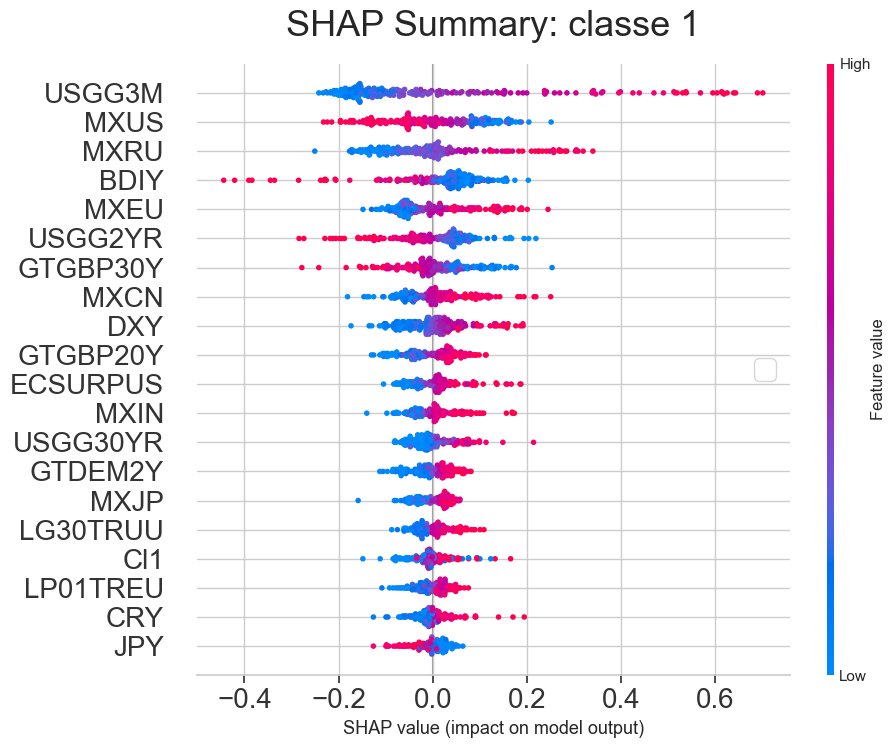

In [ ]:
X_train_df = pd.DataFrame(X_train, columns=feature_names)
X_test_df  = pd.DataFrame(X_test,  columns=feature_names)

# 2) Use the new Explainer API (no bias column, no shape mismatches):
explainer = shap.Explainer(model.predict_proba, X_train_df)
sv        = explainer(X_test_df)               # <— now sv.values is (223,42)

# print("SHAP array shape:", sv.values.shape)    # should print (223, 42)

# 3) SHAP summary plot on class 1:
shap.summary_plot(
    sv[:, :, 0],        # pick class-1 values: shape (223, 42)
    X_test_df,
    show=False
)


C:\Users\nicol\AppData\Local\Temp\ipykernel_16892\3561031703.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
C:\Users\nicol\AppData\Local\Temp\ipykernel_16892\3561031703.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=20)


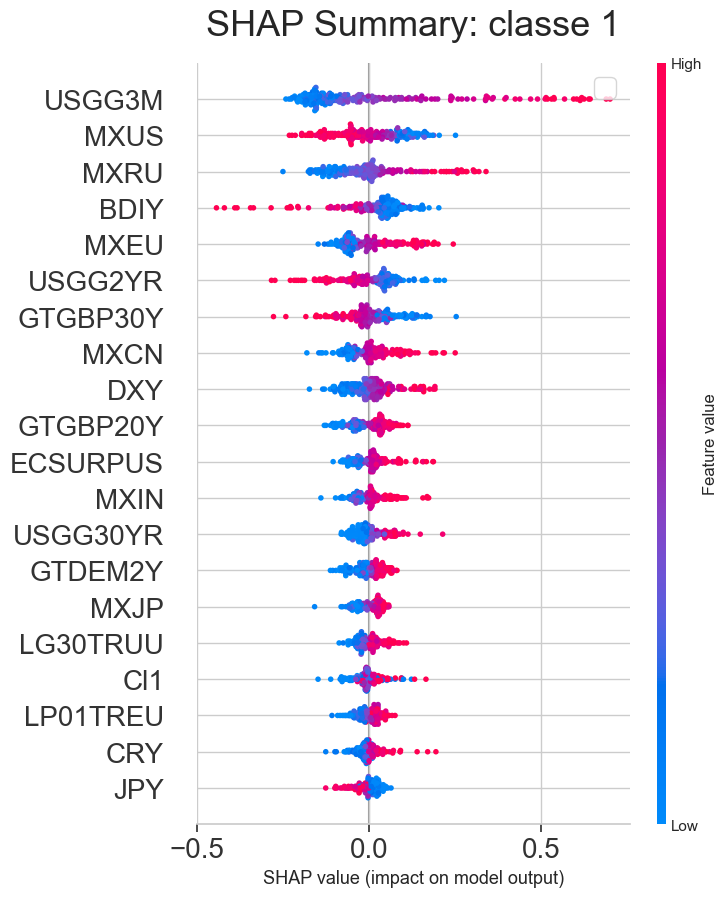

In [ ]:

# 1) Crea il summary plot senza mostrarlo immediatamente
shap.summary_plot(
    sv[:, :, 1],        # valori SHAP per la classe 1: shape (223, 42)
    X_test_df,
    show=False,  # (width, height) in pollici
)

# 2) Recupera la figura e l'axes correnti
fig = plt.gcf()
ax  = plt.gca()

# 3) Imposta titolo e dimensioni font
ax.set_title("SHAP Summary: classe 1", fontsize=26, pad=20)
# ax.set_xlabel("Valore SHAP (impatto sul modello)", fontsize=16)
# ax.set_ylabel("Feature", fontsize=20)

# 4) Opzionale: imposta dimensione tick-labels
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.legend(fontsize=20)

# 5) Ottimizza layout e mostra
plt.tight_layout()
plt.show()


C:\Users\nicol\AppData\Local\Temp\ipykernel_16892\1850132942.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
C:\Users\nicol\AppData\Local\Temp\ipykernel_16892\1850132942.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(


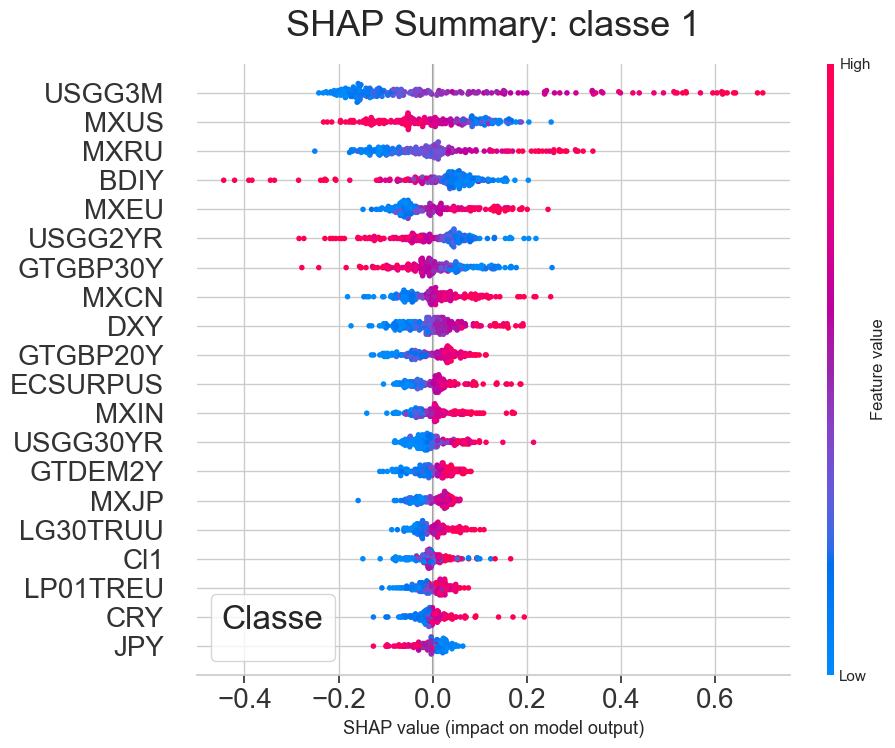

In [ ]:
import matplotlib.pyplot as plt

# 1) Crea il summary plot senza mostrarlo immediatamente
shap.summary_plot(
    sv[:, :, 1],        # valori SHAP per la classe 1: shape (223, 42)
    X_test_df,
    show=False,
    plot_size=(10, 8)   # (width, height) in pollici
)

# 2) Recupera la figura e l'axes correnti
fig = plt.gcf()
ax  = plt.gca()

# 3) Imposta titolo e dimensioni font
ax.set_title("SHAP Summary: classe 1", fontsize=26, pad=20)
# ax.set_xlabel("Valore SHAP (impatto sul modello)", fontsize=16)
# ax.set_ylabel("Feature", fontsize=20)

# 4) Opzionale: imposta dimensione tick-labels
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.legend(
    fontsize=20,        # dimensione del testo delle voci
    title="Classe",     # titolo della legenda
    title_fontsize=24   # dimensione del titolo
)

# 5) Ottimizza layout e mostra
plt.tight_layout()
plt.show()


In [ ]:
# from sklearn.inspection import PartialDependenceDisplay

# PartialDependenceDisplay.from_estimator(
#     model, 
#     X_train_df, 
#     feature_names, 
#     target=1,
#     kind="average"     # or "both" for ICE+PDP
# )
# plt.tight_layout()
# plt.show()

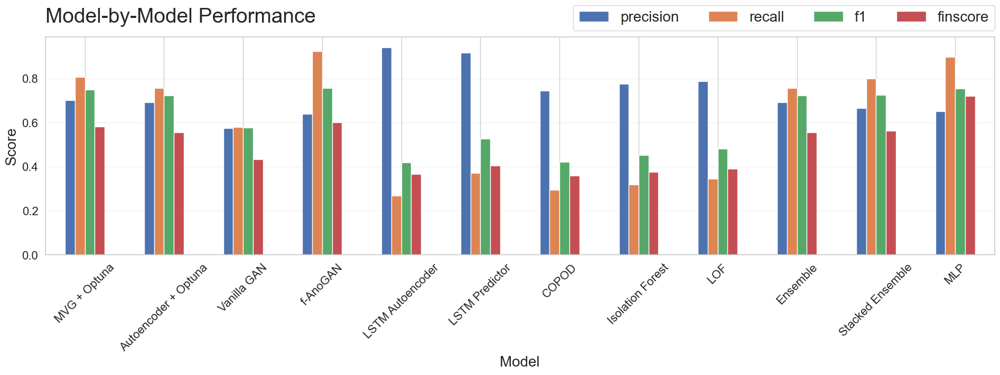

In [ ]:
metrics_df = pd.DataFrame(results).set_index("model").round(3)
# display(metrics_df)

# # quick bar‑plot of F1 & FinScore
# metrics_df.plot.bar(figsize=(20,8), rot=45);
# plt.title("Model‑by‑Model Performance"); plt.ylabel("score");

plt.rcParams.update({
    'font.size': 24,           # font di base
    'axes.titlesize': 26,      # titolo degli assi
    'axes.labelsize': 16,      # etichette degli assi
    'xtick.labelsize': 20,     # tick asse x
    'ytick.labelsize': 20,     # tick asse y
    'legend.fontsize': 20,     # testo legenda
    'legend.title_fontsize': 18 # titolo legenda
})

# Creo la figura
fig, ax = plt.subplots(figsize=(20, 8))

# Bar plot
metrics_df.plot.bar(ax=ax, rot=45)

# Titolo e etichette con fontsize esplicito (se vuoi sovrascrivere)
ax.set_title("Model-by-Model Performance", fontsize=28, pad=20, loc='left')
ax.set_xlabel("Model", fontsize=20)
ax.set_ylabel("Score", fontsize=20)

# Regolo i tick
ax.tick_params(axis='x', rotation=45, labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Legenda
# ax.legend(loc="upper left")
# 2) Legenda in basso, centrata
ax.legend(
    loc='upper center',
    ncol=4,
    bbox_to_anchor=(0.778, +1.18)
)

# Aggiungo griglia orizzontale per facilità di lettura
ax.grid(axis='y', alpha=0.3)

# Spazio attorno alla figura
plt.tight_layout()

plt.show()

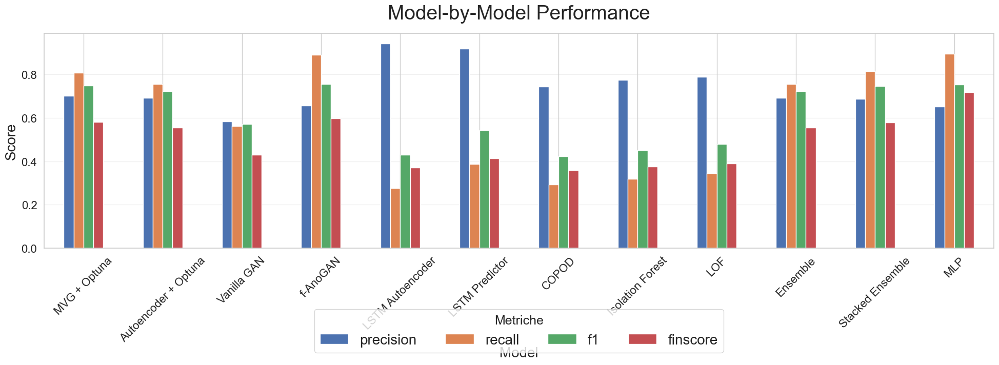

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))

metrics_df.plot.bar(ax=ax, rot=45)
ax.set_title("Model-by-Model Performance", fontsize=28, pad=20)
ax.set_xlabel("Model", fontsize=20)
ax.set_ylabel("Score", fontsize=20)
ax.tick_params(axis='x', rotation=45, labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.grid(axis='y', alpha=0.3)

# 2) Legenda in basso, centrata
ax.legend(
    title="Metriche",
    loc='upper center',
    ncol=4,
    bbox_to_anchor=(0.5, -0.25)
)

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, precision_recall_curve, auc


feature_names = X_df.columns.tolist()
results = []

for feat in feature_names:
    # 1) Slice out just this column
    Xf = X_df[[feat]].values         # shape (n_samples,1)
    Xf_train, Xf_test, y_train, y_test = train_test_split(
        Xf, Y, stratify=Y, random_state=0
    )

    # 2) Train the same MLP architecture
    mlp_uni = MLPClassifier(
    hidden_layer_sizes=(512, 256, 128, 64, 32, 16),
    activation='relu',
    solver='adam',
    random_state=42
)
    mlp_uni.fit(Xf_train, y_train)

    # 3) Predict & score
    yprob = mlp_uni.predict_proba(Xf_test)[:,1]
    auc_roc = roc_auc_score(y_test, yprob)
    acc    = accuracy_score(y_test, mlp_uni.predict(Xf_test))
    precision, recall, _ = precision_recall_curve(y_test, yprob)
    auc_pr = auc(recall, precision)

    results.append({
        "feature": feat,
        "roc_auc": auc_roc,
        "pr_auc": auc_pr,
        "accuracy": acc,
        "model": mlp_uni
    })

results_df = pd.DataFrame(results).sort_values("roc_auc", ascending=False)


In [ ]:
print("X_test_df shape:", X_df.shape)   # e.g. (223,42)
print("y_test shape:",    y_test.shape)      # must also be (223,)

X_test_df shape: (1111, 42)
y_test shape: (278,)


In [ ]:
from sklearn.inspection import permutation_importance
import pandas as pd
import matplotlib.pyplot as plt

# assume model is your trained MLPClassifier, X_test_df is your 223×42 DataFrame, y_test is the labels
X_train, X_test, y_train, y_test = train_test_split(
    X_df.values, Y, stratify=Y, random_state=0
)


r = permutation_importance(
    model, 
    X_test, 
    y_test, 
    n_repeats=30, 
    random_state=42, 
    scoring="roc_auc"
)

# build a DataFrame of importances
perm_imp = pd.DataFrame({
    "feature": X_test_df.columns,
    "importance_mean": r.importances_mean,
    "importance_std": r.importances_std
}).sort_values("importance_mean", ascending=False)

# # bar‐plot
# plt.figure(figsize=(8,6))
# plt.barh(perm_imp["feature"], perm_imp["importance_mean"])
# plt.errorbar(
#     perm_imp["importance_mean"], 
#     perm_imp["feature"], 
#     xerr=perm_imp["importance_std"], 
#     fmt="none", 
#     ecolor="gray"
# )
# plt.gca().invert_yaxis()
# plt.xlabel("Decrease in ROC AUC when shuffled")
# plt.title("Permutation Importances for MLP")
# plt.tight_layout()
# plt.show()


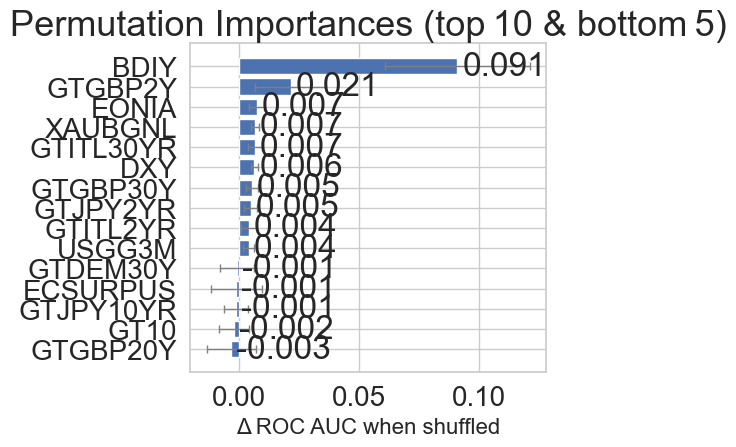

In [ ]:
# perm_imp: your DataFrame sorted by "importance_mean" descending
# e.g. perm_imp = perm_imp.sort_values("importance_mean", ascending=False)

# 1) keep only top 10 (and optionally bottom 5)
topn = 10
bottomm = 5

keep = pd.concat([perm_imp.head(topn), perm_imp.tail(bottomm)])
keep = keep.sort_values("importance_mean")  # ascending so largest at bottom

# 2) plot
plt.figure(figsize=(6,5))
bars = plt.barh(keep["feature"], keep["importance_mean"], xerr=keep["importance_std"], 
                error_kw=dict(ecolor="gray", lw=1, capsize=3))
plt.xlabel("Δ ROC AUC when shuffled")
plt.title("Permutation Importances (top 10 & bottom 5)")

# 3) annotate each bar with its mean value
for bar, val in zip(bars, keep["importance_mean"]):
    plt.text(val + 0.002, bar.get_y() + bar.get_height()/2,
             f"{val:.3f}", va="center")

plt.tight_layout()
plt.show()


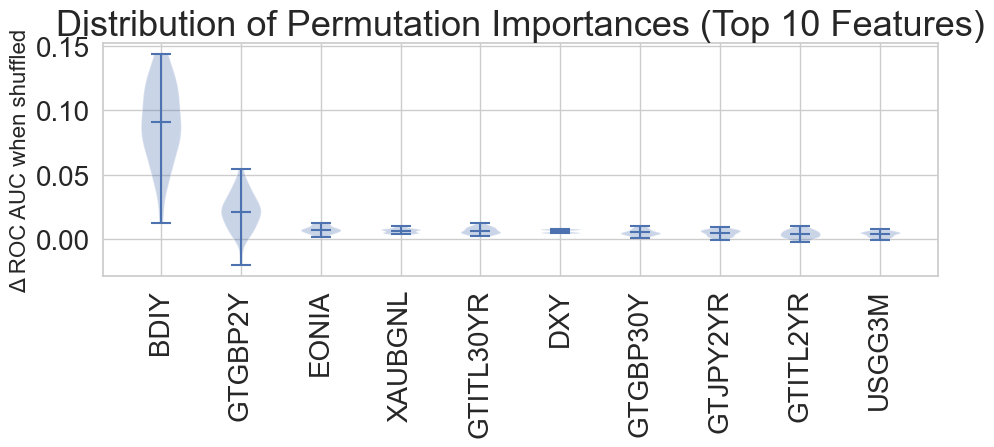

In [ ]:
# suppose r = permutation_importance(...) from before
feat_arr = np.array(X_test_df.columns)
means    = r.importances_mean
top_idx  = np.argsort(means)[::-1][:10]   # top 10 features by mean drop
top_vals = r.importances[top_idx]          # shape (10, n_repeats)

plt.figure(figsize=(10,5))
plt.violinplot([v for v in top_vals], showmeans=True)

# fix the xtick labels:
labels = feat_arr[top_idx]
plt.xticks(np.arange(1, len(top_idx)+1), labels, rotation=90)

plt.ylabel("Δ ROC AUC when shuffled")
plt.title("Distribution of Permutation Importances (Top 10 Features)")
plt.tight_layout()
plt.show()


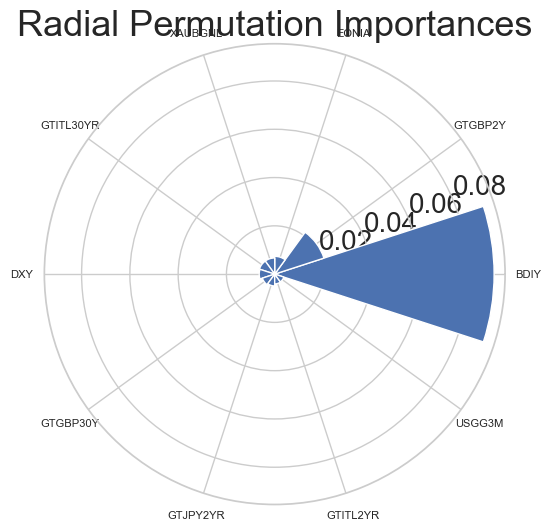

In [ ]:
# make a numpy array of names
feat_arr = np.array(X_test_df.columns)  
# grab the top-N labels
labels   = feat_arr[top_idx]         
N = 10   

angles = np.linspace(0, 2*np.pi, N, endpoint=False)
radii  = means[top_idx]
width  = 2*np.pi / N

fig = plt.figure(figsize=(6,6))
ax  = fig.add_subplot(111, polar=True)
bars = ax.bar(angles, radii, width=width, bottom=0.0)

ax.set_xticks(angles)
ax.set_xticklabels(labels, fontsize=8)    # now works
ax.set_title("Radial Permutation Importances")

plt.tight_layout()
plt.show()


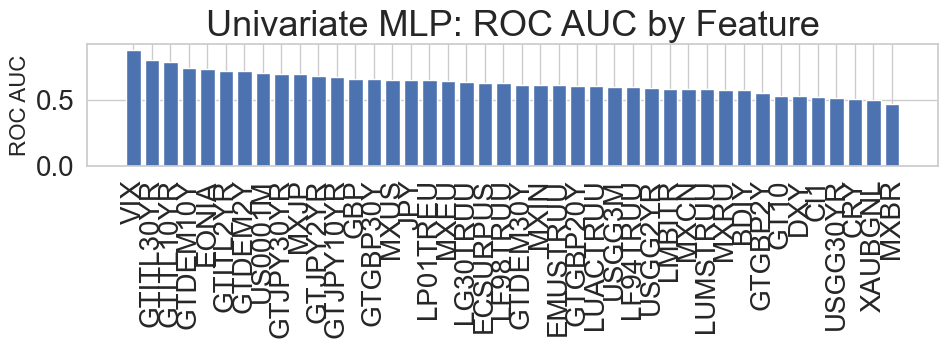

In [ ]:
plt.figure(figsize=(10,4))
plt.bar(results_df["feature"], results_df["roc_auc"])
plt.xticks(rotation=90)
plt.ylabel("ROC AUC")
plt.title("Univariate MLP: ROC AUC by Feature")
plt.tight_layout()
plt.show()


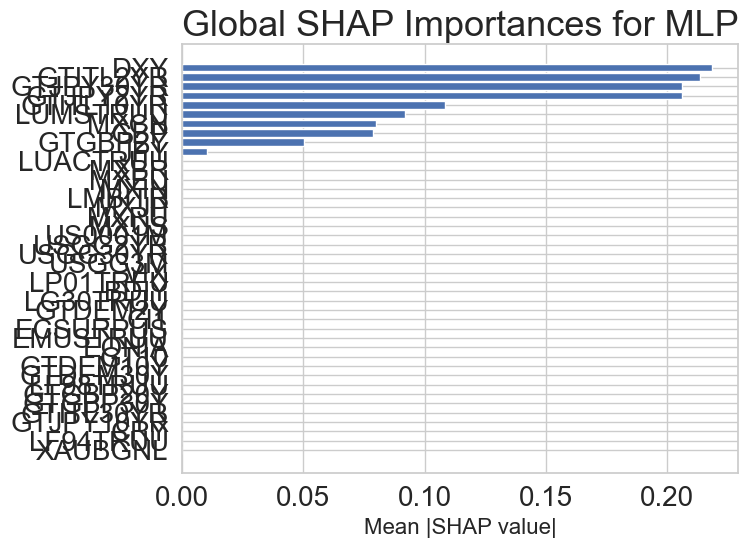

In [ ]:

feat_imp_shap = pd.DataFrame({
    "feature": feature_names,
    "mean_abs_shap": mean_abs
}).sort_values("mean_abs_shap", ascending=False)

# bar‐plot
plt.figure(figsize=(8,6))
plt.barh(feat_imp_shap["feature"], feat_imp_shap["mean_abs_shap"])
plt.gca().invert_yaxis()
plt.xlabel("Mean |SHAP value|")
plt.title("Global SHAP Importances for MLP")
plt.tight_layout()
plt.show()


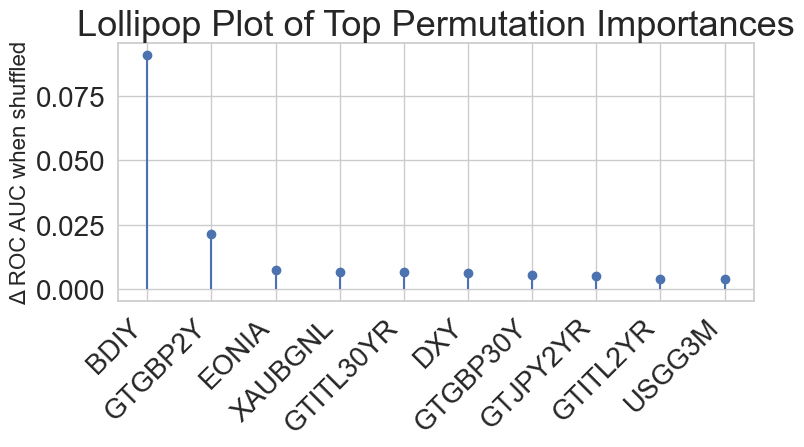

In [ ]:
# means and feat_arr/top_idx from before
labels = feat_arr[top_idx]   # your top-N feature names
values = means[top_idx]      # corresponding importances
y_pos  = np.arange(len(top_idx))

plt.figure(figsize=(8,5))
markerline, stemlines, baseline = plt.stem(
    y_pos, 
    values, 
    basefmt=" ",      # no baseline line
    linefmt="-",      # solid stems
    markerfmt="o"     # circular markers
)
plt.xticks(y_pos, labels, rotation=45, ha="right")
plt.ylabel("Δ ROC AUC when shuffled")
plt.title("Lollipop Plot of Top Permutation Importances")
plt.tight_layout()
plt.show()


  0%|          | 0/278 [00:00<?, ?it/s]

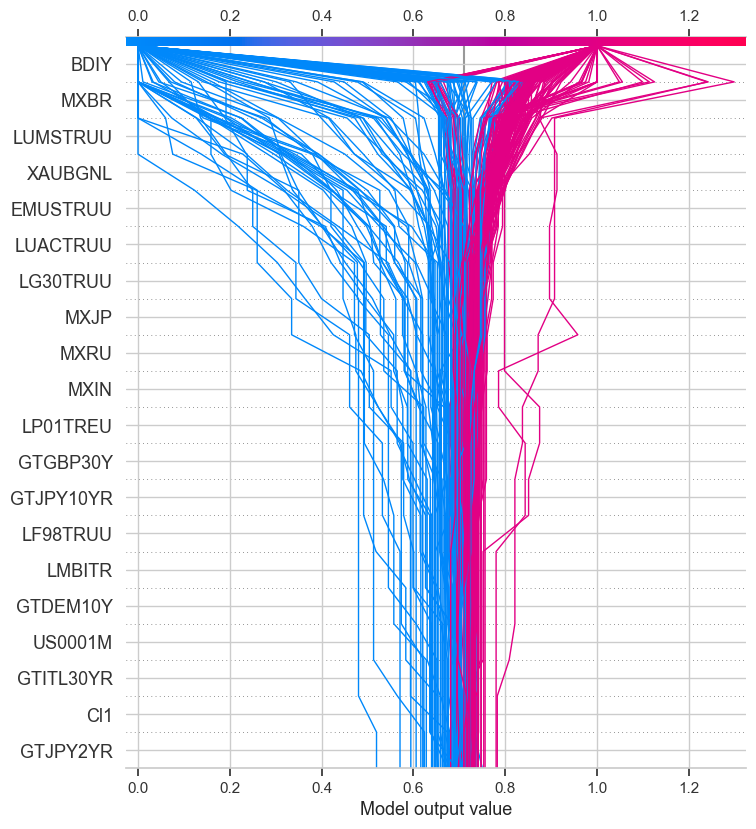

In [ ]:
import shap

X_train_df = pd.DataFrame(X_train, columns=feature_names)
X_test_df  = pd.DataFrame(X_test, columns=feature_names)

# sample a small background set for the explainer
background = shap.sample(X_train_df, 100, random_state=0)

# build the explainer
f = lambda x: model.predict_proba(x)[:,1]
explainer = shap.KernelExplainer(f, background)

# compute
shap_vals = explainer.shap_values(X_test_df.iloc[:], nsamples=200)

# plot
shap.decision_plot(
    explainer.expected_value,
    shap_vals,
    X_test_df.iloc[:]
)

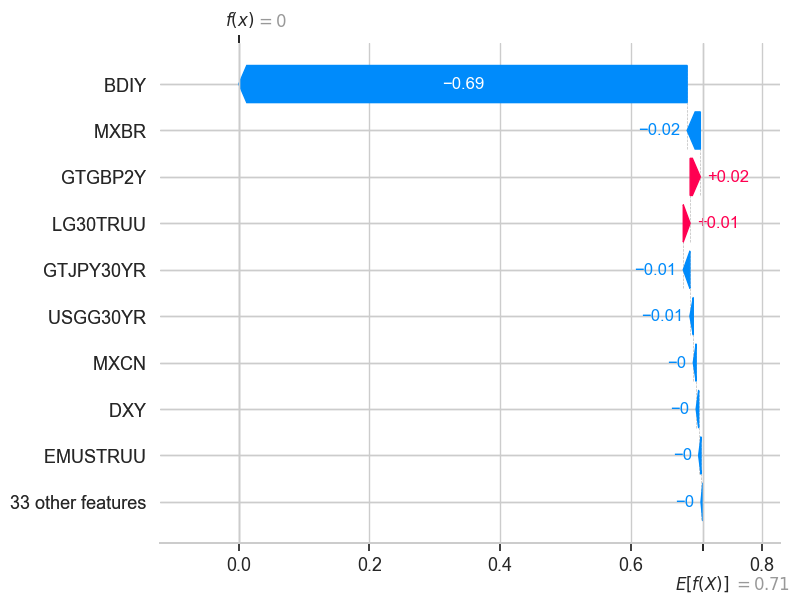

In [ ]:
# Waterfall for sample idx=17
shap.plots._waterfall.waterfall_legacy(explainer.expected_value, shap_vals[17], X_test_df.iloc[17])

# 14. Comparative Analysis and Evaluation



,feature,roc_auc,pr_auc,accuracy
model,,,,
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",BDIY,0.569,0.240,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",CRY,0.507,0.240,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",Cl1,0.516,0.262,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",DXY,0.523,0.262,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",ECSURPUS,0.628,0.382,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",EMUSTRUU,0.608,0.308,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",EONIA,0.734,0.494,0.813
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",GBP,0.657,0.328,0.788
"MLPClassifier(hidden_layer_sizes=(512, 256, 128, 64, 32, 16), random_state=42)",GT10,0.525,0.239,0.788


c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\nicol\GitHub_Nick\Fintech_group13\myenv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


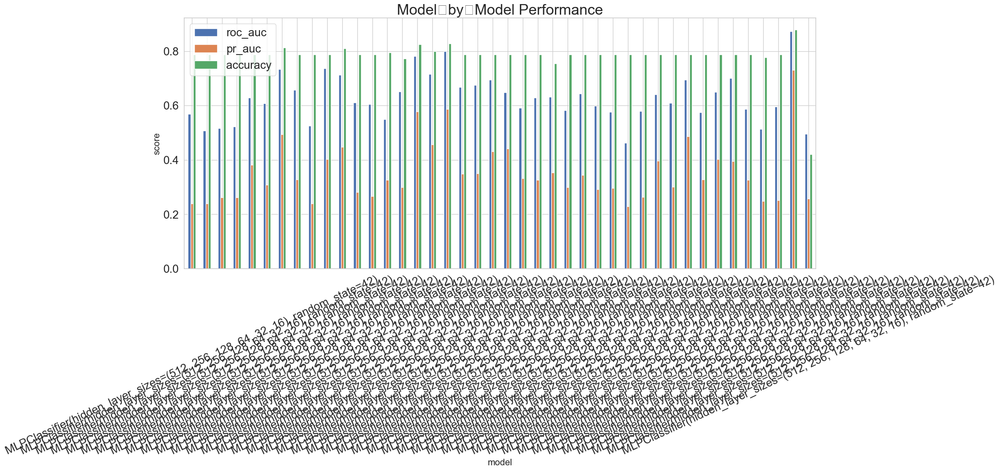

In [ ]:
metrics_df = pd.DataFrame(results).set_index("model").round(3)
display(metrics_df)

# quick bar‑plot of F1 & FinScore
metrics_df.plot.bar(figsize=(20,8), rot=25);
plt.title("Model‑by‑Model Performance"); plt.ylabel("score");

# 15. Bibliography

* [UBS Global Investment Returns Yearbook 2025](https://www.ubs.com/global/en/investment-bank/insights-and-data/2025/global-investment-returns-yearbook-2025.html)

* [A Survey of Systemic Risk Analytics – OFR Working Paper 0001](https://www.financialresearch.gov/working-papers/files/.OFRwp0001_BisiasFloodLoValavanis_ASurveyOfSystemicRiskAnalytics.pdf)

* [Risk Measurement and Systemic Risk](https://www.bis.org/cgfs/conf/mar02.htm)

* [A Systematic Review of Early Warning System in Finance](https://arxiv.org/pdf/2310.00490)

* [Systemic Risk Measures: Taking Stock from 1927 to 2023](https://www.nber.org/system/files/working_papers/w33211/w33211.pdf)

*  [Augmented Dickey-Fuller](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html)

* [the Bloomberg Economic US Surprise Index](https://www.babypips.com/forexpedia/bloomberg-us-economic-surprise-index#:~:text=The%20Bloomberg%20U.S.%20Economic%20Surprise,downside%20relative%20to%20market%20expectations)

* [Autoencoders](https://en.wikipedia.org/wiki/Autoencoder)

* [Deep Learning - Autoencoders](https://www.deeplearningbook.org/contents/autoencoders.html)

* [A comprehensive study of auto-encoders for anomaly detection: Efficiency and trade-offs](https://www.sciencedirect.com/science/article/pii/S2666827024000483?dgcid=rss_sd_all)

* [Wikipedia: Generative Adversarial Network](https://en.wikipedia.org/wiki/Generative_adversarial_network)

* [Survey: GANs for Anomaly Detection (arXiv)](https://arxiv.org/pdf/1906.11632)


* [Understanding LSTM Networks](https://colah.github.io/posts/2015-08-Understanding-LSTMs/)

* [Time Series Anomaly Detection Using LSTM Autoencoders](https://towardsdatascience.com/time-series-anomaly-detection-using-lstm-autoencoder-9f40cddc9e2e)


* [COPOD: Copula-Based Outlier Detection (arXiv)](https://arxiv.org/abs/2001.01565)  
  *Original paper introducing the method.*

* [PyOD Documentation – COPOD](https://pyod.readthedocs.io/en/latest/pyod.models.html#copod)  
  *Implementation and usage details in the PyOD library.*

* [Isolation Forest (Original Paper)](https://cs.nju.edu.cn/zhouzh/zhouzh.files/publication/icdm08b.pdf)  
  *Original paper by Liu, Ting, and Zhou.*

* [Scikit-learn Documentation – IsolationForest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html)  
  *Native implementation in Scikit-learn.*

* [PyOD Documentation – IForest](https://pyod.readthedocs.io/en/latest/pyod.models.html#iforest)  
  *Extended features and wrapper via the PyOD library.*

* [LOF: Identifying Density-Based Local Outliers (Original Paper)](https://www.dbs.ifi.lmu.de/Publikationen/Papers/LOF.pdf)  
  *Breunig et al., 2000.*

* [Scikit-learn Documentation – LOF](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html)  
  *Built-in support in sklearn for unsupervised LOF.*

* [PyOD Documentation – LOF](https://pyod.readthedocs.io/en/latest/pyod.models.html#lof)  
  *PyOD wrapper for additional tools like scoring and model export.*

* [Anomaly Detection Ensemble Approaches (ODDS)](http://odds.cs.stonybrook.edu)  
  *Benchmark and theory resources for anomaly ensembles.*

* [PyOD Documentation – Combination Methods](https://pyod.readthedocs.io/en/latest/pyod.models.combination.html)  
  *PyOD's built-in tools for score-level ensemble methods.*

* [Stacked Generalization (Wolpert, 1992)](https://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.40.334)  
  *Foundational paper on stacking in machine learning.*

* [PyOD + scikit-learn Ensemble Tutorial](https://pyod.readthedocs.io/en/latest/pyod.models.combination.html)  
  *Documentation on combining models and integrating supervised classifiers.*